# **Feature Engineering**

## Objectives

* Engineer features for modelling

## Inputs

The inputs are the cleaned data set from the Data Cleaning notebook.

* outputs/datasets/cleaned/TrainSetCleaned.csv
* outputs/datasets/cleaned/TestSetCleaned.csv

## Outputs

* A list of variables to engineer, and what engineering is to be performed on them

## Conclusions

The following transformations will be used for feature engineering, as part of the ML pipeline:

- Log Base e Transformation: LotArea, LotFrontage
- Power Transformation: 2ndFlrSF, BsmtExposure, BsmtFinSF1, BsmtUnfSF, TotalBsmtSF, GarageArea
- Dropped Variables: 1stFlrSF, GarageYrBlt, GrLivArea, YearRemodAdd


---

# Change working directory

We need to change the working directory from its current folder to its parent folder
* We access the current directory with os.getcwd()

In [1]:
import os
current_dir = os.getcwd()
current_dir

'/workspace/heritage-housing/jupyter_notebooks'

We want to make the parent of the current directory the new current directory
* os.path.dirname() gets the parent directory
* os.chir() defines the new current directory

In [2]:
os.chdir(os.path.dirname(current_dir))
print("You set a new current directory")

You set a new current directory


Confirm the new current directory

In [3]:
current_dir = os.getcwd()
current_dir

'/workspace/heritage-housing'

---

# Load Cleaned Data

Train Set:

In [5]:
import pandas as pd
train_set_path = "outputs/datasets/cleaned/TrainSetCleaned.csv"
TrainSet = pd.read_csv(train_set_path)
TrainSet.head(3)

,1stFlrSF,2ndFlrSF,BedroomAbvGr,BsmtExposure,BsmtFinSF1,BsmtFinType1,BsmtUnfSF,EnclosedPorch,GarageArea,GarageFinish,...,LotFrontage,MasVnrArea,OpenPorchSF,OverallCond,OverallQual,TotalBsmtSF,WoodDeckSF,YearBuilt,YearRemodAdd,SalePrice
0,1828,0.0,3.0,Av,48,Unf,1774,0.0,774,Unf,...,90.0,452.0,108,5,9,1822,0.0,2007,2007,314813
1,894,0.0,2.0,No,0,Unf,894,0.0,308,Unf,...,60.0,0.0,0,5,5,894,0.0,1962,1962,109500
2,964,0.0,2.0,No,713,ALQ,163,0.0,432,Unf,...,80.0,0.0,0,7,5,876,0.0,1921,2006,163500


Test Set:

In [6]:
test_set_path = 'outputs/datasets/cleaned/TestSetCleaned.csv'
TestSet = pd.read_csv(test_set_path)
TestSet.head(3)

,1stFlrSF,2ndFlrSF,BedroomAbvGr,BsmtExposure,BsmtFinSF1,BsmtFinType1,BsmtUnfSF,EnclosedPorch,GarageArea,GarageFinish,...,LotFrontage,MasVnrArea,OpenPorchSF,OverallCond,OverallQual,TotalBsmtSF,WoodDeckSF,YearBuilt,YearRemodAdd,SalePrice
0,2515,0.0,4.0,No,1219,Rec,816,0.0,484,Unf,...,70.049958,0.0,0,3,6,2035,0.0,1957,1975,200624
1,958,620.0,3.0,No,403,BLQ,238,0.0,240,Unf,...,79.000000,0.0,0,7,6,806,0.0,1941,1950,133000
2,979,224.0,3.0,No,185,LwQ,524,0.0,352,Unf,...,70.049958,161.0,0,4,5,709,0.0,1950,1950,110000


---

# Data Exploration

In feature engineering, it is nececssary to evaluate which potential transformation could be performed on the variables, which is where data exploration can help.

In [7]:
from pandas_profiling import ProfileReport
pandas_report = ProfileReport(df=TrainSet, minimal=True)
pandas_report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Key Points:
- A number of the variables are categorical (BsmtExposure, BsmtFinType1, GarageFinish, KitchenQual). Categorical Variable Encoding should be used to convert these into integers to allow the modelling algorithms to function.
- Many variables have skewed distributions. The modelling algorithms are more suitable to data that is normally distributed. Engineering will be performed to see if a distribution closer to a normal distribution can be achieved for each variable.
- From reviewing the Histogram and Extreme Values tabs for each variable, some have some datapoints that appear to be outliers, which could indicate erroneous data and may negatively impact the models. Engineering will be performed to remove these outliers.

## Correlation and PPS Analysis

Correlation and PPS analysis has been performed within the House Price Correlation notebook. However, this was on the raw datasets, and therefore will be reperformed here on the cleaned datasets.

Some custom functions are defined below, with the following two being called:
- CalculateCorrAndPPS(): calculates the correlation tables and PPS table for a dataset, and prints the Q1 and Q3 for PPS scores.
- DisplayCorrAndPPS(): provides a visualisation of the correlation and PPS of the data.

Note: These custom functions have been taken from the Code Institute learning materials, from the lesson notebook "Predictive Power Score Unit 1".

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import ppscore as pps
%matplotlib inline

def heatmap_corr(df, threshold, figsize=(20, 12), font_annot=8):
    if len(df.columns) > 1:
        mask = np.zeros_like(df, dtype=np.bool)
        mask[np.triu_indices_from(mask)] = True
        mask[abs(df) < threshold] = True

        fig, axes = plt.subplots(figsize=figsize)
        sns.heatmap(df, annot=True, xticklabels=True, yticklabels=True,
                    mask=mask, cmap='viridis', annot_kws={"size": font_annot}, ax=axes,
                    linewidth=0.5
                    )
        axes.set_yticklabels(df.columns, rotation=0)
        plt.ylim(len(df.columns), 0)
        plt.show()


def heatmap_pps(df, threshold, figsize=(20, 12), font_annot=8):
    if len(df.columns) > 1:
        mask = np.zeros_like(df, dtype=np.bool)
        mask[abs(df) < threshold] = True
        fig, ax = plt.subplots(figsize=figsize)
        ax = sns.heatmap(df, annot=True, xticklabels=True, yticklabels=True,
                         mask=mask, cmap='rocket_r', annot_kws={"size": font_annot},
                         linewidth=0.05, linecolor='grey')
        plt.ylim(len(df.columns), 0)
        plt.show()


def CalculateCorrAndPPS(df):
    df_corr_spearman = df.corr(method="spearman")
    df_corr_pearson = df.corr(method="pearson")

    pps_matrix_raw = pps.matrix(df)
    pps_matrix = pps_matrix_raw.filter(['x', 'y', 'ppscore']).pivot(columns='x', index='y', values='ppscore')

    pps_score_stats = pps_matrix_raw.query("ppscore < 1").filter(['ppscore']).describe().T
    print("PPS threshold - check PPS score IQR to decide threshold for heatmap \n")
    print(pps_score_stats.round(3))

    return df_corr_pearson, df_corr_spearman, pps_matrix


def DisplayCorrAndPPS(df_corr_pearson, df_corr_spearman, pps_matrix, CorrThreshold, PPS_Threshold,
                      figsize=(20, 12), font_annot=8):

    print("\n")
    print("* Analyse how the target variable for your ML models are correlated with other variables (features and target)")
    print("* Analyse multi-colinearity, that is, how the features are correlated among themselves")

    print("\n")
    print("*** Heatmap: Spearman Correlation ***")
    print("It evaluates monotonic relationship \n")
    heatmap_corr(df=df_corr_spearman, threshold=CorrThreshold, figsize=figsize, font_annot=font_annot)

    print("\n")
    print("*** Heatmap: Pearson Correlation ***")
    print("It evaluates the linear relationship between two continuous variables \n")
    heatmap_corr(df=df_corr_pearson, threshold=CorrThreshold, figsize=figsize, font_annot=font_annot)

    print("\n")
    print("*** Heatmap: Power Predictive Score (PPS) ***")
    print(f"PPS detects linear or non-linear relationships between two columns.\n"
          f"The score ranges from 0 (no predictive power) to 1 (perfect predictive power) \n")
    heatmap_pps(df=pps_matrix, threshold=PPS_Threshold, figsize=figsize, font_annot=font_annot)

Calling the CalculateCorrAndPPS function on the Train set:

In [9]:
df_corr_pearson, df_corr_spearman, pps_matrix = CalculateCorrAndPPS(TrainSet)

PPS threshold - check PPS score IQR to decide threshold for heatmap 

         count   mean    std  min  25%  50%    75%    max
ppscore  552.0  0.049  0.099  0.0  0.0  0.0  0.053  0.616


Calling the DisplayCorrAndPPS function. The correlation threshold has been set to 0.6, as over this value is deemed a strong correlation. THe PPS threshold has been set at 0.15 as a value over 0.2 is deemed to have strong predictive power.



* Analyse how the target variable for your ML models are correlated with other variables (features and target)
* Analyse multi-colinearity, that is, how the features are correlated among themselves


*** Heatmap: Spearman Correlation ***
It evaluates monotonic relationship 



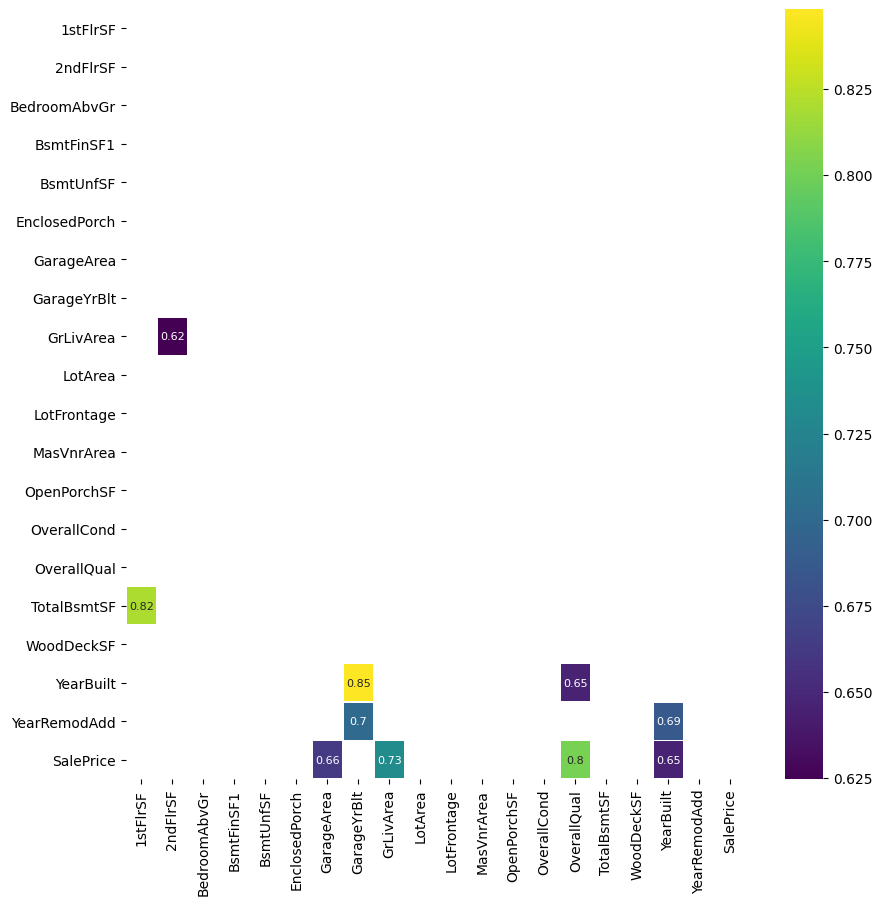



*** Heatmap: Pearson Correlation ***
It evaluates the linear relationship between two continuous variables 



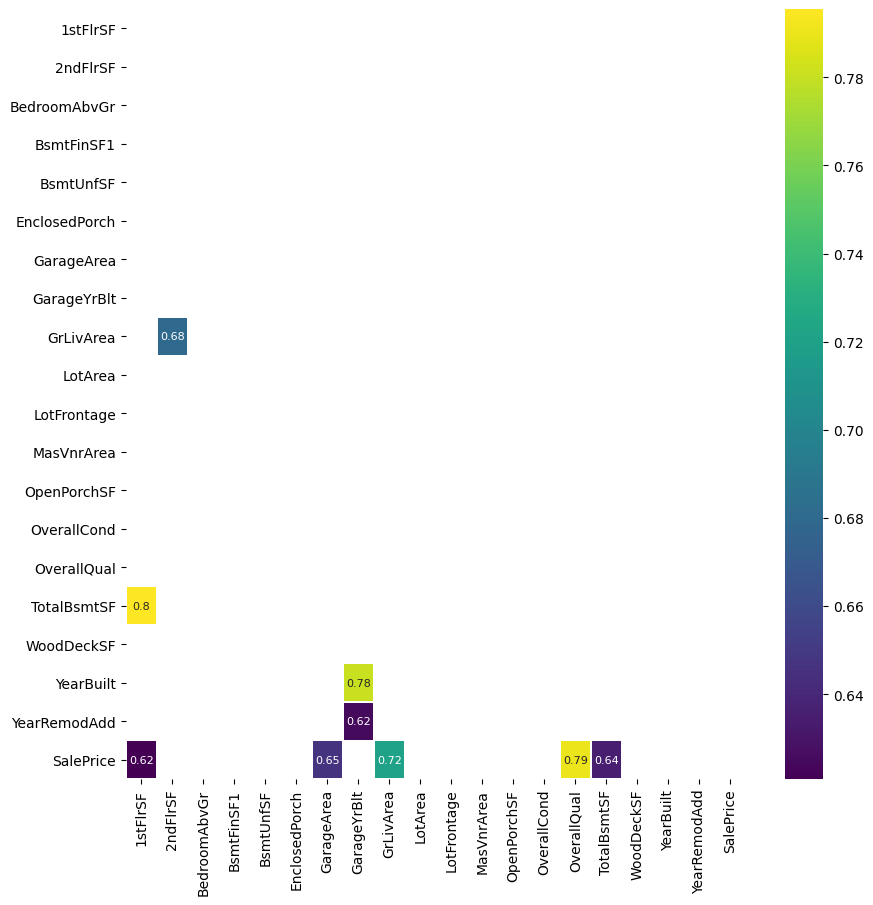



*** Heatmap: Power Predictive Score (PPS) ***
PPS detects linear or non-linear relationships between two columns.
The score ranges from 0 (no predictive power) to 1 (perfect predictive power) 



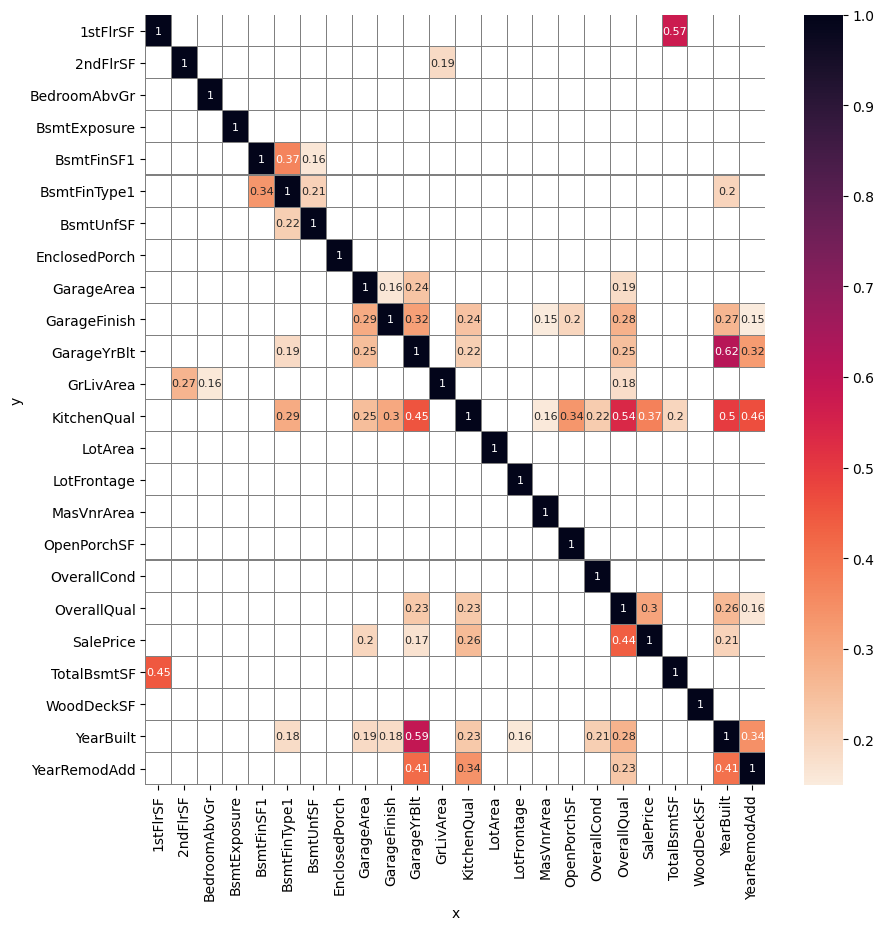

In [10]:
DisplayCorrAndPPS(df_corr_pearson=df_corr_pearson,
                  df_corr_spearman=df_corr_spearman, 
                  pps_matrix=pps_matrix,
                  CorrThreshold=0.6, PPS_Threshold=0.15,
                  figsize=(10,10), font_annot=8)

Key Points:
- The Spearman correlation graph suggests that OverallQual, GrLivArea, GarageArea, and YearBuilt have strong monotonic relationships with Sales Price (from highest to lowest).
- The Pearson correlation graph shows that OverallQual, GrLivArea, GarageArea, TotalBsmtSF and 1stFlrSFhave strong linear relationships with Sales Price (from highest to lowest).
- A PPS over 0.2 is generally indicative of strong predictive power. This chart suggests the OverallQual, KitchenQual, YearBuilt and Garage Area have strong predictive power for Sales Price, with GarageYrBlt having some (but weak) predictive power.

---

# Feature Engineering

Some custom functions are defined below for feature engineering.
 
Note: These custom functions have been taken from the Code Institute learning materials, from the Churnometer walkthrough project.


In [11]:
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import warnings
from feature_engine import transformation as vt
from feature_engine.outliers import Winsorizer
from feature_engine.encoding import OrdinalEncoder
sns.set(style="whitegrid")
warnings.filterwarnings('ignore')


def FeatureEngineeringAnalysis(df, analysis_type=None):
    """
    - used for quick feature engineering on numerical and categorical variables
    to decide which transformation can better transform the distribution shape
    - Once transformed, use a reporting tool, like pandas-profiling, to evaluate distributions
    """
    check_missing_values(df)
    allowed_types = ['numerical', 'ordinal_encoder', 'outlier_winsorizer']
    check_user_entry_on_analysis_type(analysis_type, allowed_types)
    list_column_transformers = define_list_column_transformers(analysis_type)

    # Loop in each variable and engineer the data according to the analysis type
    df_feat_eng = pd.DataFrame([])
    for column in df.columns:
        # create additional columns (column_method) to apply the methods
        df_feat_eng = pd.concat([df_feat_eng, df[column]], axis=1)
        for method in list_column_transformers:
            df_feat_eng[f"{column}_{method}"] = df[column]

        # Apply transformers in respective column_transformers
        df_feat_eng, list_applied_transformers = apply_transformers(
            analysis_type, df_feat_eng, column)

        # For each variable, assess how the transformations perform
        transformer_evaluation(
            column, list_applied_transformers, analysis_type, df_feat_eng)

    return df_feat_eng


def check_user_entry_on_analysis_type(analysis_type, allowed_types):
    """ Check analysis type """
    if analysis_type is None:
        raise SystemExit(
            f"You should pass analysis_type parameter as one of the following options: {allowed_types}")
    if analysis_type not in allowed_types:
        raise SystemExit(
            f"analysis_type argument should be one of these options: {allowed_types}")


def check_missing_values(df):
    if df.isna().sum().sum() != 0:
        raise SystemExit(
            f"There is a missing value in your dataset. Please handle that before getting into feature engineering.")


def define_list_column_transformers(analysis_type):
    """ Set suffix columns according to analysis_type"""
    if analysis_type == 'numerical':
        list_column_transformers = [
            "log_e", "log_10", "reciprocal", "power", "box_cox", "yeo_johnson"]

    elif analysis_type == 'ordinal_encoder':
        list_column_transformers = ["ordinal_encoder"]

    elif analysis_type == 'outlier_winsorizer':
        list_column_transformers = ['iqr']

    return list_column_transformers


def apply_transformers(analysis_type, df_feat_eng, column):
    for col in df_feat_eng.select_dtypes(include='category').columns:
        df_feat_eng[col] = df_feat_eng[col].astype('object')

    if analysis_type == 'numerical':
        df_feat_eng, list_applied_transformers = FeatEngineering_Numerical(
            df_feat_eng, column)

    elif analysis_type == 'outlier_winsorizer':
        df_feat_eng, list_applied_transformers = FeatEngineering_OutlierWinsorizer(
            df_feat_eng, column)

    elif analysis_type == 'ordinal_encoder':
        df_feat_eng, list_applied_transformers = FeatEngineering_CategoricalEncoder(
            df_feat_eng, column)

    return df_feat_eng, list_applied_transformers


def transformer_evaluation(column, list_applied_transformers, analysis_type, df_feat_eng):
    # For each variable, assess how the transformations perform
    print(f"* Variable Analyzed: {column}")
    print(f"* Applied transformation: {list_applied_transformers} \n")
    for col in [column] + list_applied_transformers:

        if analysis_type != 'ordinal_encoder':
            DiagnosticPlots_Numerical(df_feat_eng, col)

        else:
            if col == column:
                DiagnosticPlots_Categories(df_feat_eng, col)
            else:
                DiagnosticPlots_Numerical(df_feat_eng, col)

        print("\n")


def DiagnosticPlots_Categories(df_feat_eng, col):
    plt.figure(figsize=(4, 3))
    sns.countplot(data=df_feat_eng, x=col, palette=[
                  '#432371'], order=df_feat_eng[col].value_counts().index)
    plt.xticks(rotation=90)
    plt.suptitle(f"{col}", fontsize=30, y=1.05)
    plt.show()
    print("\n")


def DiagnosticPlots_Numerical(df, variable):
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    sns.histplot(data=df, x=variable, kde=True, element="step", ax=axes[0])
    stats.probplot(df[variable], dist="norm", plot=axes[1])
    sns.boxplot(x=df[variable], ax=axes[2])

    axes[0].set_title('Histogram')
    axes[1].set_title('QQ Plot')
    axes[2].set_title('Boxplot')
    fig.suptitle(f"{variable}", fontsize=30, y=1.05)
    plt.tight_layout()
    plt.show()


def FeatEngineering_CategoricalEncoder(df_feat_eng, column):
    list_methods_worked = []
    try:
        encoder = OrdinalEncoder(encoding_method='arbitrary', variables=[
                                 f"{column}_ordinal_encoder"])
        df_feat_eng = encoder.fit_transform(df_feat_eng)
        list_methods_worked.append(f"{column}_ordinal_encoder")

    except Exception:
        df_feat_eng.drop([f"{column}_ordinal_encoder"], axis=1, inplace=True)

    return df_feat_eng, list_methods_worked


def FeatEngineering_OutlierWinsorizer(df_feat_eng, column):
    list_methods_worked = []

    # Winsorizer iqr
    try:
        disc = Winsorizer(
            capping_method='iqr', tail='both', fold=1.5, variables=[f"{column}_iqr"])
        df_feat_eng = disc.fit_transform(df_feat_eng)
        list_methods_worked.append(f"{column}_iqr")
    except Exception:
        df_feat_eng.drop([f"{column}_iqr"], axis=1, inplace=True)

    return df_feat_eng, list_methods_worked


def FeatEngineering_Numerical(df_feat_eng, column):
    list_methods_worked = []

    # LogTransformer base e
    try:
        lt = vt.LogTransformer(variables=[f"{column}_log_e"])
        df_feat_eng = lt.fit_transform(df_feat_eng)
        list_methods_worked.append(f"{column}_log_e")
    except Exception:
        df_feat_eng.drop([f"{column}_log_e"], axis=1, inplace=True)

    # LogTransformer base 10
    try:
        lt = vt.LogTransformer(variables=[f"{column}_log_10"], base='10')
        df_feat_eng = lt.fit_transform(df_feat_eng)
        list_methods_worked.append(f"{column}_log_10")
    except Exception:
        df_feat_eng.drop([f"{column}_log_10"], axis=1, inplace=True)

    # ReciprocalTransformer
    try:
        rt = vt.ReciprocalTransformer(variables=[f"{column}_reciprocal"])
        df_feat_eng = rt.fit_transform(df_feat_eng)
        list_methods_worked.append(f"{column}_reciprocal")
    except Exception:
        df_feat_eng.drop([f"{column}_reciprocal"], axis=1, inplace=True)

    # PowerTransformer
    try:
        pt = vt.PowerTransformer(variables=[f"{column}_power"])
        df_feat_eng = pt.fit_transform(df_feat_eng)
        list_methods_worked.append(f"{column}_power")
    except Exception:
        df_feat_eng.drop([f"{column}_power"], axis=1, inplace=True)

    # BoxCoxTransformer
    try:
        bct = vt.BoxCoxTransformer(variables=[f"{column}_box_cox"])
        df_feat_eng = bct.fit_transform(df_feat_eng)
        list_methods_worked.append(f"{column}_box_cox")
    except Exception:
        df_feat_eng.drop([f"{column}_box_cox"], axis=1, inplace=True)

    # YeoJohnsonTransformer
    try:
        yjt = vt.YeoJohnsonTransformer(variables=[f"{column}_yeo_johnson"])
        df_feat_eng = yjt.fit_transform(df_feat_eng)
        list_methods_worked.append(f"{column}_yeo_johnson")
    except Exception:
        df_feat_eng.drop([f"{column}_yeo_johnson"], axis=1, inplace=True)

    return df_feat_eng, list_methods_worked

The table below summarises the feature engineering to be considered:

| Feature Engineering | Comments | Variables |
| --- | --- | --- |
| Categorical Encoding - Ordinal | Replaces categorical variables with ordinal numbers | BsmtExposure, BsmtFinType1, GarageFinish, KitchenQual |
| Numerical Transformation | Applies numerical transformation to the variables with the intention of obtaining distributions closer to normal | All except target |
| Outlier Transformation | Removes the outliers from the data | All except target |
| Smart Correlated Selection | Determines the best correlated features to use in the model | All |

## Categorical Encoding

Selecting the categorical variables:

In [12]:
variables_engineering= (TrainSet.select_dtypes(include=['object']).columns.to_list())

variables_engineering

['BsmtExposure', 'BsmtFinType1', 'GarageFinish', 'KitchenQual']

Create a dataframe with just these variables:

In [13]:
df_engineering = TrainSet[variables_engineering].copy()
df_engineering.head(3)

,BsmtExposure,BsmtFinType1,GarageFinish,KitchenQual
0,Av,Unf,Unf,Gd
1,No,Unf,Unf,TA
2,No,ALQ,Unf,TA


Apply ordinal transformation and review analysis:

* Variable Analyzed: BsmtExposure
* Applied transformation: ['BsmtExposure_ordinal_encoder'] 



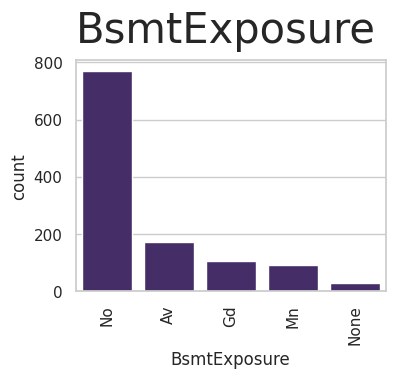

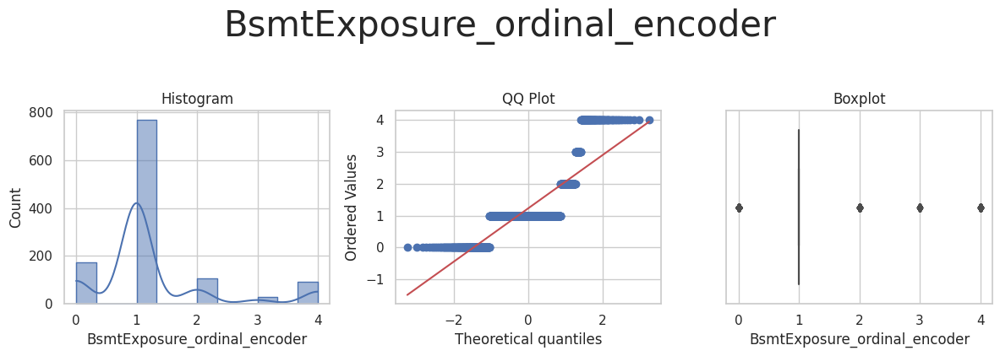



* Variable Analyzed: BsmtFinType1
* Applied transformation: ['BsmtFinType1_ordinal_encoder'] 



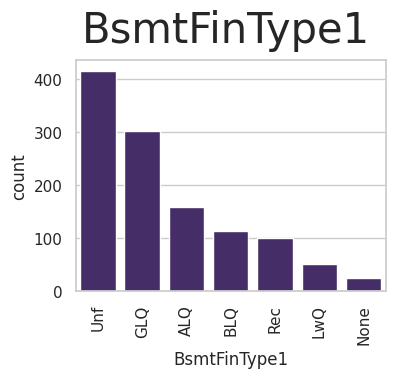

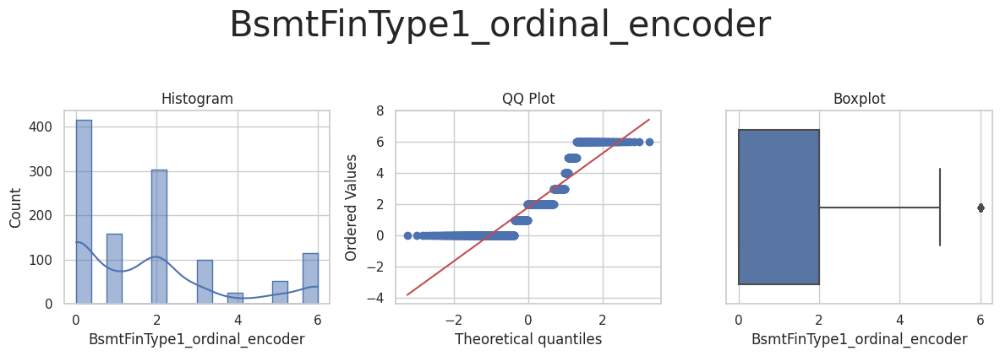



* Variable Analyzed: GarageFinish
* Applied transformation: ['GarageFinish_ordinal_encoder'] 



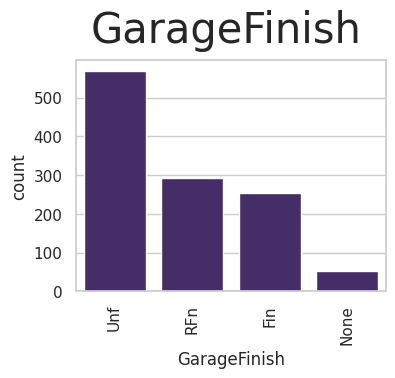

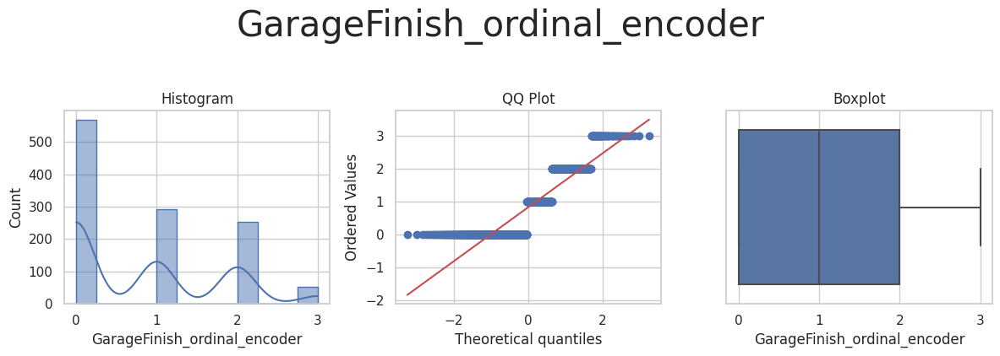



* Variable Analyzed: KitchenQual
* Applied transformation: ['KitchenQual_ordinal_encoder'] 



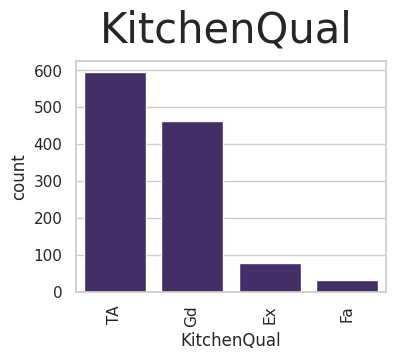

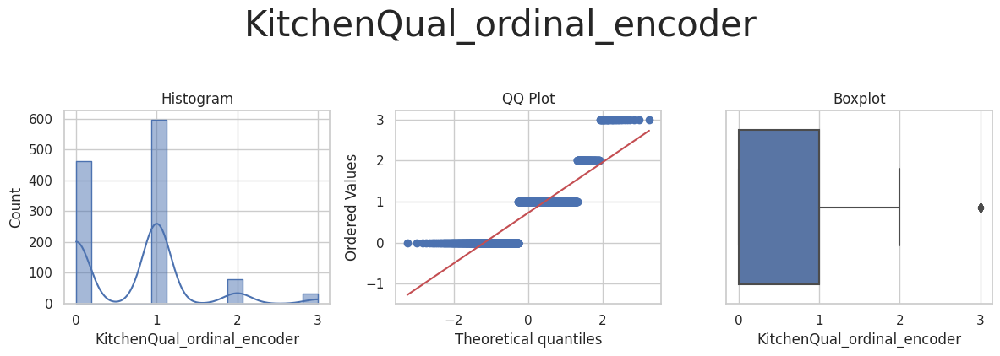

In [14]:
df_engineering = FeatureEngineeringAnalysis(df=df_engineering, analysis_type='ordinal_encoder')

This is an effective transformation, as the distributions remain the same with the categories transformed into ordinal numbers.

This transformation will be applied:

In [15]:
encoder = OrdinalEncoder(encoding_method='arbitrary', variables = variables_engineering)
TrainSet = encoder.fit_transform(TrainSet)
TestSet = encoder.transform(TestSet)

A quick check to make sure this has performed as expected:

In [17]:
TrainSet.filter(variables_engineering).head(3)

,BsmtExposure,BsmtFinType1,GarageFinish,KitchenQual
0,0,0,0,0
1,1,0,0,1
2,1,1,0,1


In [18]:
TestSet.filter(variables_engineering).head(3)

,BsmtExposure,BsmtFinType1,GarageFinish,KitchenQual
0,1,3,0,1
1,1,6,0,3
2,1,5,0,0


The transformation has been applied correctly.

## Numerical Transformation

Selecting the relevant variables:

In [19]:
variables_engineering = (TrainSet.select_dtypes(include=['float', 'int']).columns.to_list())
variables_engineering.remove('SalePrice')
variables_engineering

['1stFlrSF',
 '2ndFlrSF',
 'BedroomAbvGr',
 'BsmtExposure',
 'BsmtFinSF1',
 'BsmtFinType1',
 'BsmtUnfSF',
 'EnclosedPorch',
 'GarageArea',
 'GarageFinish',
 'GarageYrBlt',
 'GrLivArea',
 'KitchenQual',
 'LotArea',
 'LotFrontage',
 'MasVnrArea',
 'OpenPorchSF',
 'OverallCond',
 'OverallQual',
 'TotalBsmtSF',
 'WoodDeckSF',
 'YearBuilt',
 'YearRemodAdd']

Create a dataframe with just these variables:

In [20]:
df_engineering = TrainSet[variables_engineering].copy()
df_engineering.head(3)

,1stFlrSF,2ndFlrSF,BedroomAbvGr,BsmtExposure,BsmtFinSF1,BsmtFinType1,BsmtUnfSF,EnclosedPorch,GarageArea,GarageFinish,...,LotArea,LotFrontage,MasVnrArea,OpenPorchSF,OverallCond,OverallQual,TotalBsmtSF,WoodDeckSF,YearBuilt,YearRemodAdd
0,1828,0.0,3.0,0,48,0,1774,0.0,774,0,...,11694,90.0,452.0,108,5,9,1822,0.0,2007,2007
1,894,0.0,2.0,1,0,0,894,0.0,308,0,...,6600,60.0,0.0,0,5,5,894,0.0,1962,1962
2,964,0.0,2.0,1,713,1,163,0.0,432,0,...,13360,80.0,0.0,0,7,5,876,0.0,1921,2006


Apply numerical transformations and review analysis:

* Variable Analyzed: 1stFlrSF
* Applied transformation: ['1stFlrSF_log_e', '1stFlrSF_log_10', '1stFlrSF_reciprocal', '1stFlrSF_power', '1stFlrSF_box_cox', '1stFlrSF_yeo_johnson'] 



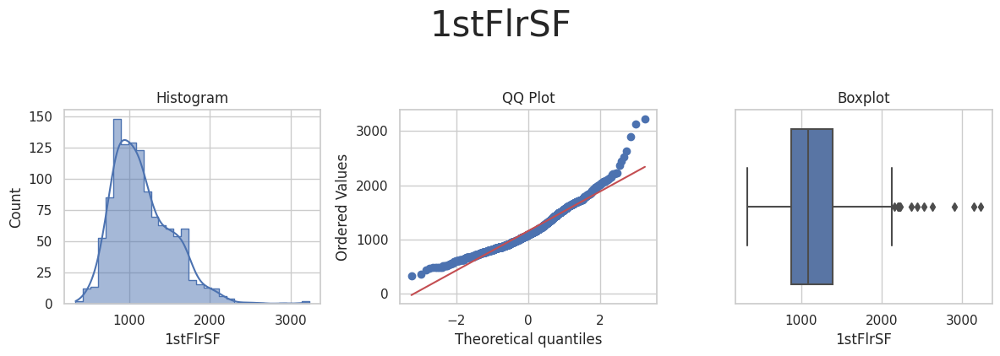

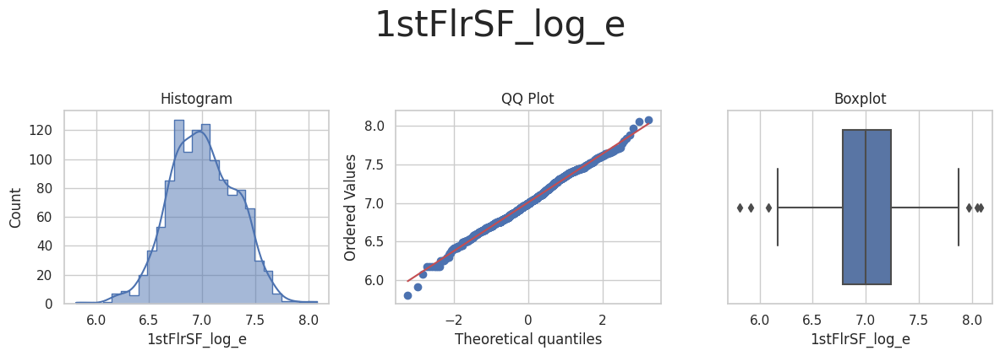

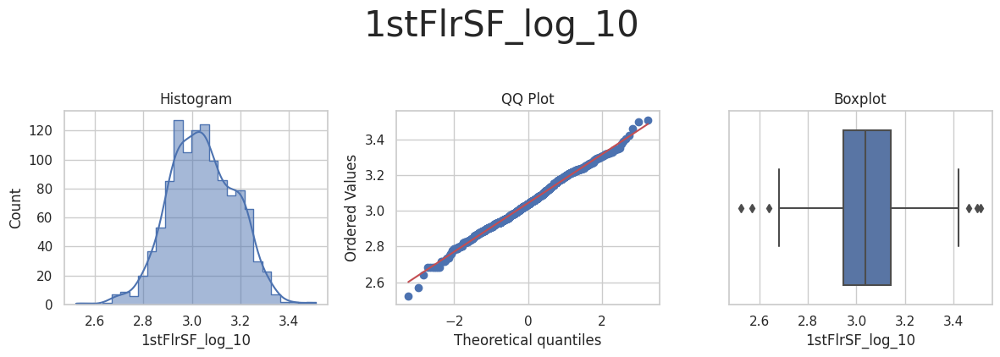

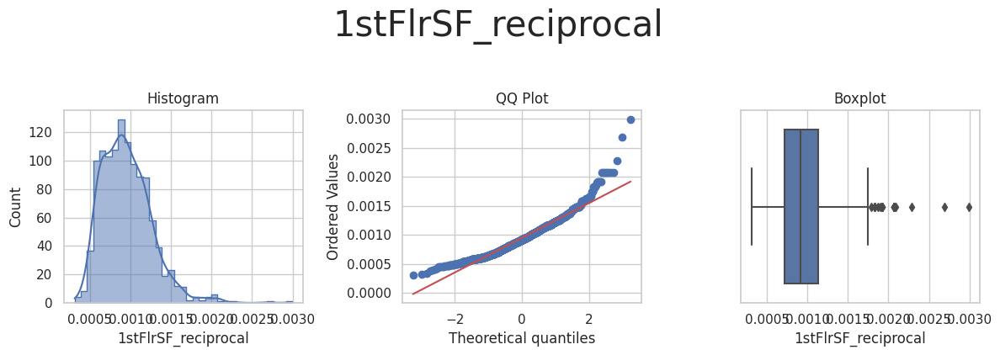

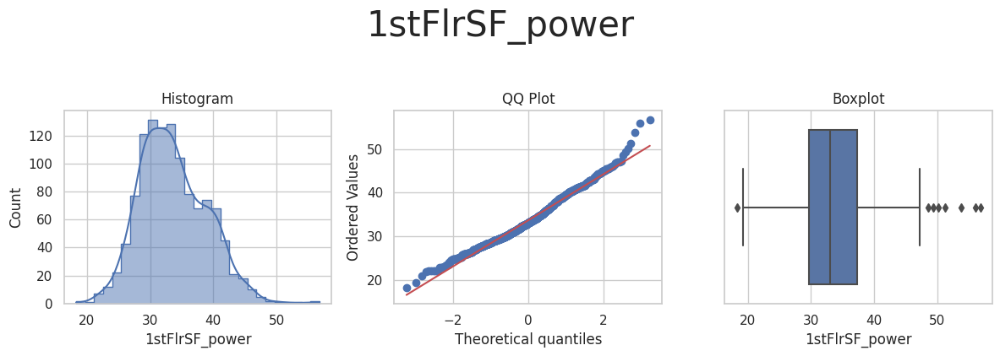

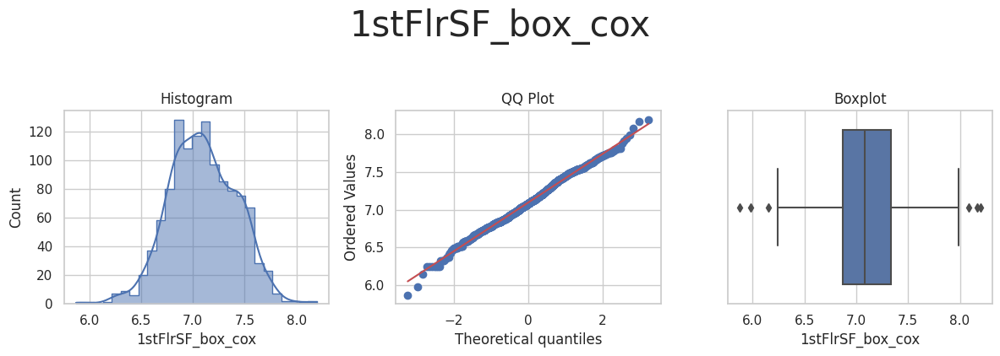

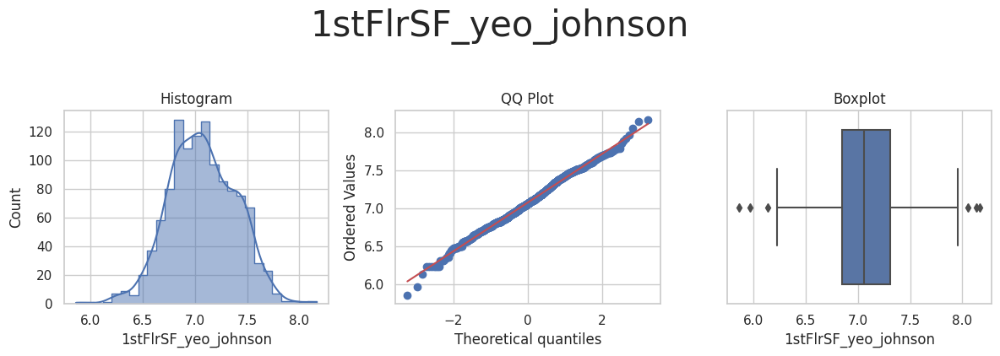



* Variable Analyzed: 2ndFlrSF
* Applied transformation: ['2ndFlrSF_power', '2ndFlrSF_yeo_johnson'] 



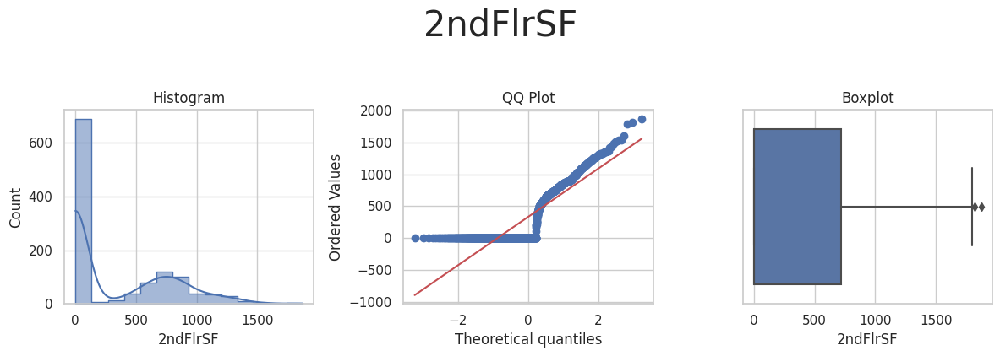

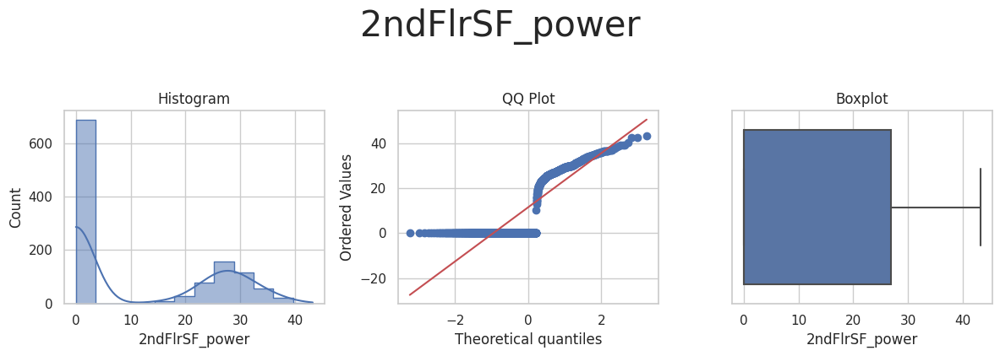

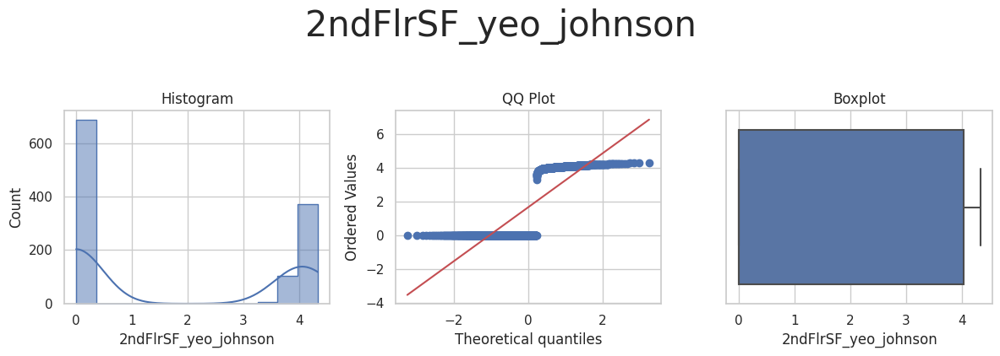



* Variable Analyzed: BedroomAbvGr
* Applied transformation: ['BedroomAbvGr_power', 'BedroomAbvGr_yeo_johnson'] 



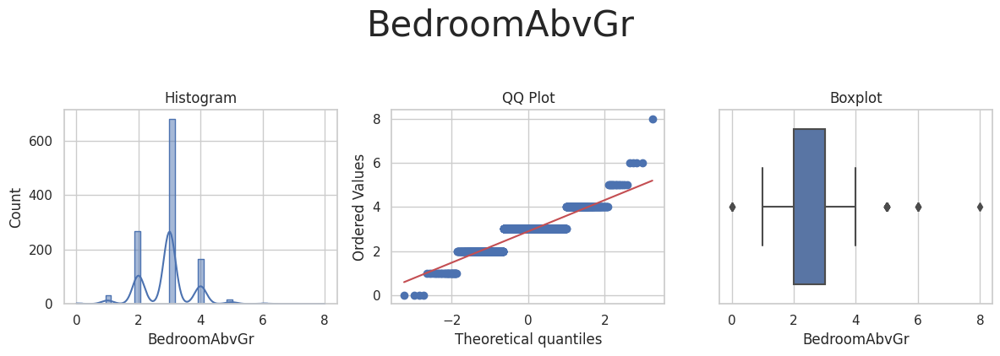

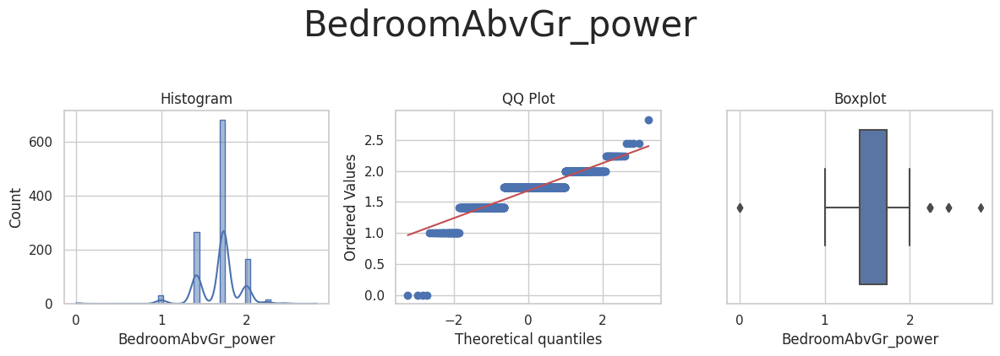

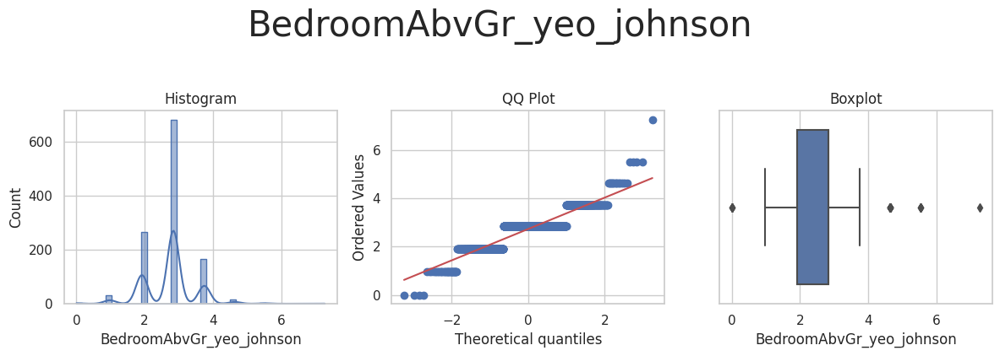



* Variable Analyzed: BsmtExposure
* Applied transformation: ['BsmtExposure_power', 'BsmtExposure_yeo_johnson'] 



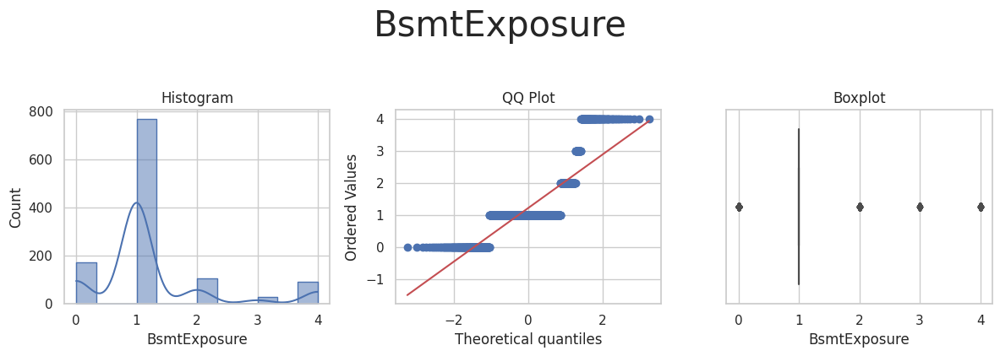

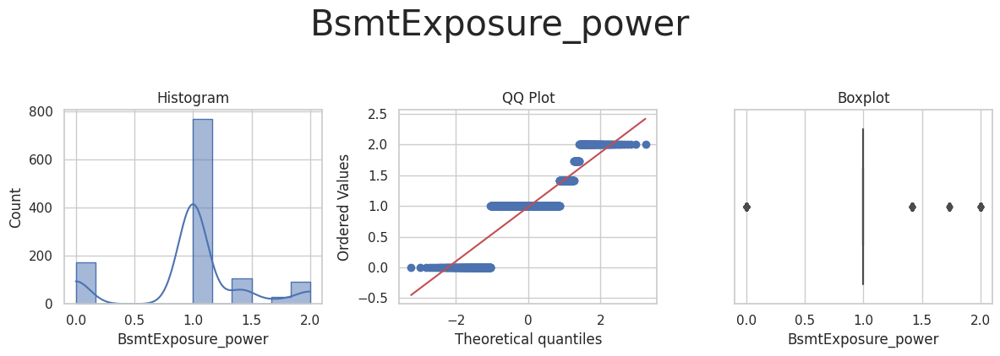

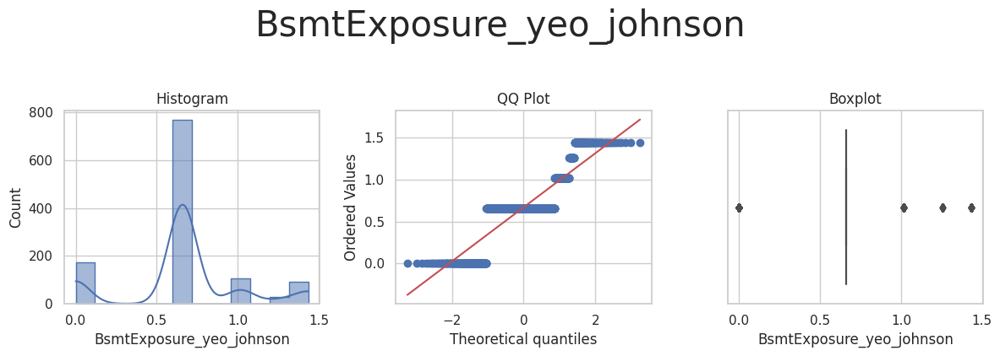



* Variable Analyzed: BsmtFinSF1
* Applied transformation: ['BsmtFinSF1_power', 'BsmtFinSF1_yeo_johnson'] 



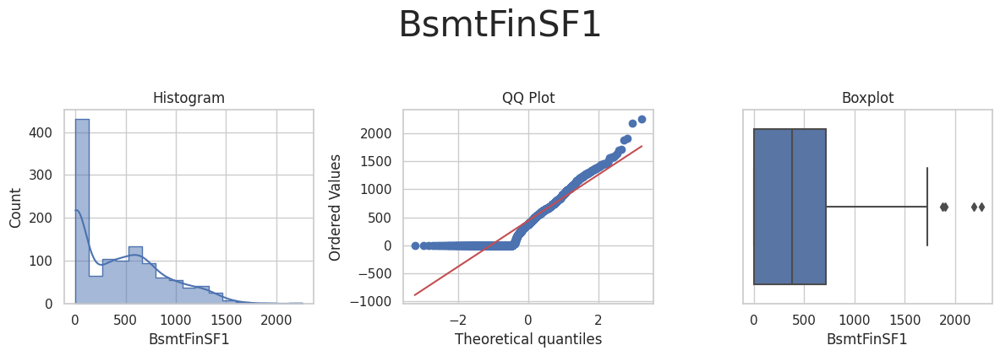

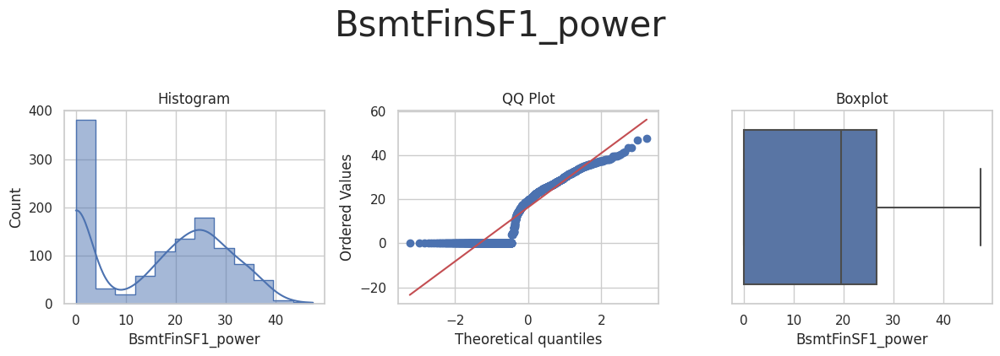

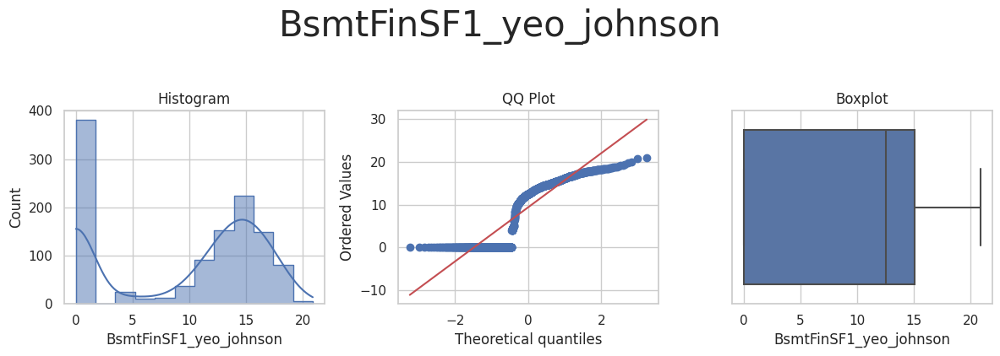



* Variable Analyzed: BsmtFinType1
* Applied transformation: ['BsmtFinType1_power', 'BsmtFinType1_yeo_johnson'] 



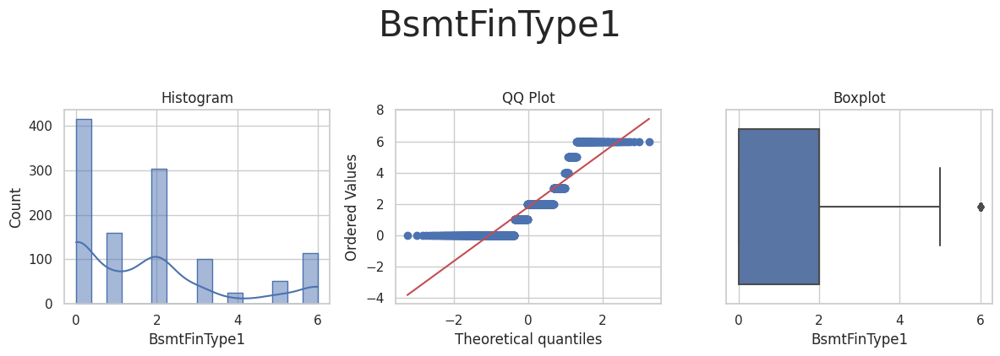

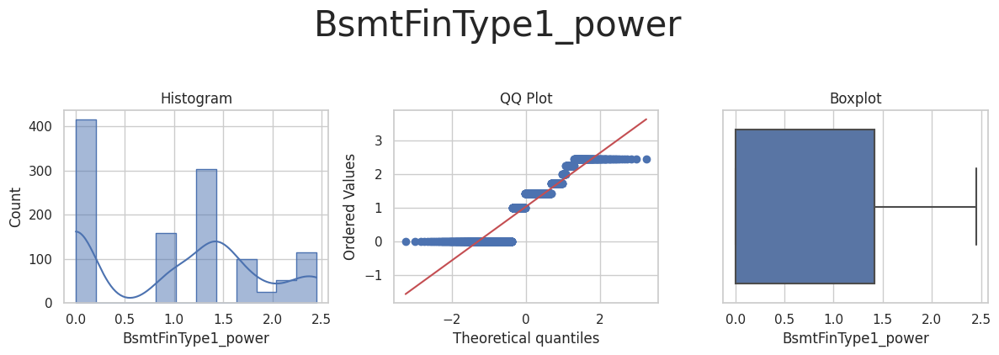

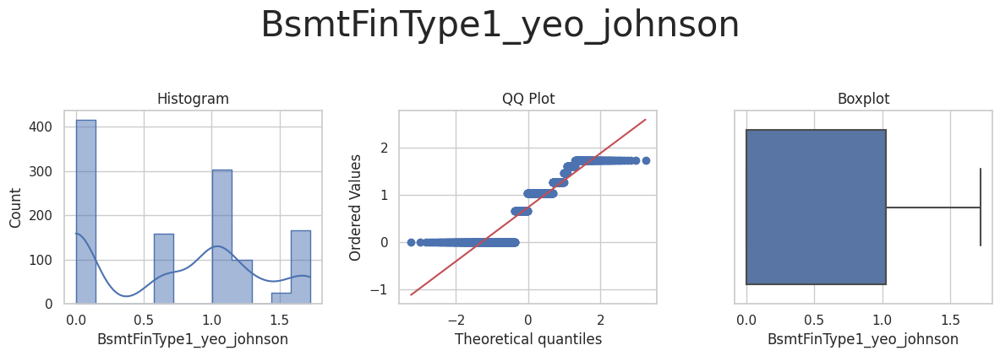



* Variable Analyzed: BsmtUnfSF
* Applied transformation: ['BsmtUnfSF_power', 'BsmtUnfSF_yeo_johnson'] 



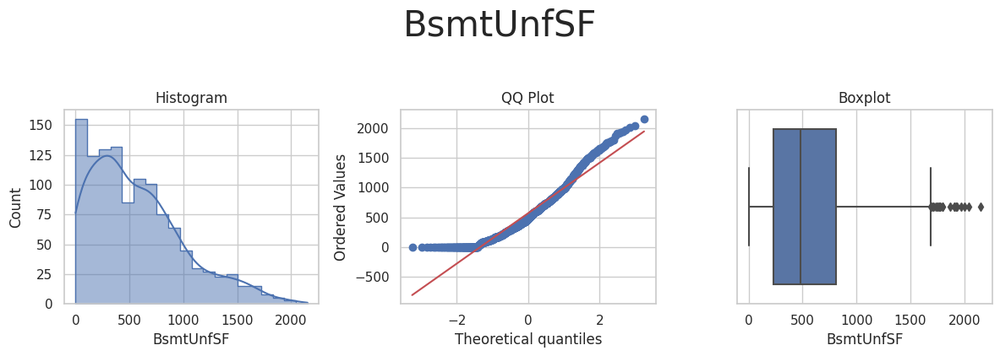

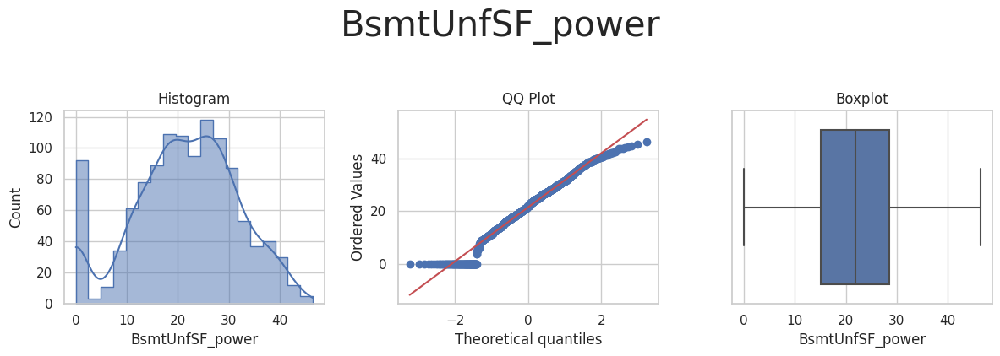

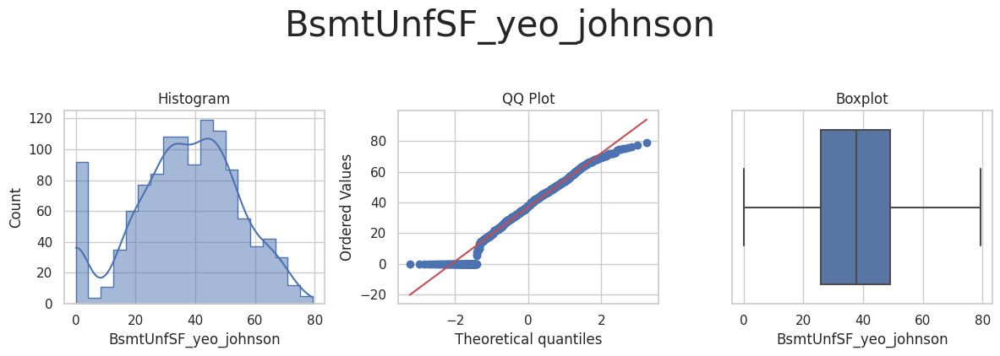



* Variable Analyzed: EnclosedPorch
* Applied transformation: ['EnclosedPorch_power', 'EnclosedPorch_yeo_johnson'] 



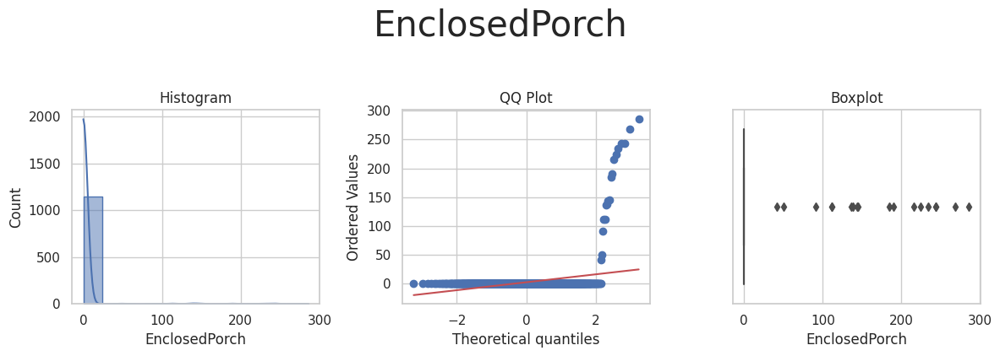

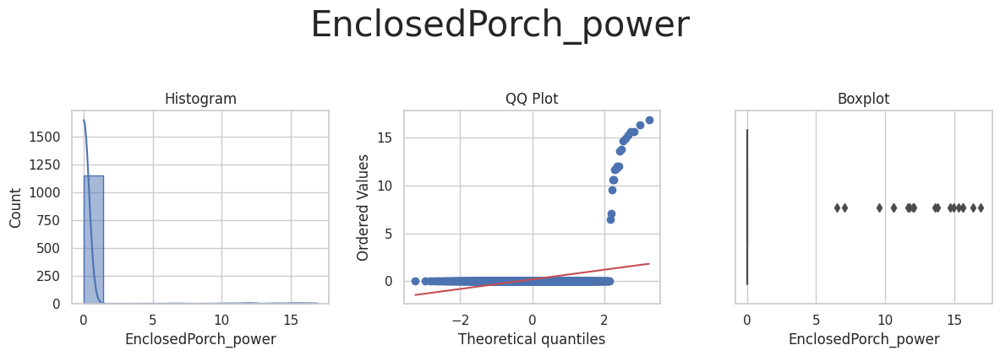

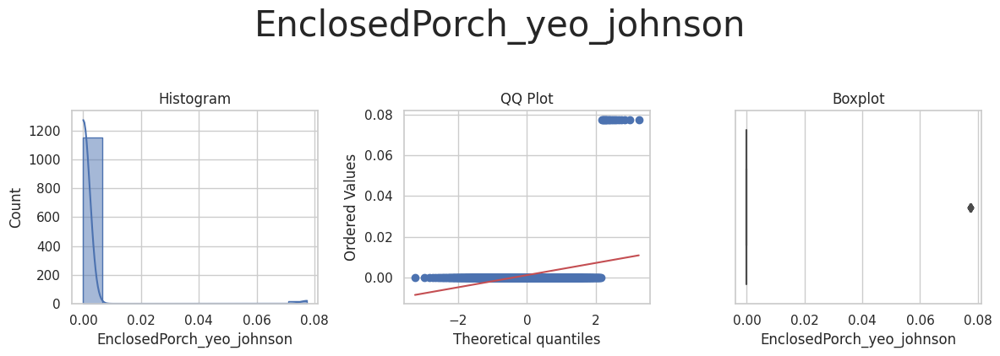



* Variable Analyzed: GarageArea
* Applied transformation: ['GarageArea_power', 'GarageArea_yeo_johnson'] 



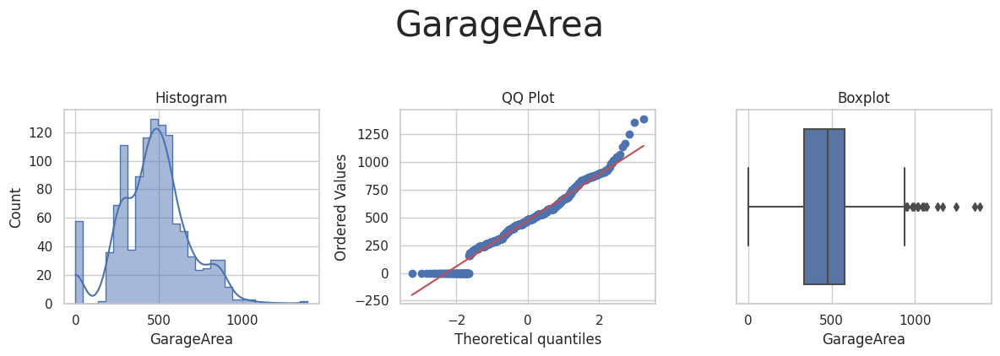

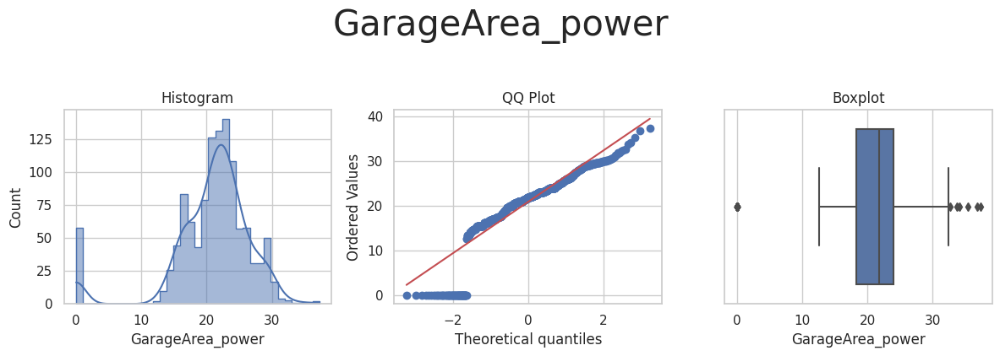

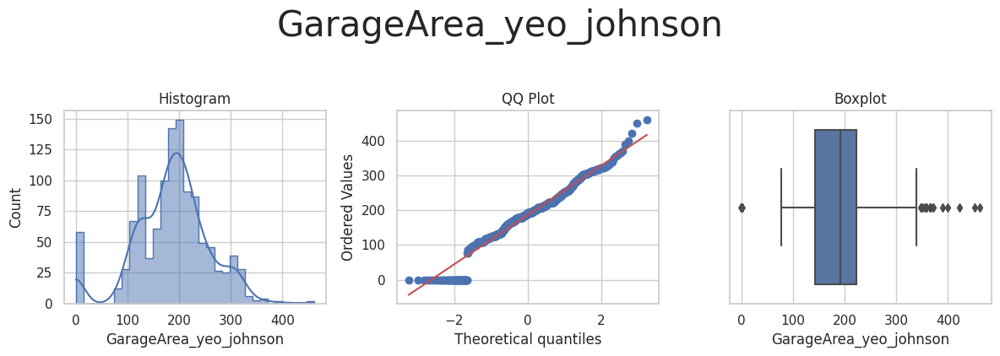



* Variable Analyzed: GarageFinish
* Applied transformation: ['GarageFinish_power', 'GarageFinish_yeo_johnson'] 



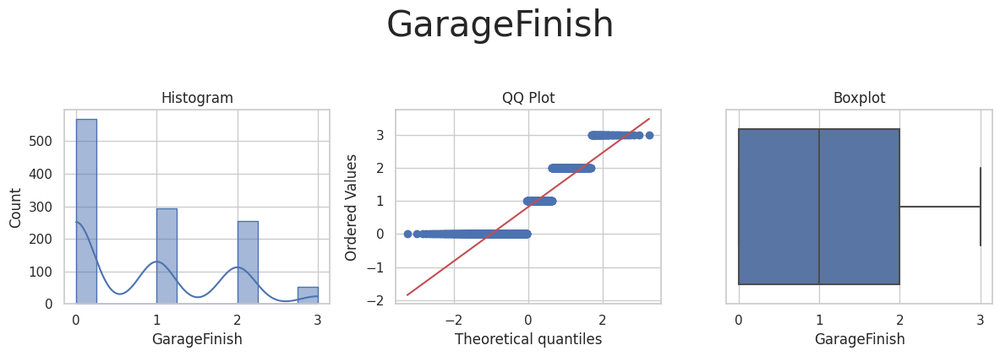

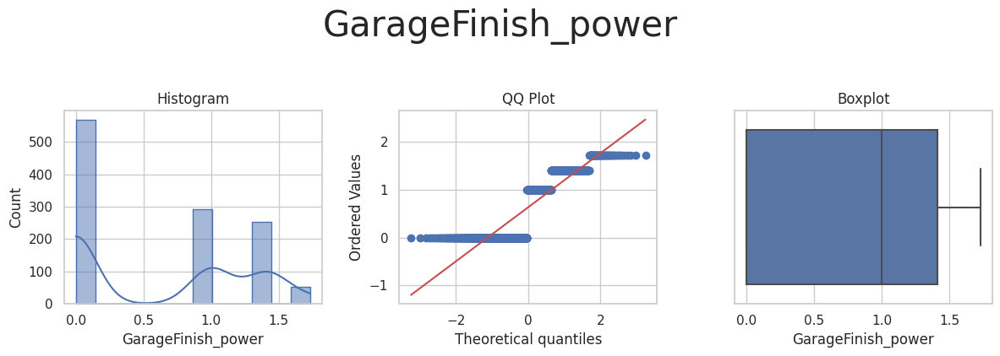

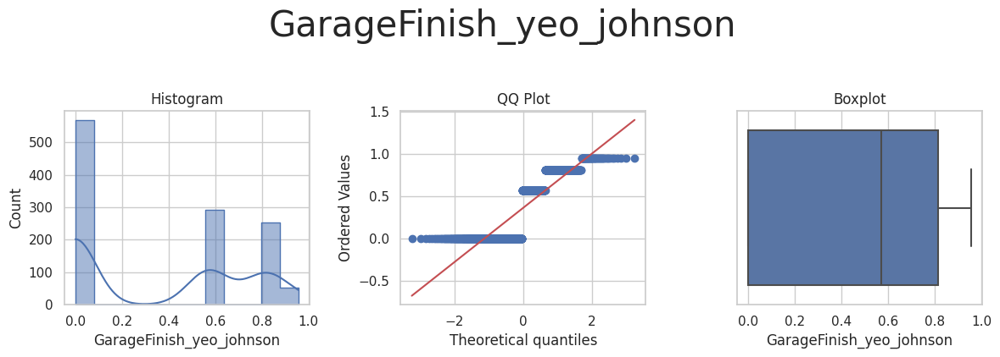



* Variable Analyzed: GarageYrBlt
* Applied transformation: ['GarageYrBlt_log_e', 'GarageYrBlt_log_10', 'GarageYrBlt_reciprocal', 'GarageYrBlt_power', 'GarageYrBlt_box_cox', 'GarageYrBlt_yeo_johnson'] 



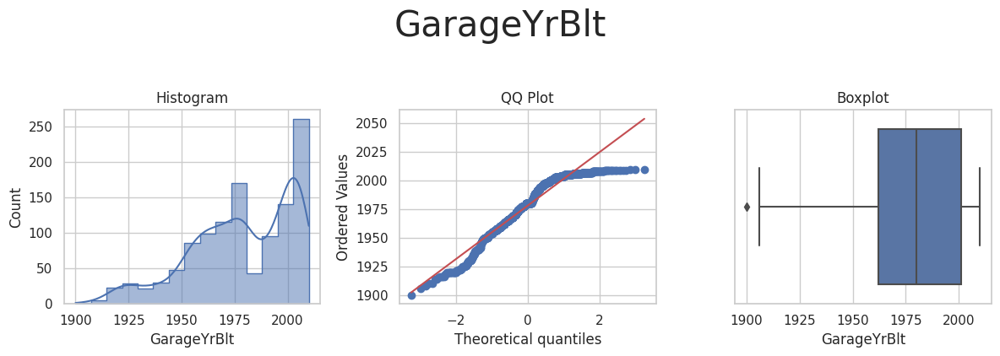

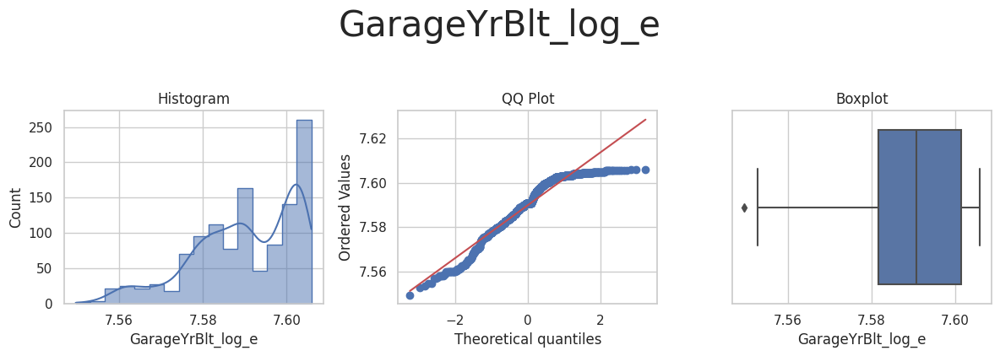

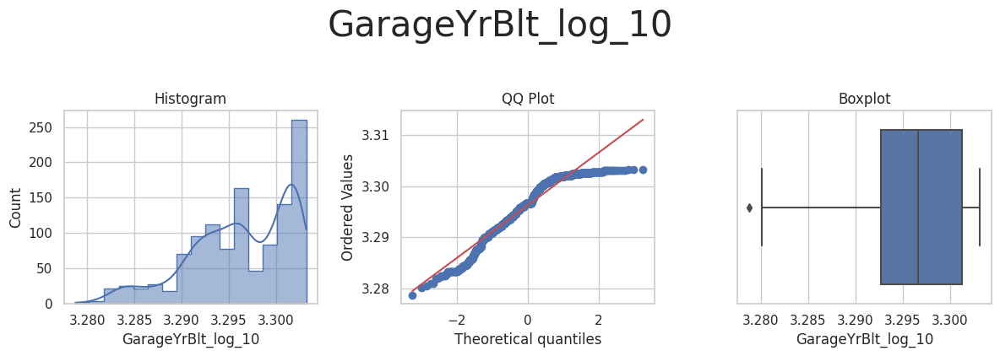

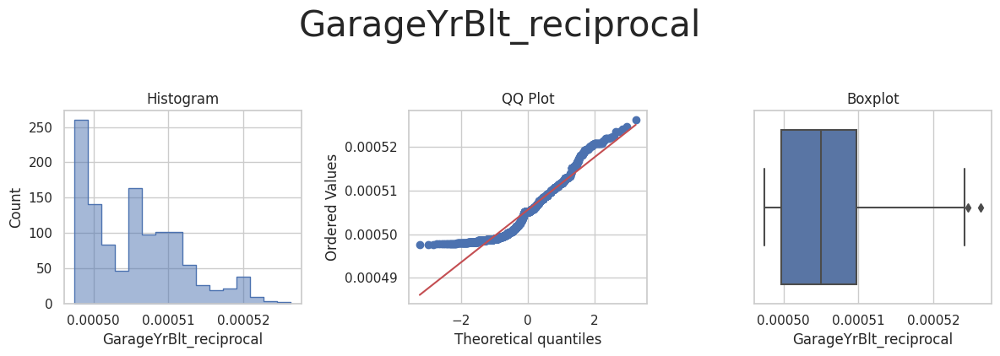

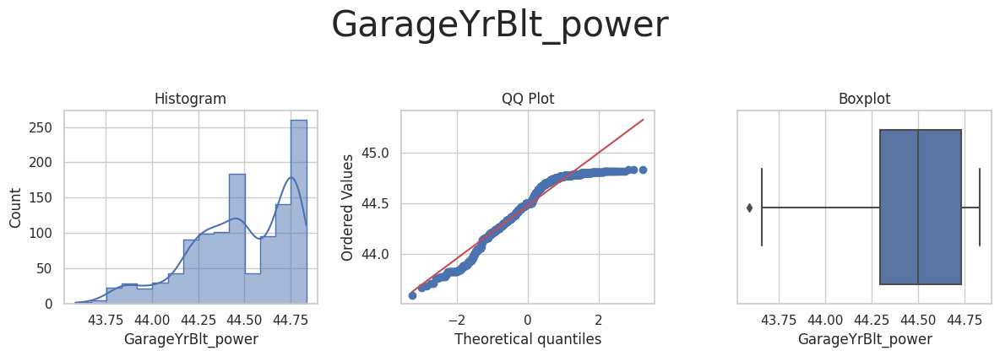

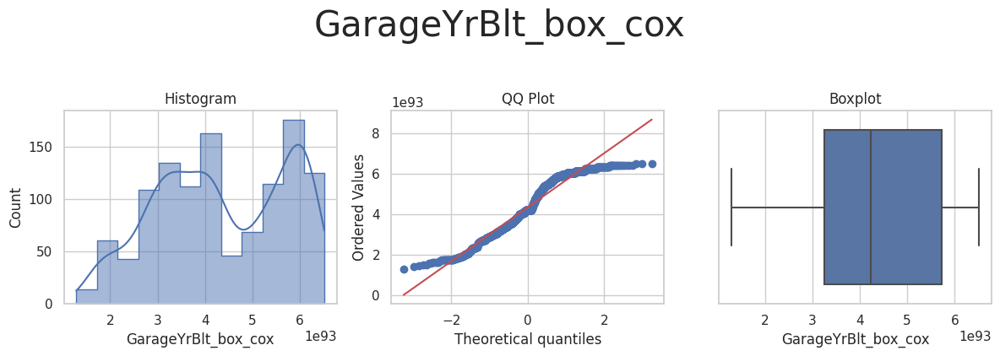

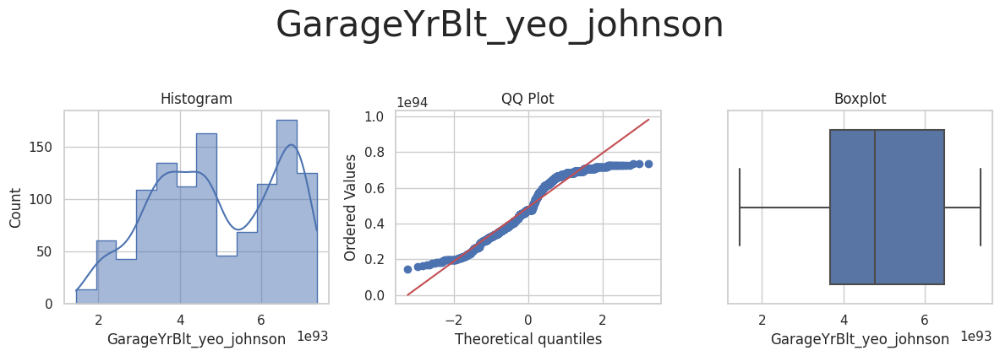



* Variable Analyzed: GrLivArea
* Applied transformation: ['GrLivArea_log_e', 'GrLivArea_log_10', 'GrLivArea_reciprocal', 'GrLivArea_power', 'GrLivArea_box_cox', 'GrLivArea_yeo_johnson'] 



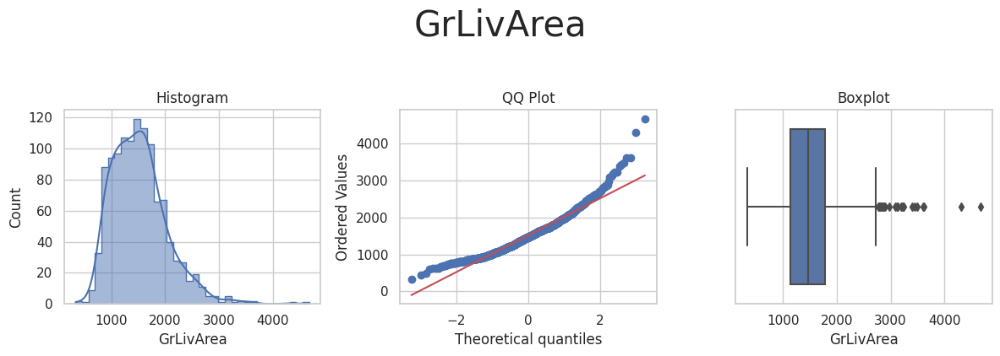

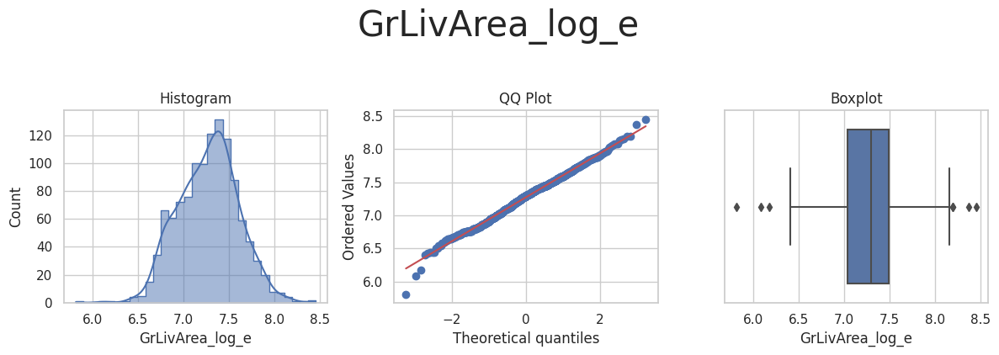

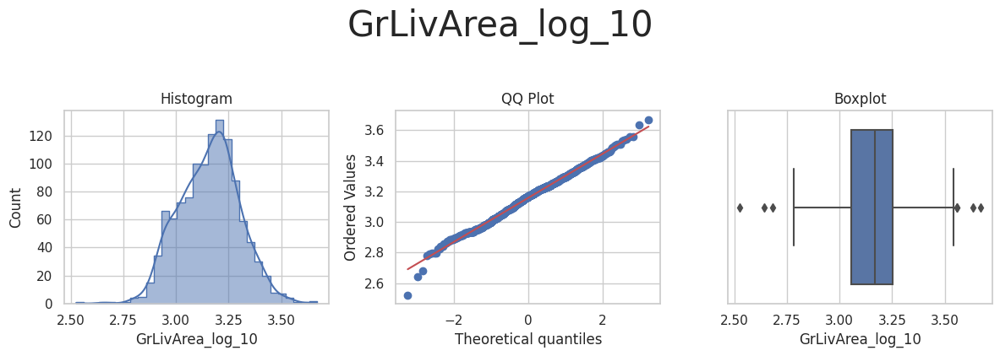

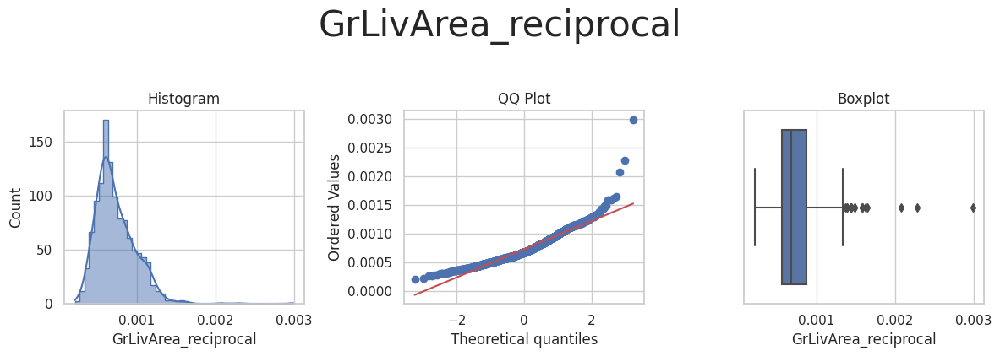

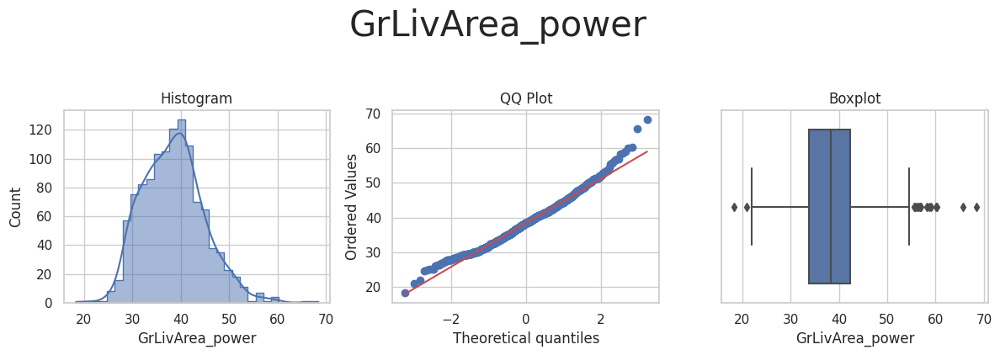

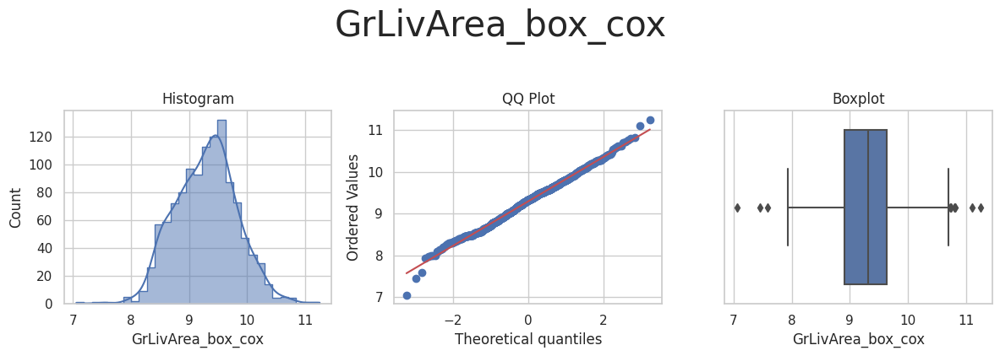

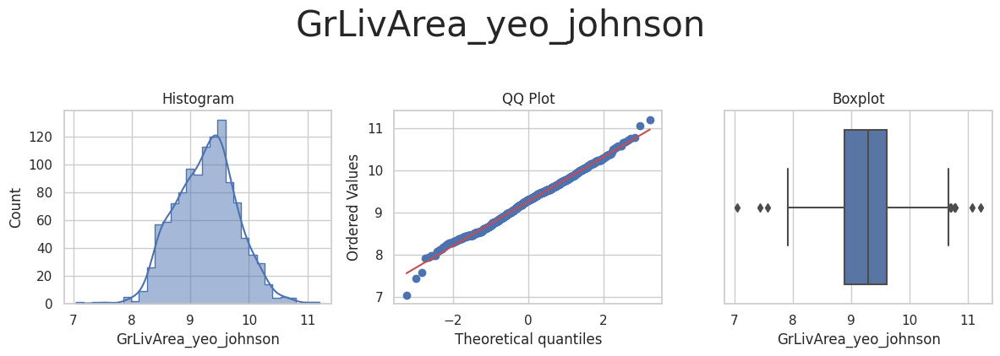



* Variable Analyzed: KitchenQual
* Applied transformation: ['KitchenQual_power', 'KitchenQual_yeo_johnson'] 



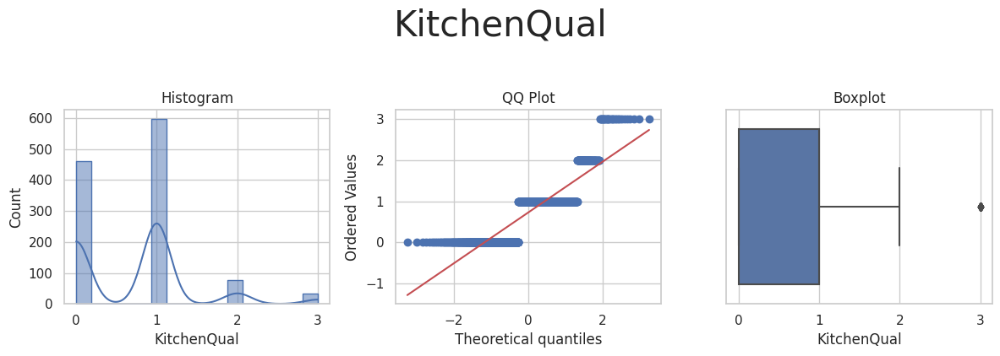

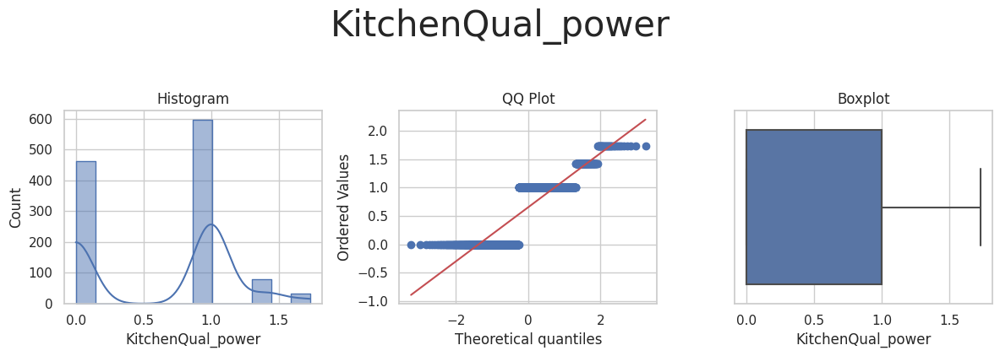

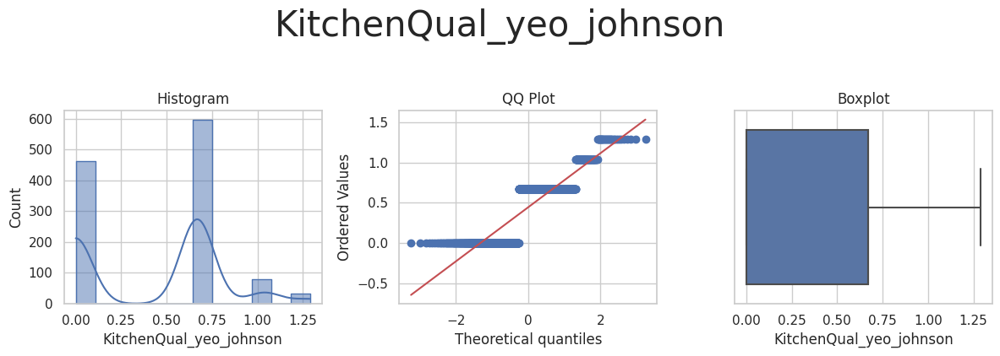



* Variable Analyzed: LotArea
* Applied transformation: ['LotArea_log_e', 'LotArea_log_10', 'LotArea_reciprocal', 'LotArea_power', 'LotArea_box_cox', 'LotArea_yeo_johnson'] 



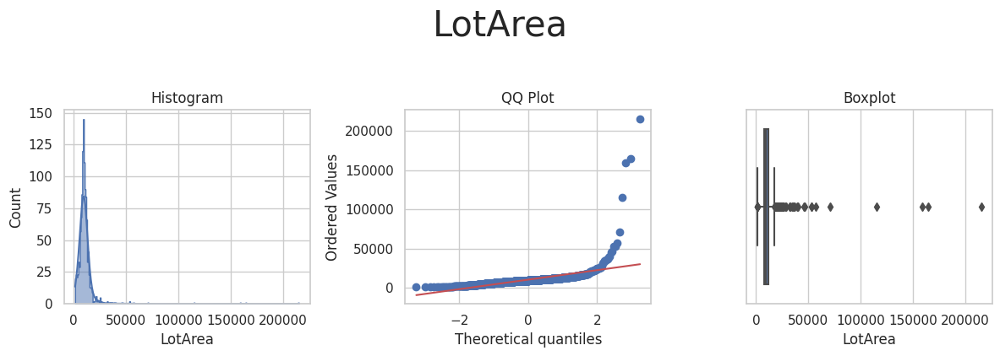

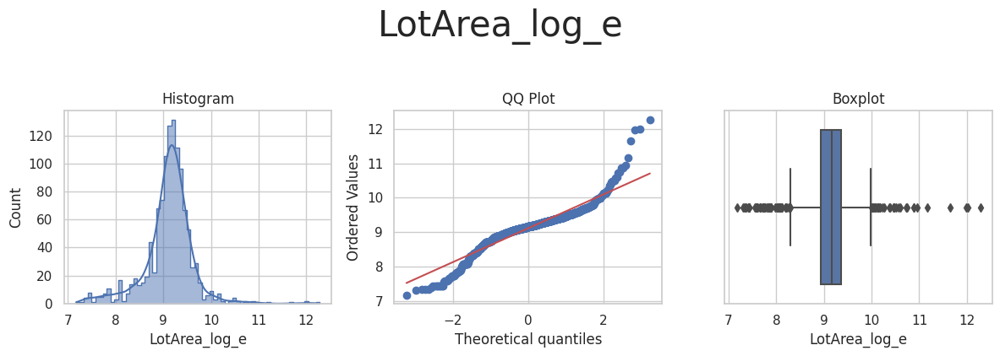

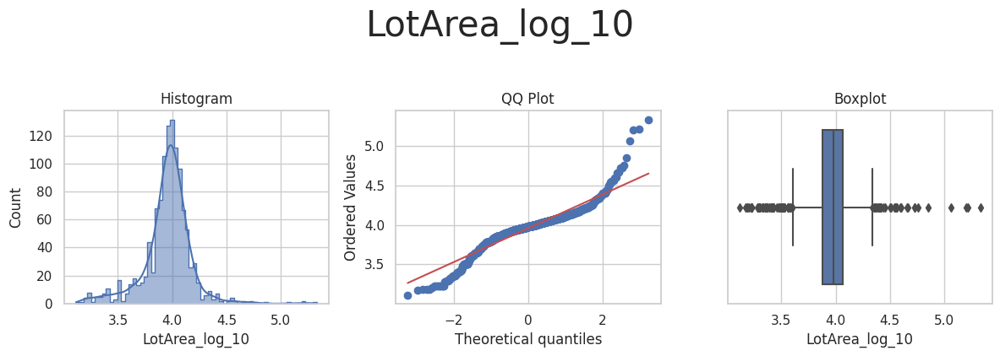

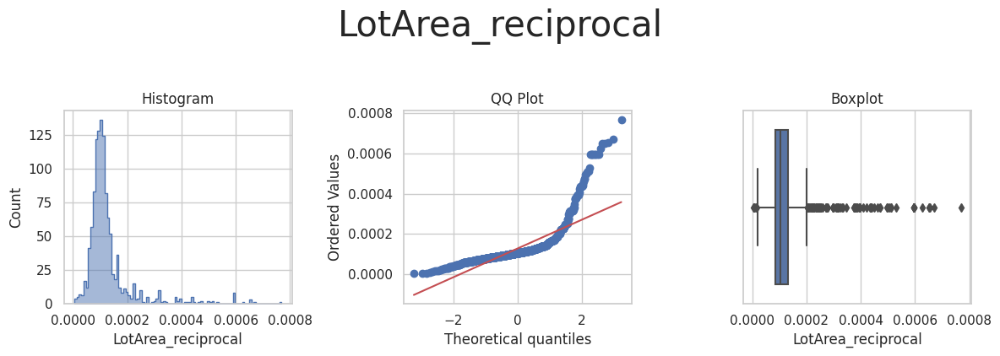

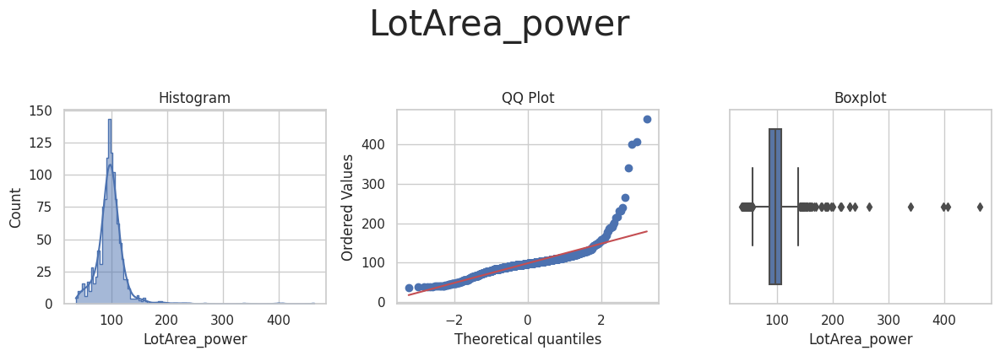

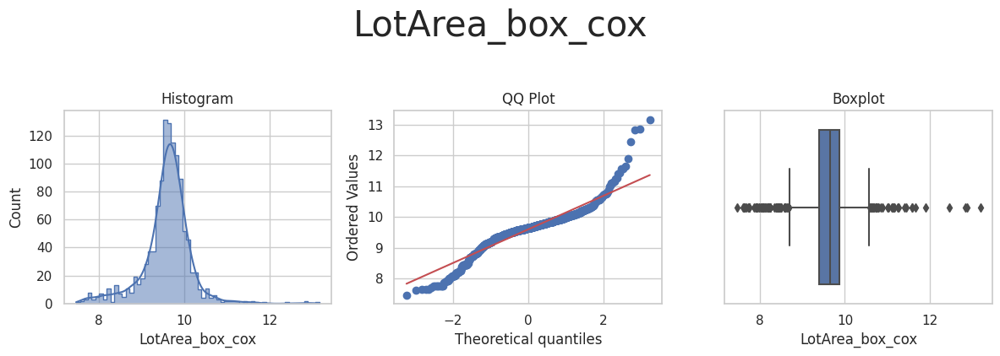

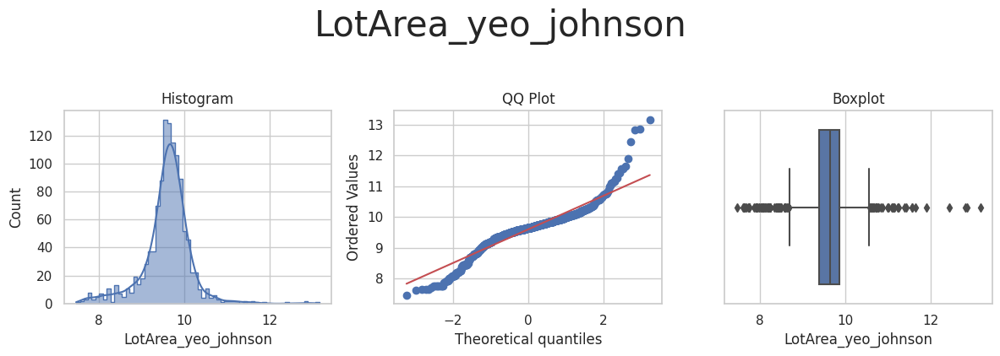



* Variable Analyzed: LotFrontage
* Applied transformation: ['LotFrontage_log_e', 'LotFrontage_log_10', 'LotFrontage_reciprocal', 'LotFrontage_power', 'LotFrontage_box_cox', 'LotFrontage_yeo_johnson'] 



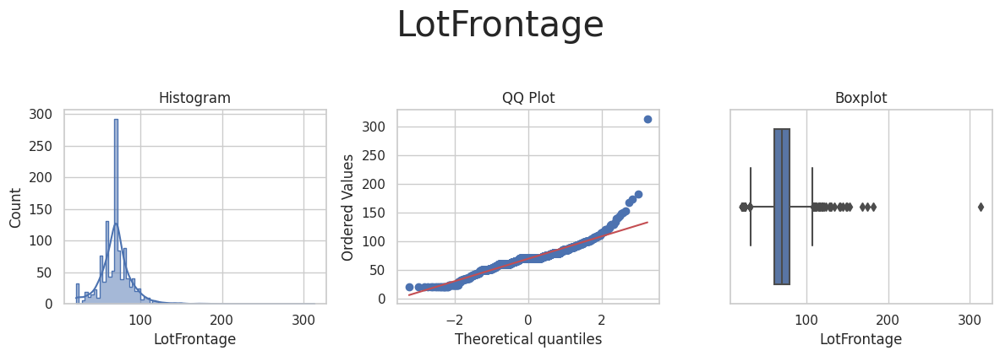

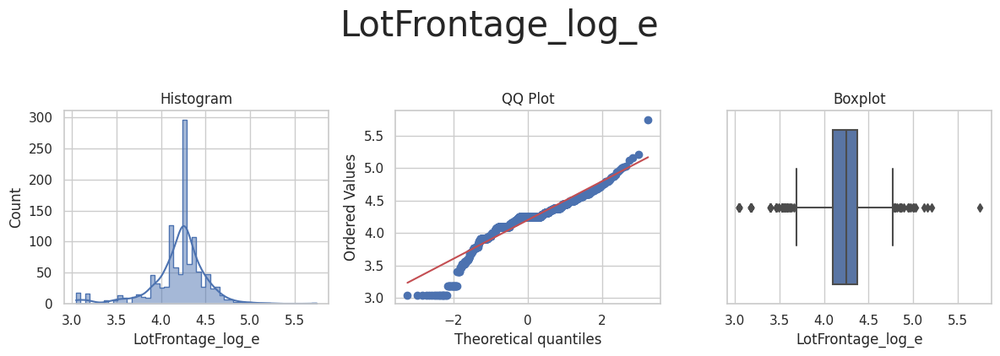

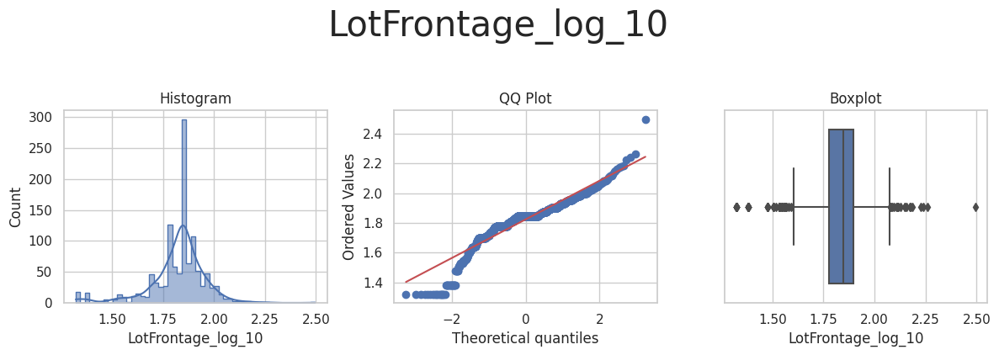

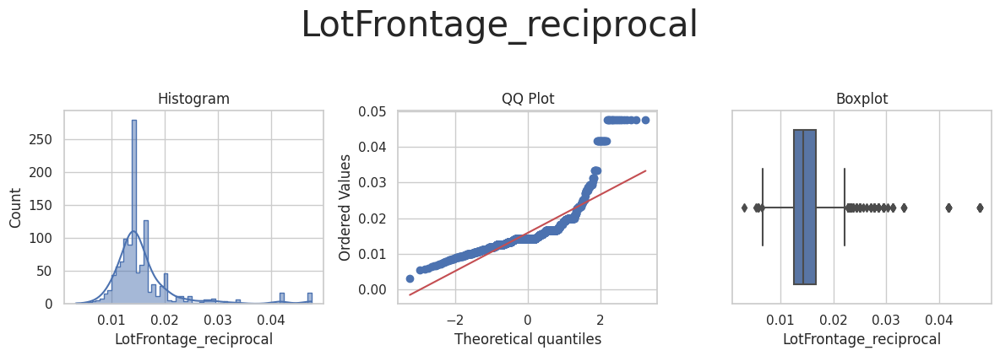

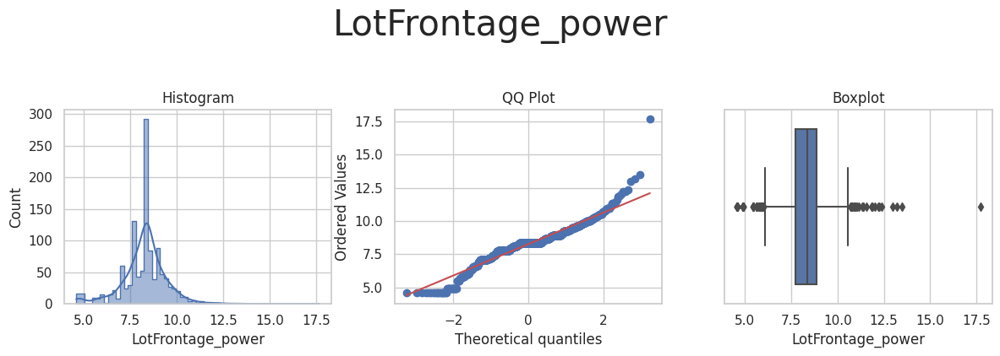

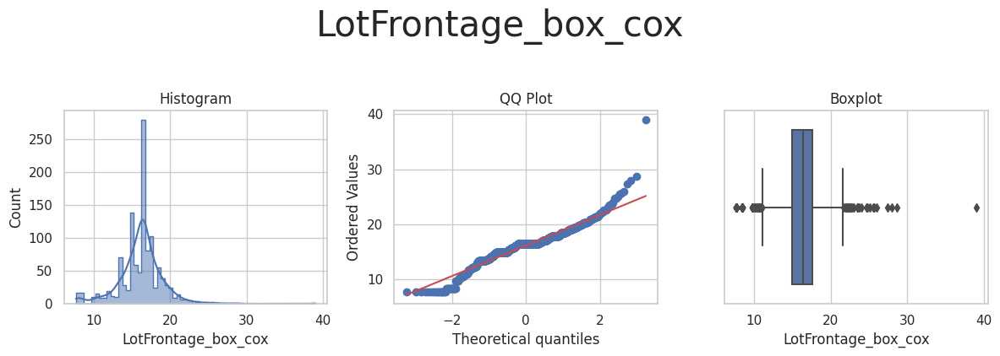

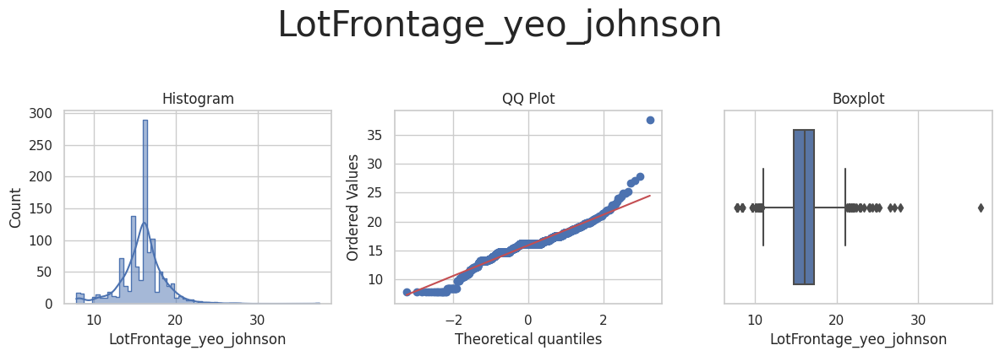



* Variable Analyzed: MasVnrArea
* Applied transformation: ['MasVnrArea_power', 'MasVnrArea_yeo_johnson'] 



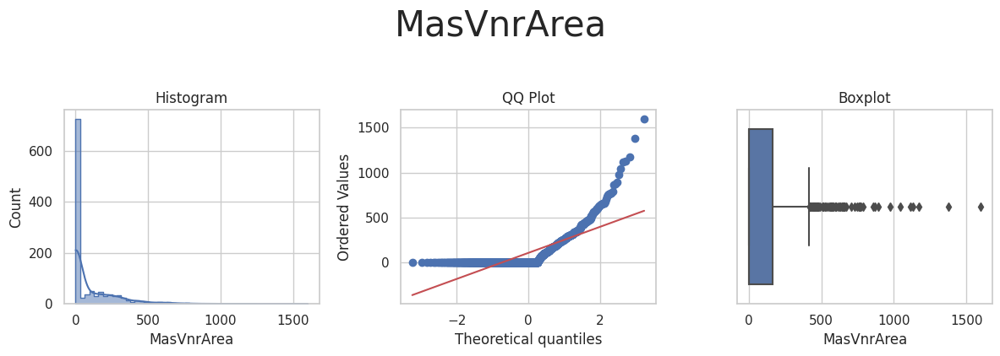

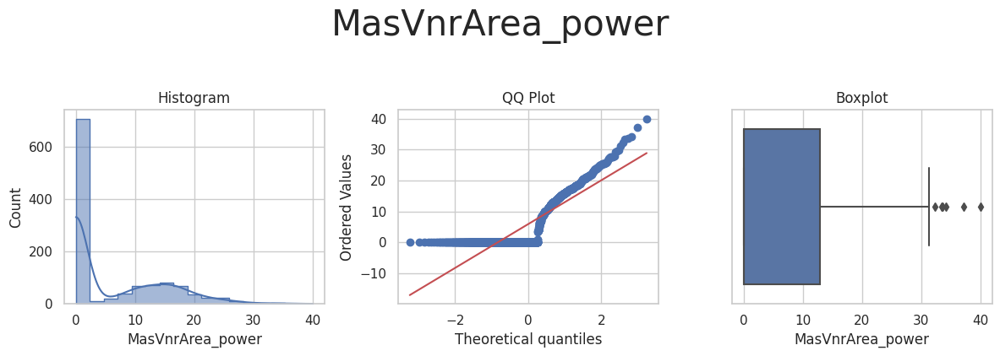

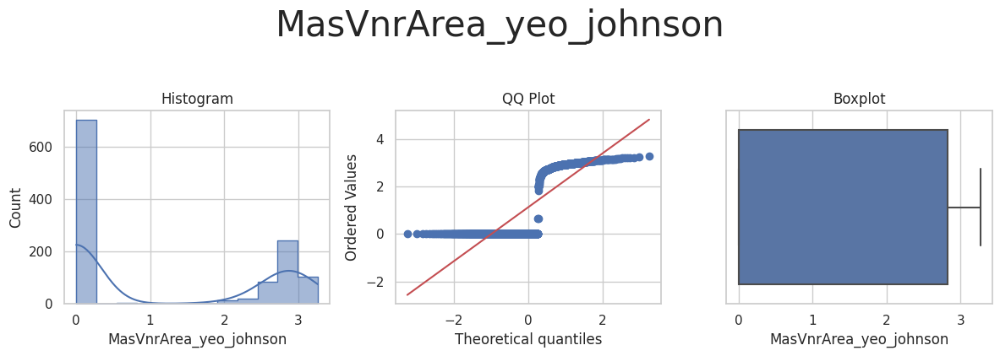



* Variable Analyzed: OpenPorchSF
* Applied transformation: ['OpenPorchSF_power', 'OpenPorchSF_yeo_johnson'] 



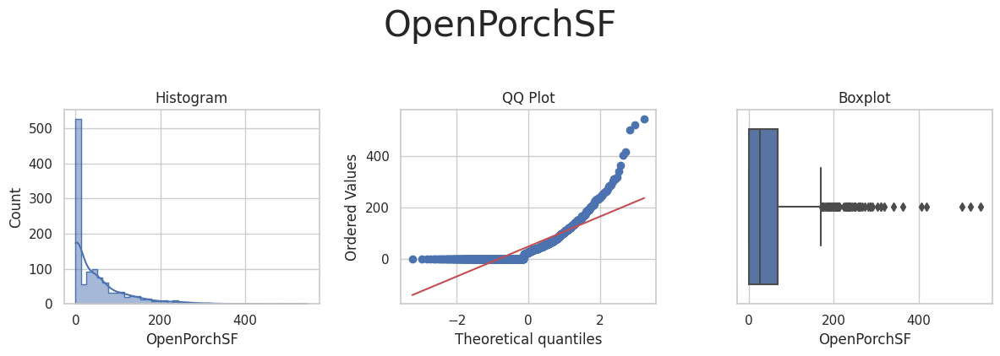

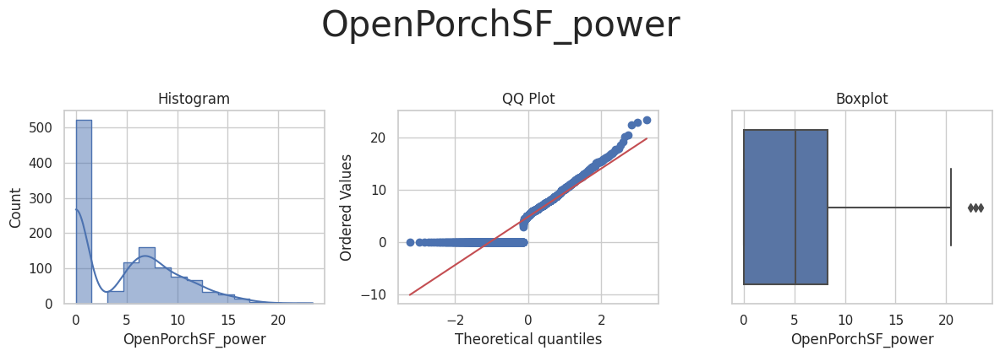

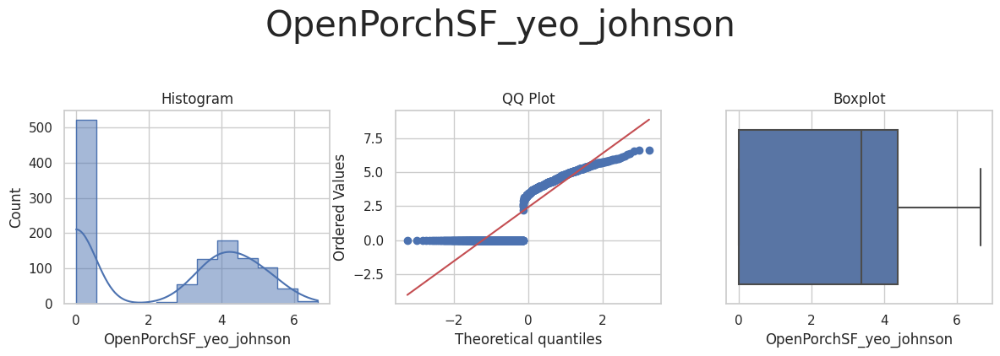



* Variable Analyzed: OverallCond
* Applied transformation: ['OverallCond_log_e', 'OverallCond_log_10', 'OverallCond_reciprocal', 'OverallCond_power', 'OverallCond_box_cox', 'OverallCond_yeo_johnson'] 



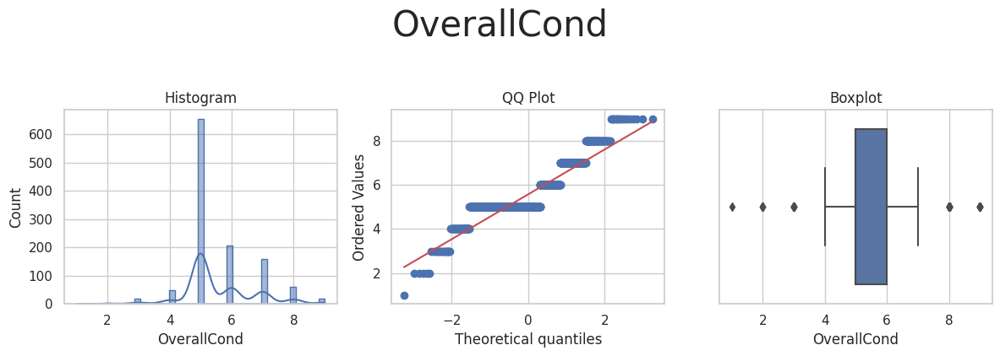

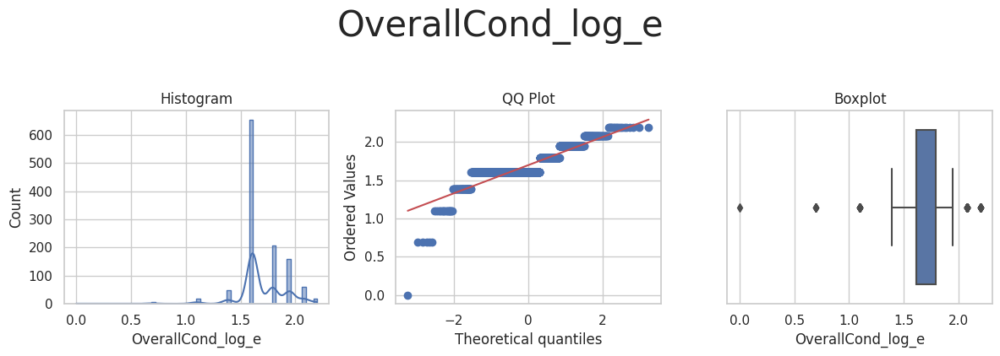

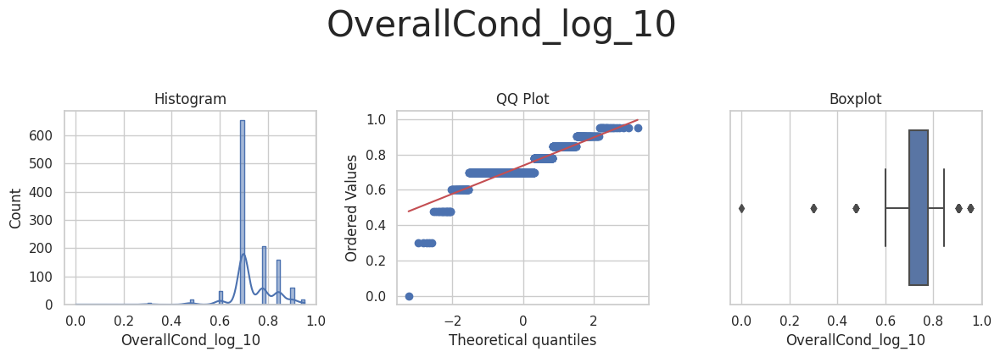

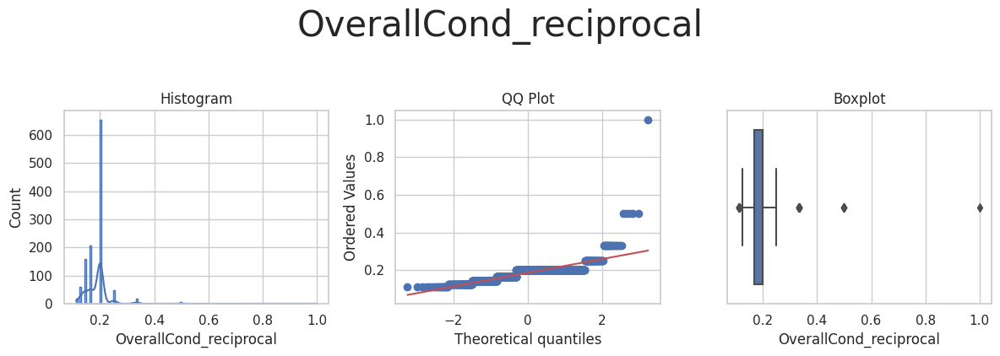

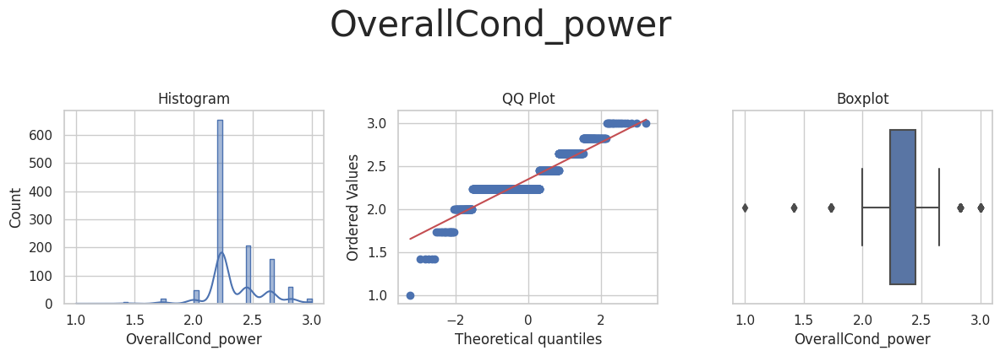

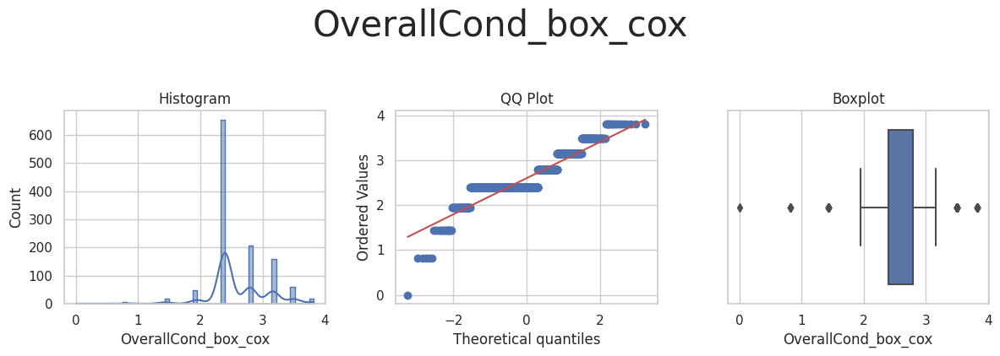

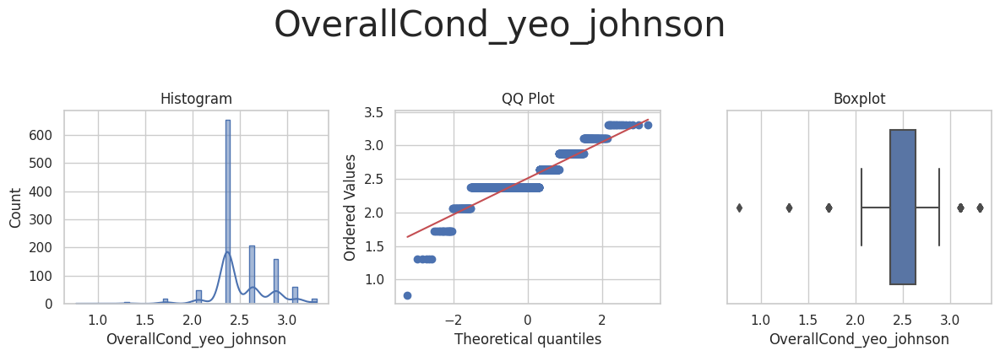



* Variable Analyzed: OverallQual
* Applied transformation: ['OverallQual_log_e', 'OverallQual_log_10', 'OverallQual_reciprocal', 'OverallQual_power', 'OverallQual_box_cox', 'OverallQual_yeo_johnson'] 



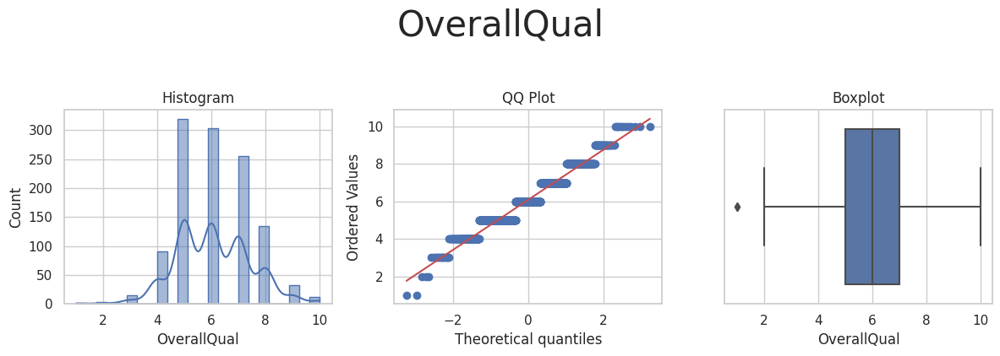

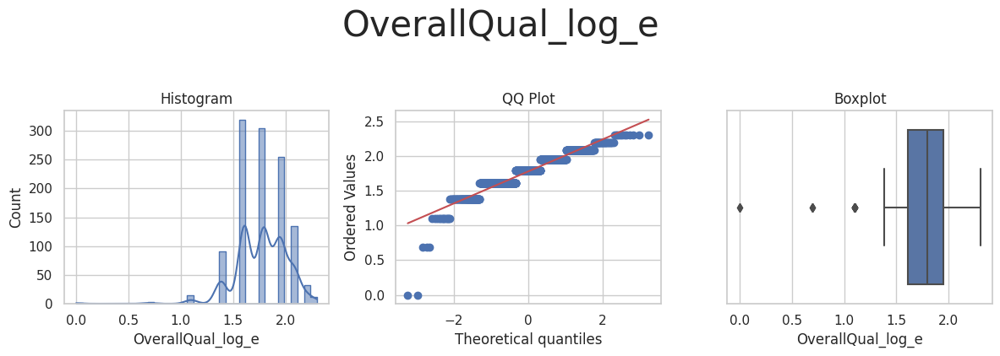

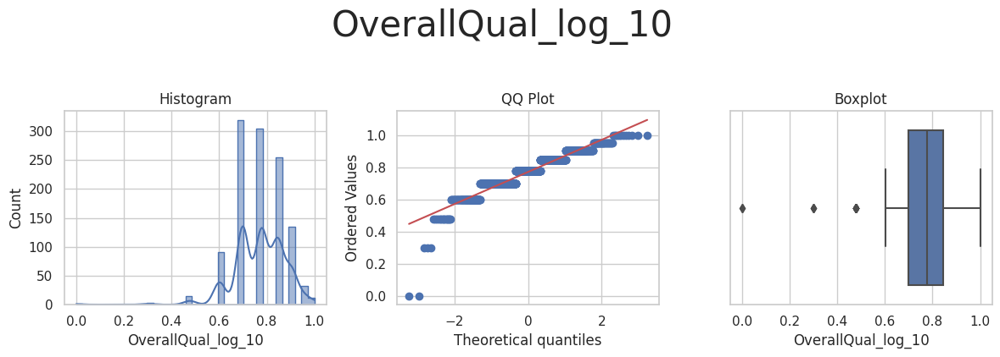

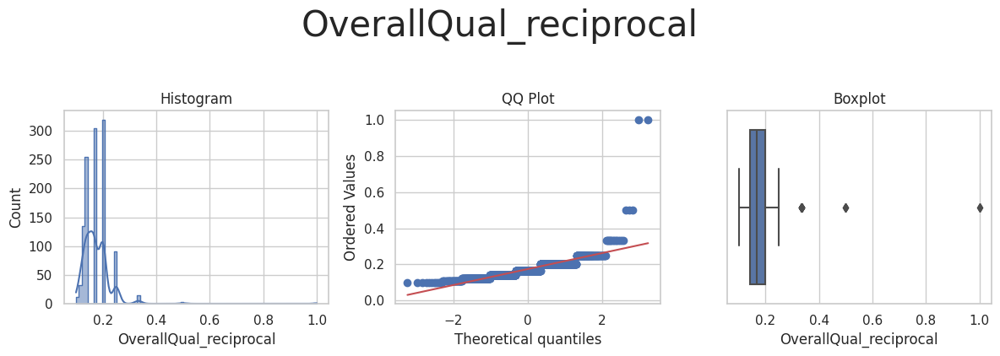

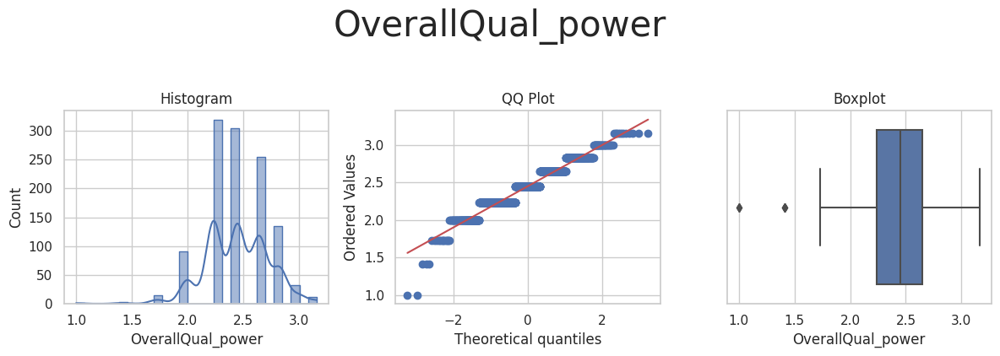

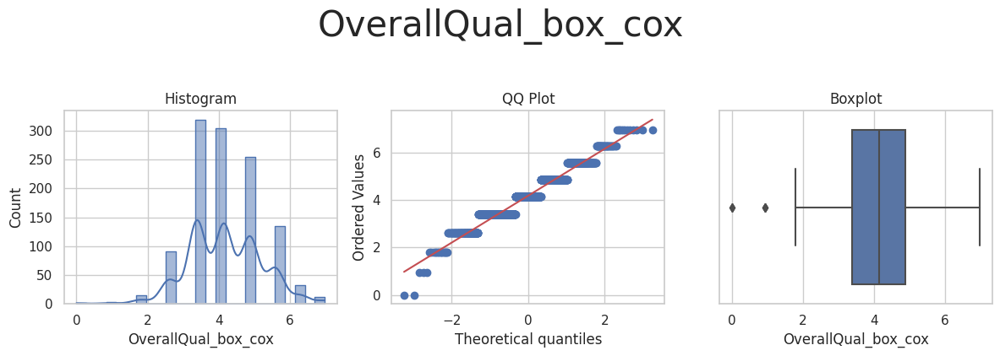

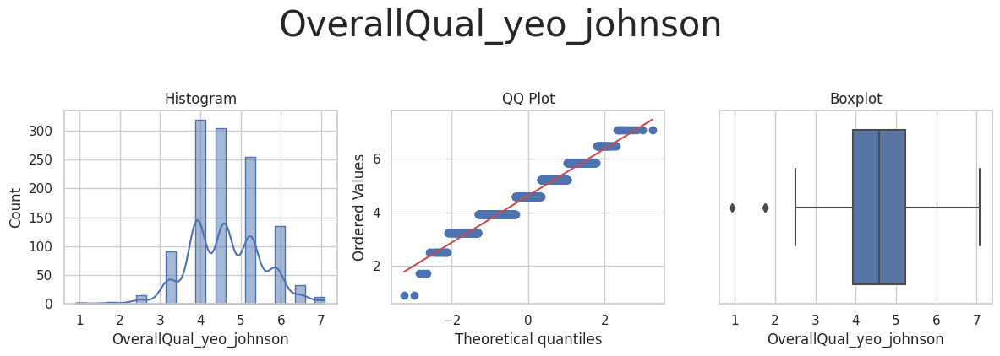



* Variable Analyzed: TotalBsmtSF
* Applied transformation: ['TotalBsmtSF_power', 'TotalBsmtSF_yeo_johnson'] 



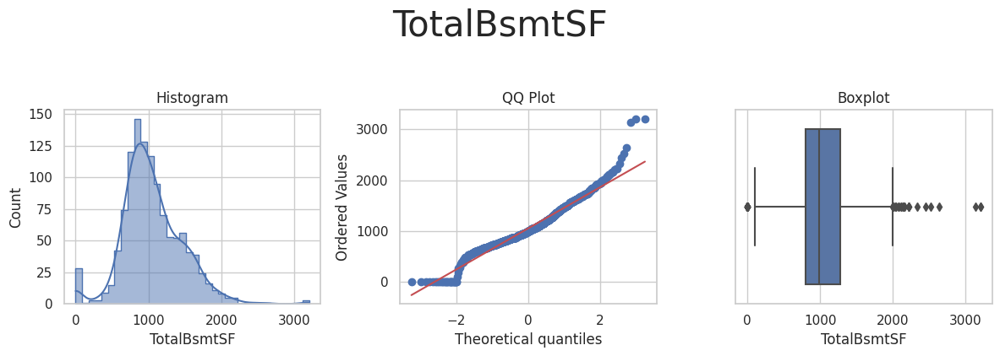

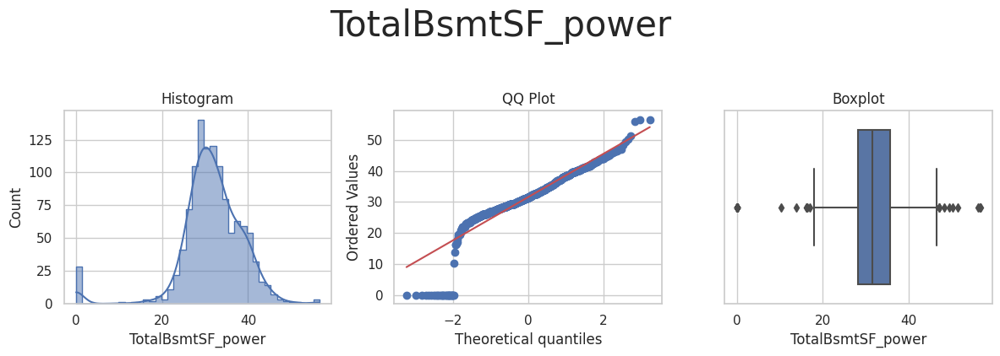

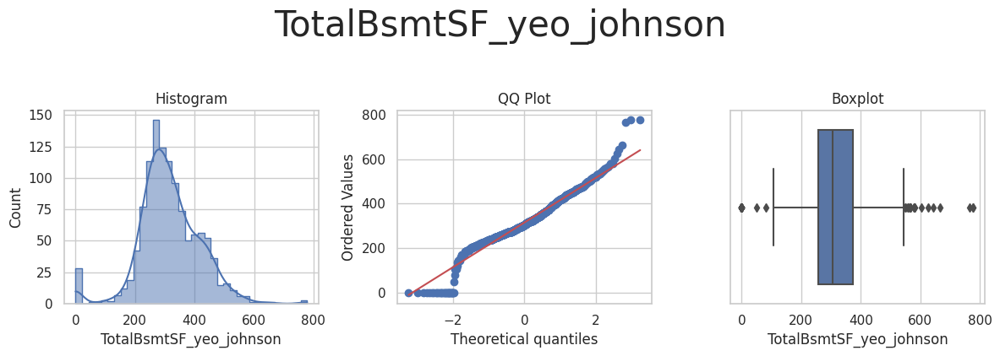



* Variable Analyzed: WoodDeckSF
* Applied transformation: ['WoodDeckSF_power', 'WoodDeckSF_yeo_johnson'] 



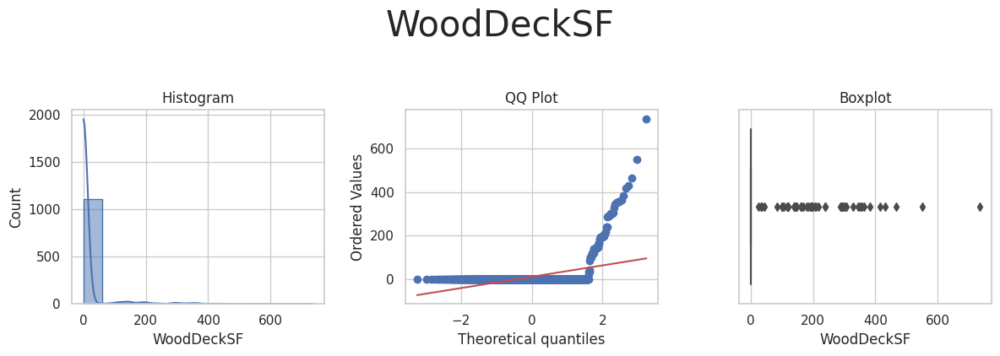

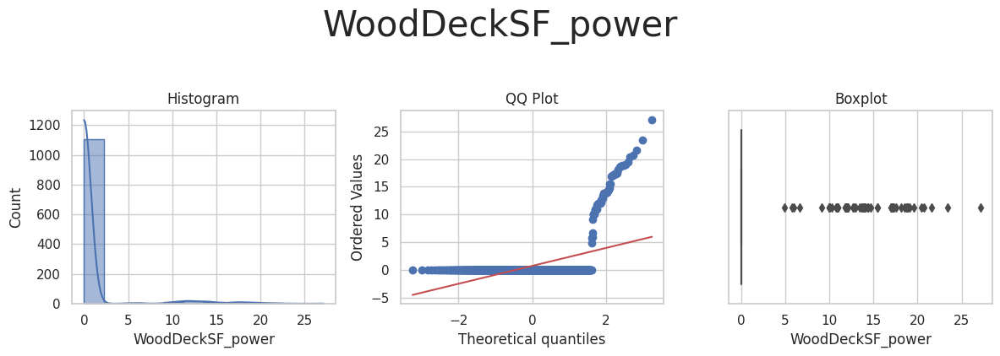

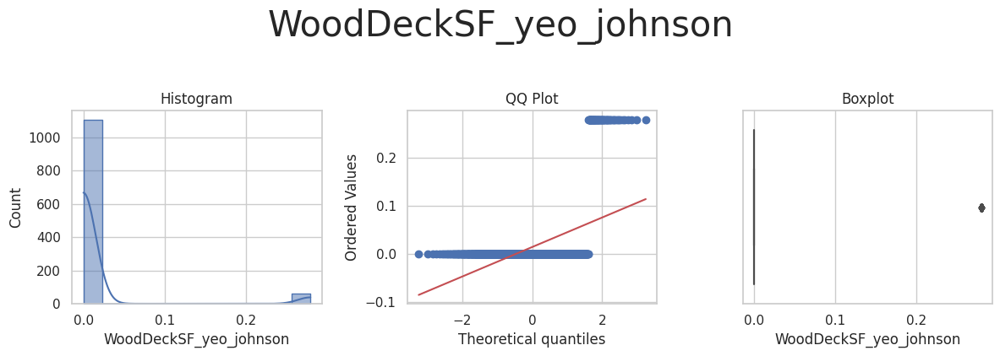



* Variable Analyzed: YearBuilt
* Applied transformation: ['YearBuilt_log_e', 'YearBuilt_log_10', 'YearBuilt_reciprocal', 'YearBuilt_power', 'YearBuilt_box_cox', 'YearBuilt_yeo_johnson'] 



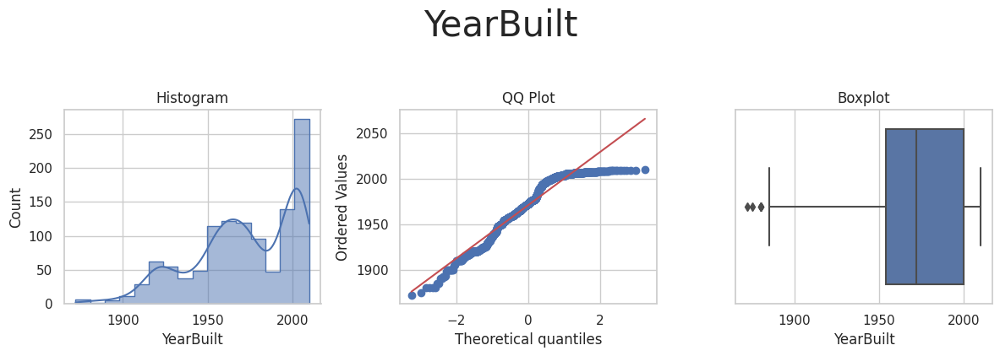

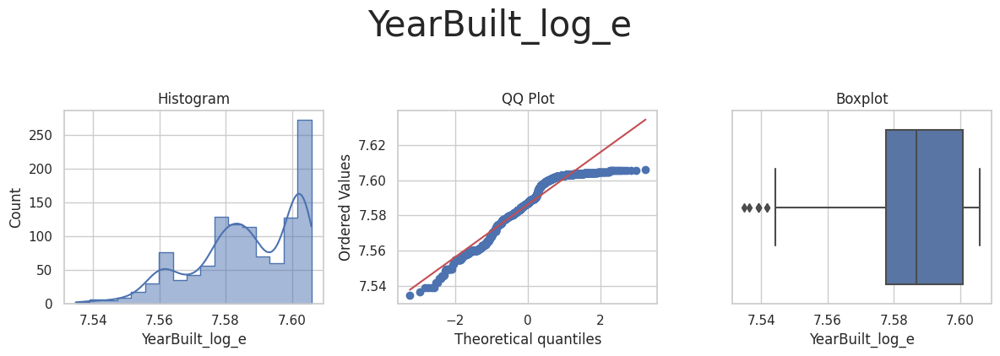

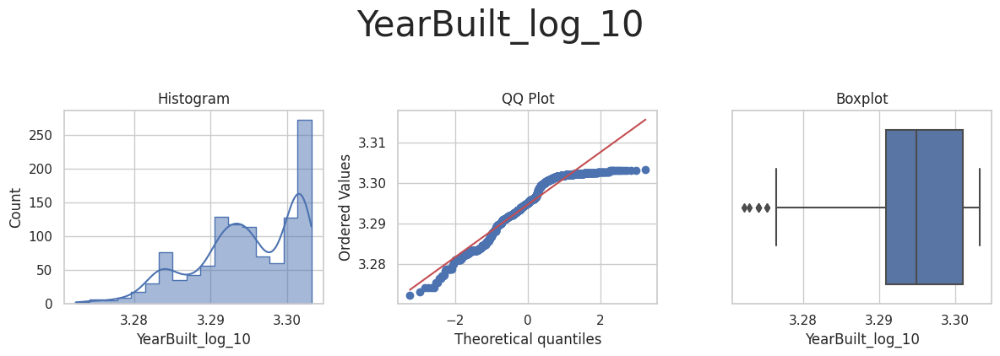

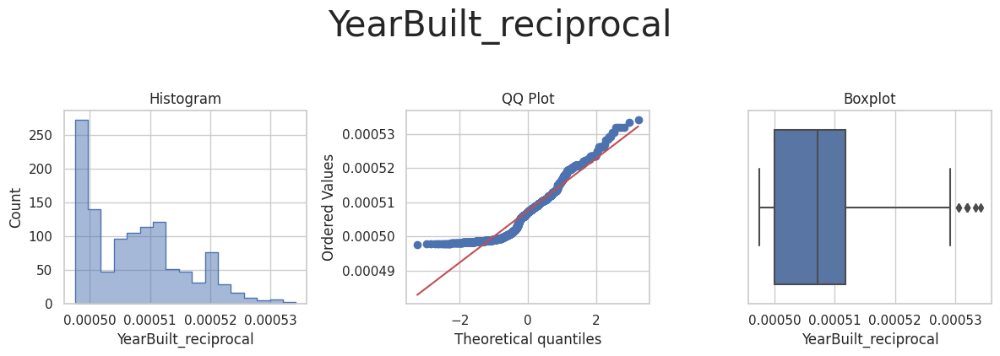

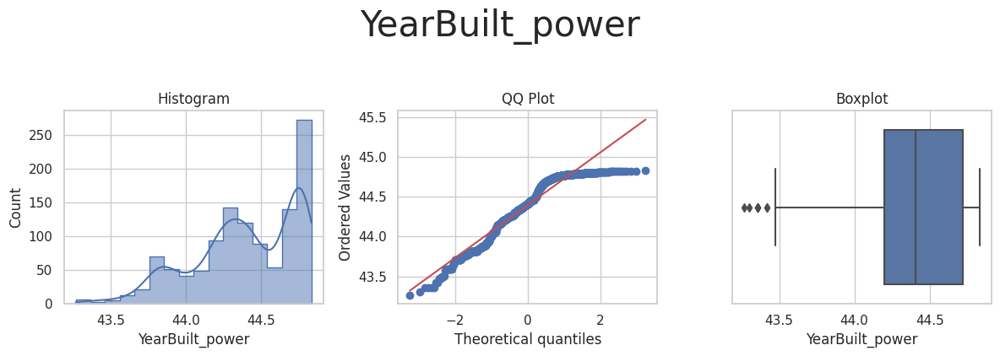

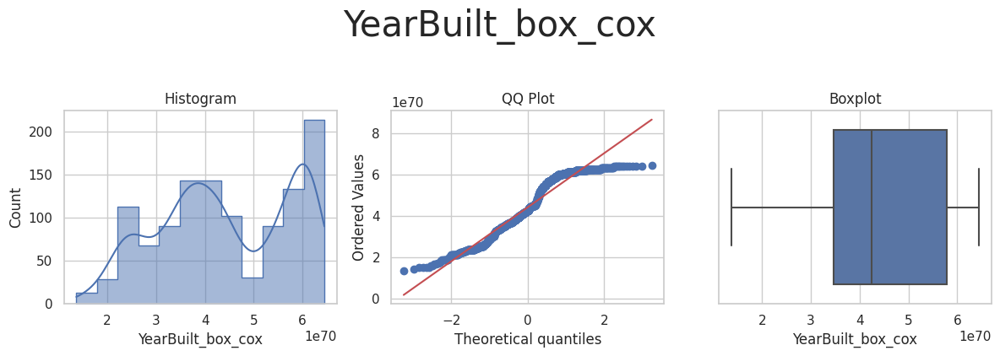

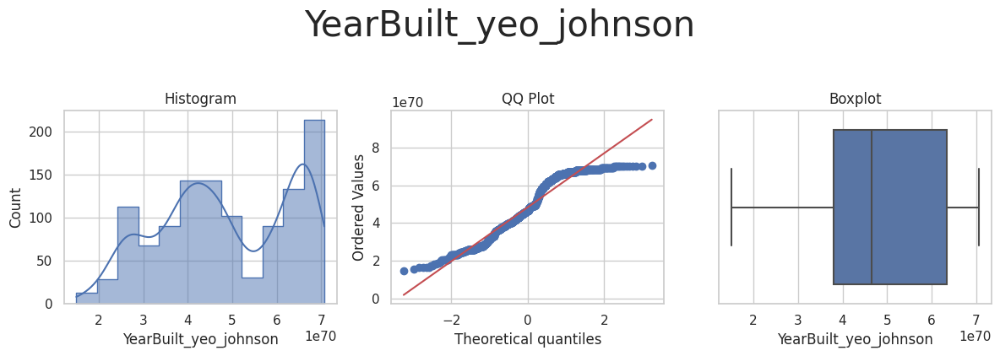



* Variable Analyzed: YearRemodAdd
* Applied transformation: ['YearRemodAdd_log_e', 'YearRemodAdd_log_10', 'YearRemodAdd_reciprocal', 'YearRemodAdd_power', 'YearRemodAdd_box_cox', 'YearRemodAdd_yeo_johnson'] 



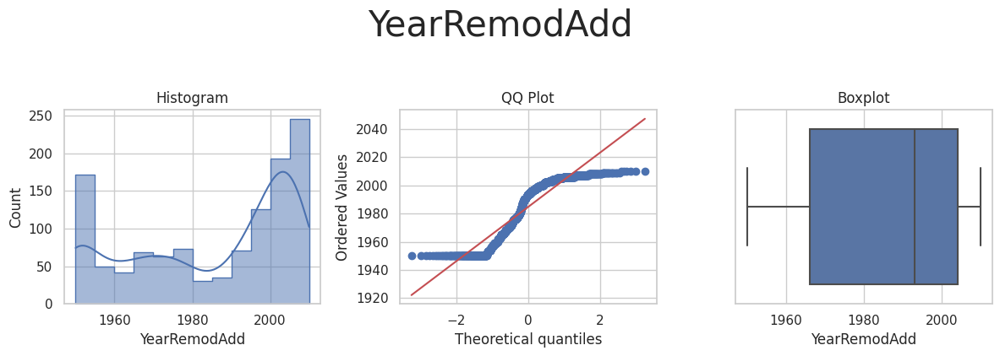

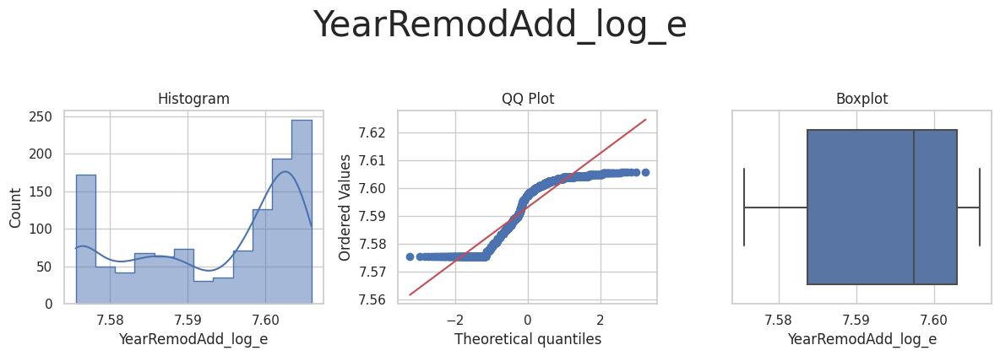

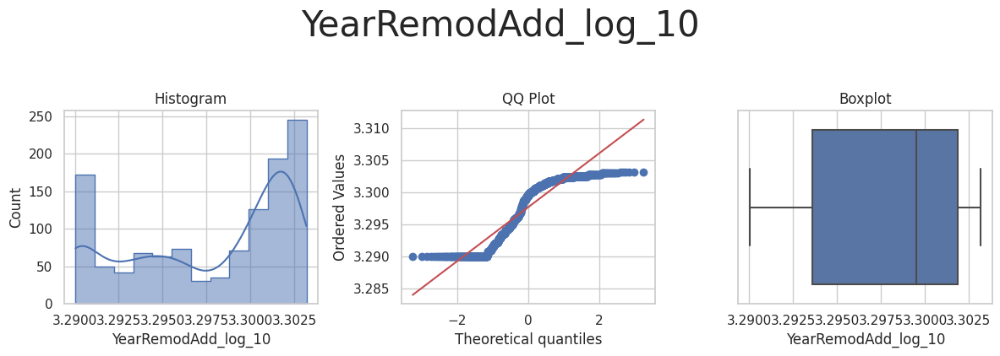

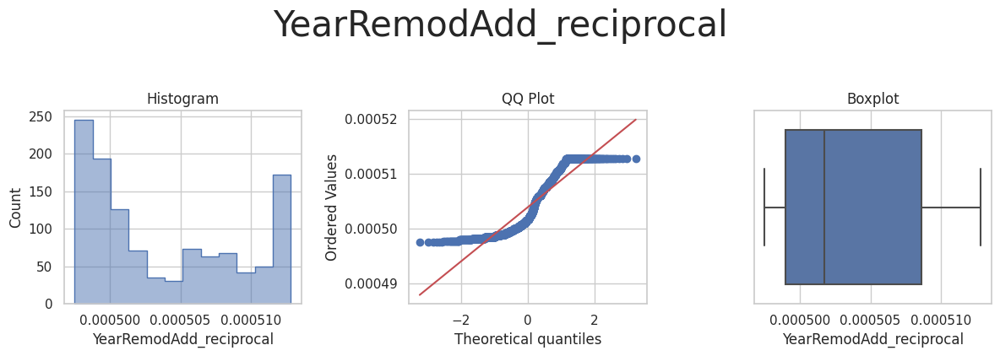

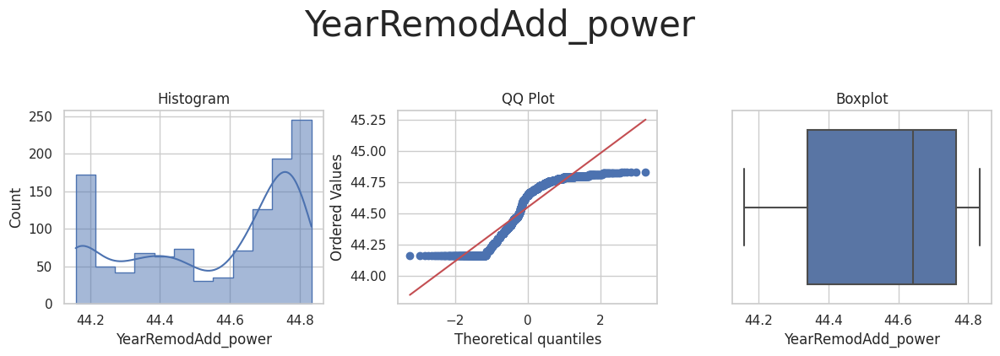

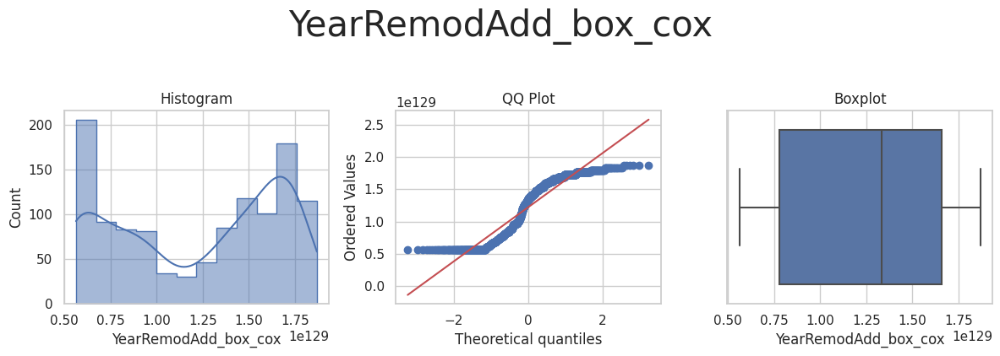

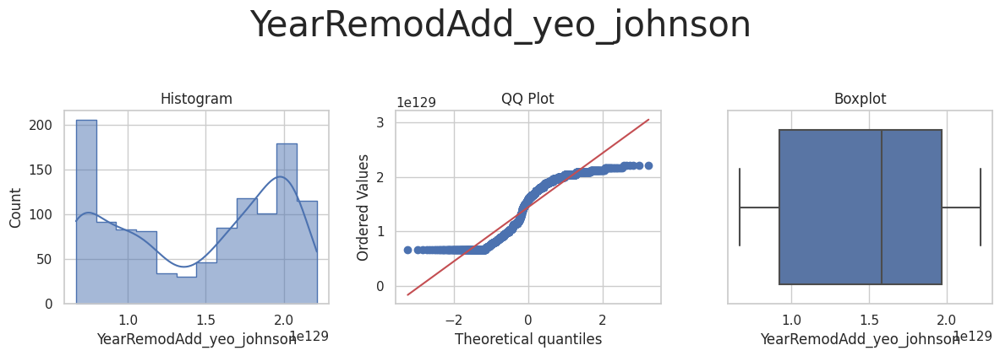

In [21]:
df_engineering = FeatureEngineeringAnalysis(df=df_engineering, analysis_type='numerical')

Each variable has been reviewed as follows:

| Variable | Comments | Conclusion |
| --- | --- | --- |
| 1stFlrSF | Many of the transformations provided an improved QQ plot, including log(e), log(10), box-cox and Yeo-Johnson. These all appear to be broadly similar, therefore log(e) has been selected for simplicity | Transform: Log base e |
| 2ndFlrSF | The power transformation provides an improved distribution, when ignoring the zero values (where there is no second floor). | Transform: Power |
| BedroomAbvGr | No significant improvement to distribution for any transformation. | No transformation |
| BsmtExposure | The power transformation provides an improved distribution, when ignoring the zero values (where there is no basement). | Transform: Power |
| BsmtFinType1 | No significant improvement to distribution for any transformation. | No transformation |
| BsmtFinSF1 | There is some improvement to the distribution using the power transformation (when ignoring the zero values) | Transform: Power |
| BsmtUnfSF | Some improvement to the distribution can be seen in the power and Yeo-Johnson transformations. These are generally very similar improvements, therefore power has been selected for simplicity. | Transform: Power |
| TotalBsmtSF | Some improvement to the distribution can be seen in the power and Yeo-Johnson transformations. These are generally very similar improvements, therefore power has been selected for simplicity. | Transform: Power |
| GarageArea | Some improvement to the distribution can be seen in the power and Yeo-Johnson transformations. These are generally very similar improvements, therefore power has been selected for simplicity. | Transform: Power |
| GarageFinish | No significant improvement to distribution for any transformation. | No transformation |
| GarageYrBlt | No significant improvement to distribution for any transformation. | No transformation |
| GrLivArea | Many of the transformations provided an improved QQ plot, including log(e), log(10), box-cox and Yeo-Johnson. These all appear to be broadly similar, therefore log(e) has been selected for simplicity | Transform: Log base e |
| KitchenQual | No significant improvement to distribution for any transformation. | No transformation |
| LotArea | Many of the transformations provided an improved QQ plot, including log(e), log(10), box-cox and Yeo-Johnson. These all appear to be broadly similar, therefore log(e) has been selected for simplicity | Transform: Log base e |
| LotFrontage | Many of the transformations provided an improved QQ plot, including log(e), log(10), box-cox and Yeo-Johnson. These all appear to be broadly similar, therefore log(e) has been selected for simplicity | Transform: Log base e |
| MasVnrArea | No significant improvement to distribution for any transformation. | No transformation |
| EnclosedPorch | No significant improvement to distribution for any transformation. | No transformation |
| OpenPorchSF | No significant improvement to distribution for any transformation. | No transformation |
| OverallCond | No significant improvement to distribution for any transformation. | No transformation |
| OverallQual | No significant improvement to distribution for any transformation. | No transformation |
| WoodDeckSF | No significant improvement to distribution for any transformation. | No transformation |
| YearBuilt | No significant improvement to distribution for any transformation. | No transformation |
| YearRemodAdd |  No significant improvement to distribution for any transformation. | No transformation |

These will be applied as below:

### Log Base e Transformations

Selecting the variables per the above table:

In [22]:
variables_engineering_log_e = ['1stFlrSF', 'GrLivArea', 'LotArea', 'LotFrontage']
variables_engineering_log_e

['1stFlrSF', 'GrLivArea', 'LotArea', 'LotFrontage']

Applying the transformation:

In [24]:
tf = vt.LogTransformer(variables=variables_engineering_log_e)
TrainSet = tf.fit_transform(TrainSet)
TestSet = tf.transform(TestSet)

### Power Transformations

Selecting the variables per the above table:

In [23]:
variables_engineering_power = ['2ndFlrSF', 'BsmtExposure', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', 'GarageArea']
variables_engineering_power

['2ndFlrSF',
 'BsmtExposure',
 'BsmtFinSF1',
 'BsmtUnfSF',
 'TotalBsmtSF',
 'GarageArea']

Applying the transformation:

In [25]:
tf = vt.PowerTransformer(variables=variables_engineering_power)
TrainSet = tf.fit_transform(TrainSet)
TestSet = tf.transform(TestSet)

## Outlier Transformation

All variables (except the target) are selected to analyse the outlier transformations:

In [26]:
variables_engineering = (TrainSet.select_dtypes(include=['float', 'int']).columns.to_list())
variables_engineering.remove('SalePrice')
variables_engineering

['1stFlrSF',
 '2ndFlrSF',
 'BedroomAbvGr',
 'BsmtExposure',
 'BsmtFinSF1',
 'BsmtFinType1',
 'BsmtUnfSF',
 'EnclosedPorch',
 'GarageArea',
 'GarageFinish',
 'GarageYrBlt',
 'GrLivArea',
 'KitchenQual',
 'LotArea',
 'LotFrontage',
 'MasVnrArea',
 'OpenPorchSF',
 'OverallCond',
 'OverallQual',
 'TotalBsmtSF',
 'WoodDeckSF',
 'YearBuilt',
 'YearRemodAdd']

A dataframe with these variables is created:

In [27]:
df_engineering = TrainSet[variables_engineering].copy()
df_engineering.head(3)

,1stFlrSF,2ndFlrSF,BedroomAbvGr,BsmtExposure,BsmtFinSF1,BsmtFinType1,BsmtUnfSF,EnclosedPorch,GarageArea,GarageFinish,...,LotArea,LotFrontage,MasVnrArea,OpenPorchSF,OverallCond,OverallQual,TotalBsmtSF,WoodDeckSF,YearBuilt,YearRemodAdd
0,7.510978,0.0,3.0,0.0,6.928203,0,42.118879,0.0,27.820855,0,...,9.366831,4.499810,452.0,108,5,9,42.684892,0.0,2007,2007
1,6.795706,0.0,2.0,1.0,0.000000,0,29.899833,0.0,17.549929,0,...,8.794825,4.094345,0.0,0,5,5,29.899833,0.0,1962,1962
2,6.871091,0.0,2.0,1.0,26.702060,1,12.767145,0.0,20.784610,0,...,9.500020,4.382027,0.0,0,7,5,29.597297,0.0,1921,2006


The winsorizer is applied to these variables to analyse the impact of trimming outliers:

* Variable Analyzed: 1stFlrSF
* Applied transformation: ['1stFlrSF_iqr'] 



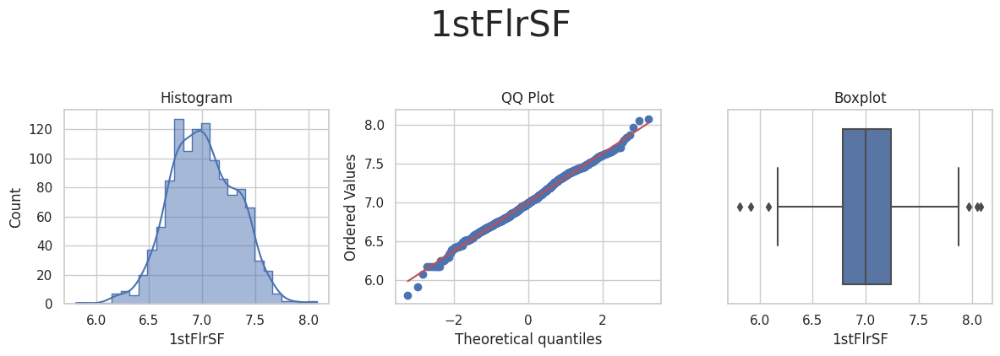

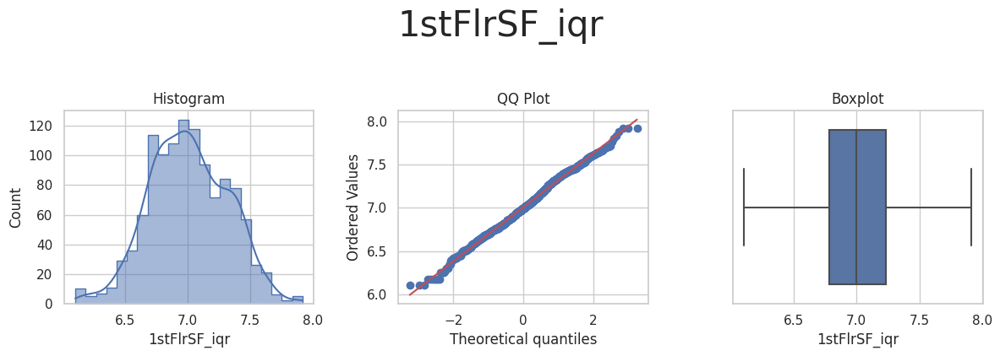



* Variable Analyzed: 2ndFlrSF
* Applied transformation: ['2ndFlrSF_iqr'] 



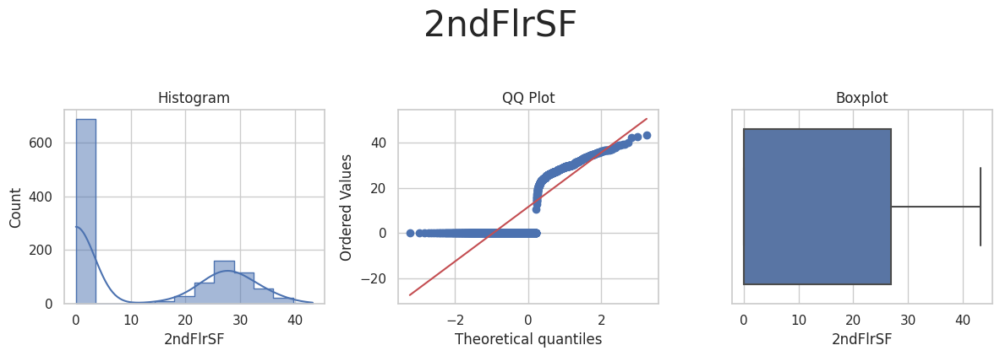

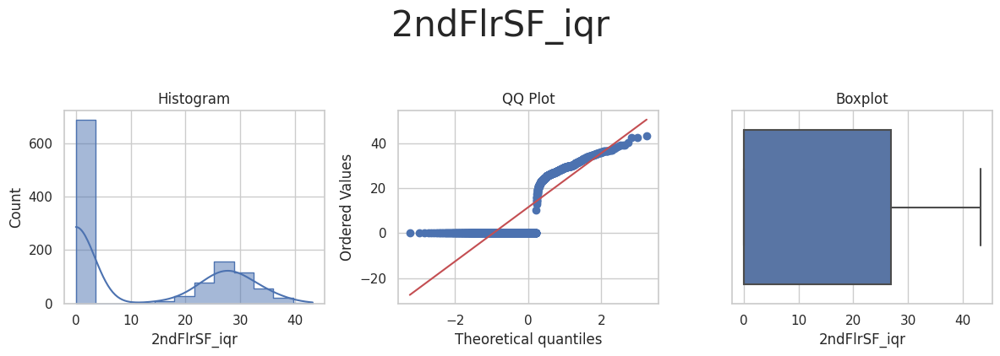



* Variable Analyzed: BedroomAbvGr
* Applied transformation: ['BedroomAbvGr_iqr'] 



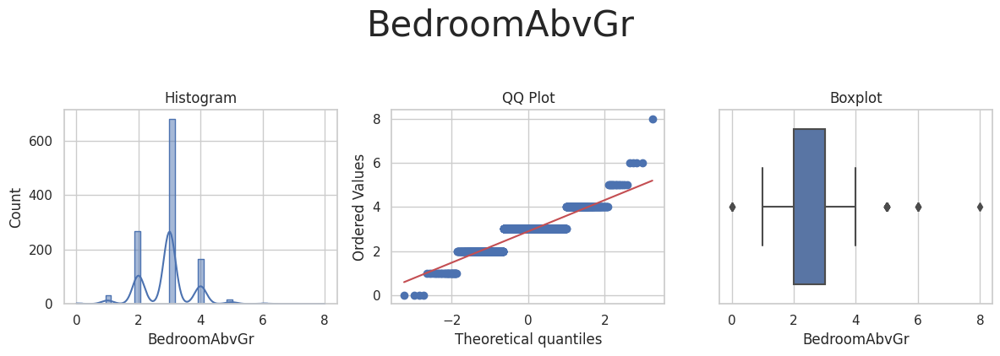

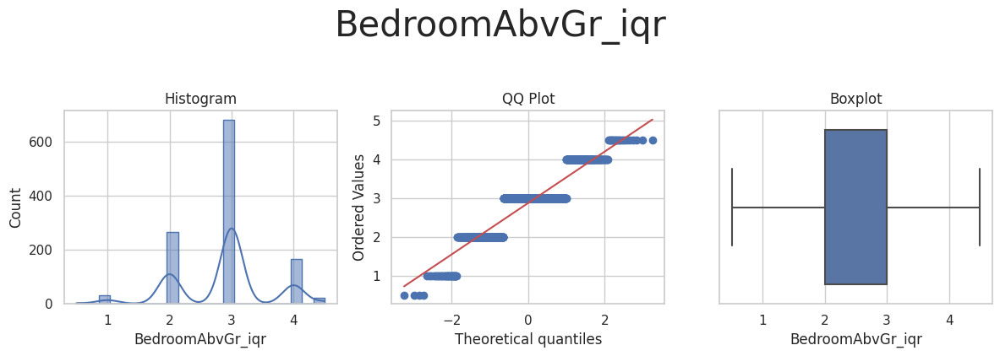



* Variable Analyzed: BsmtExposure
* Applied transformation: ['BsmtExposure_iqr'] 



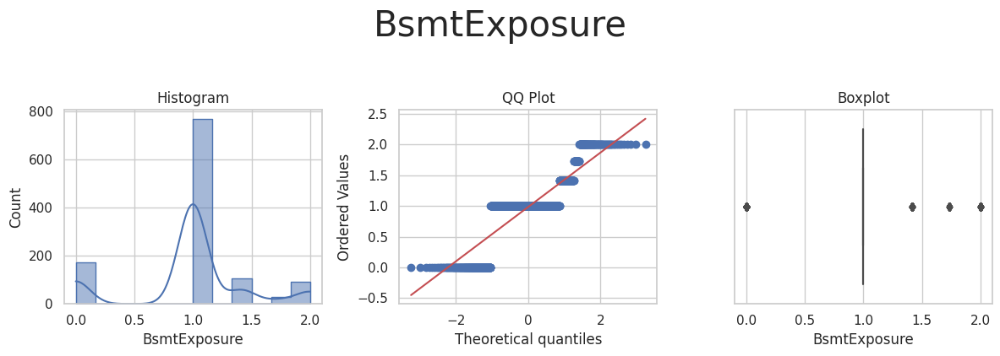

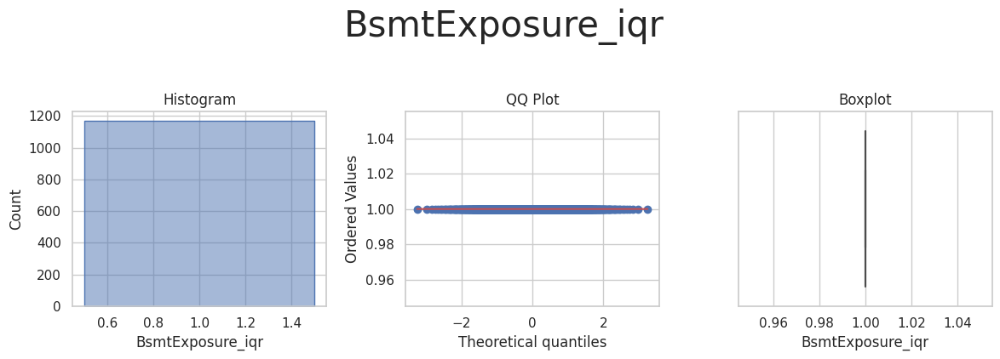



* Variable Analyzed: BsmtFinSF1
* Applied transformation: ['BsmtFinSF1_iqr'] 



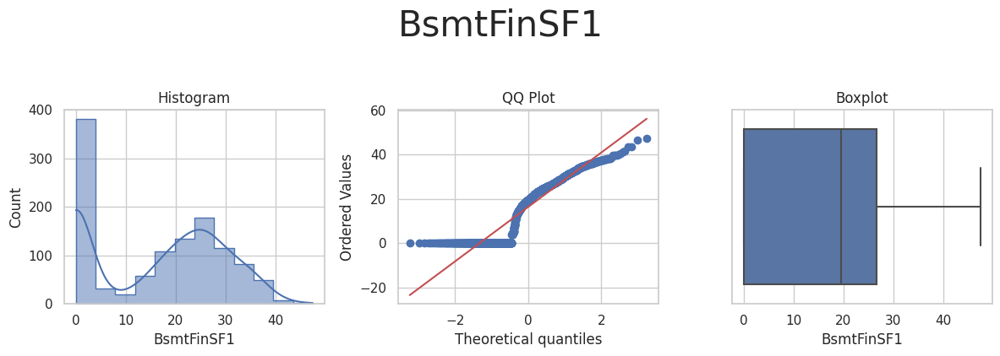

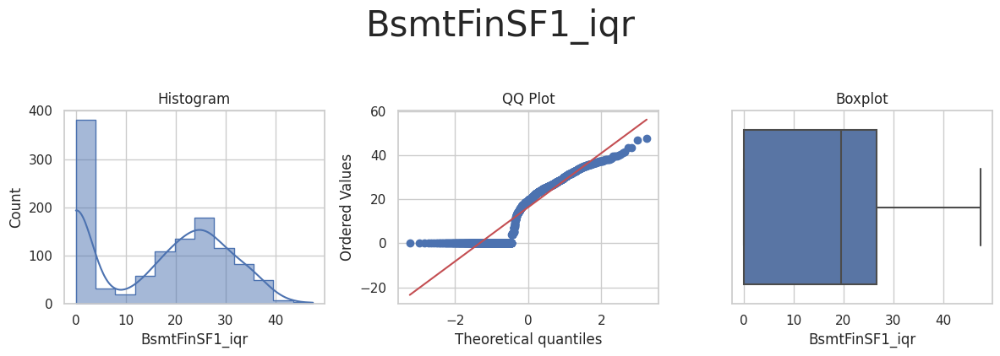



* Variable Analyzed: BsmtFinType1
* Applied transformation: ['BsmtFinType1_iqr'] 



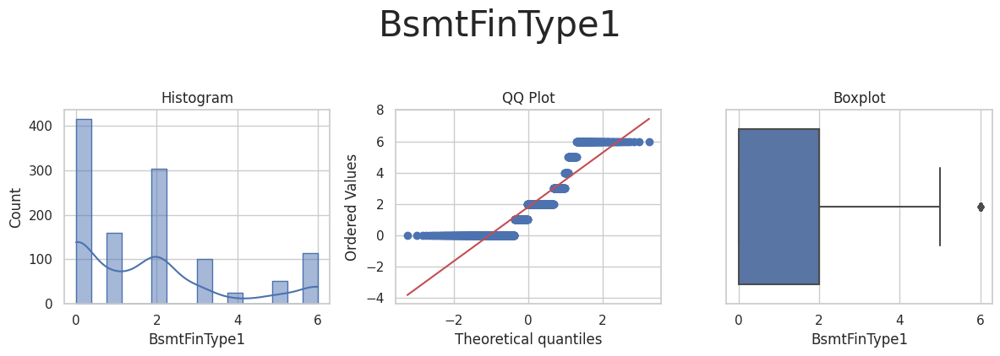

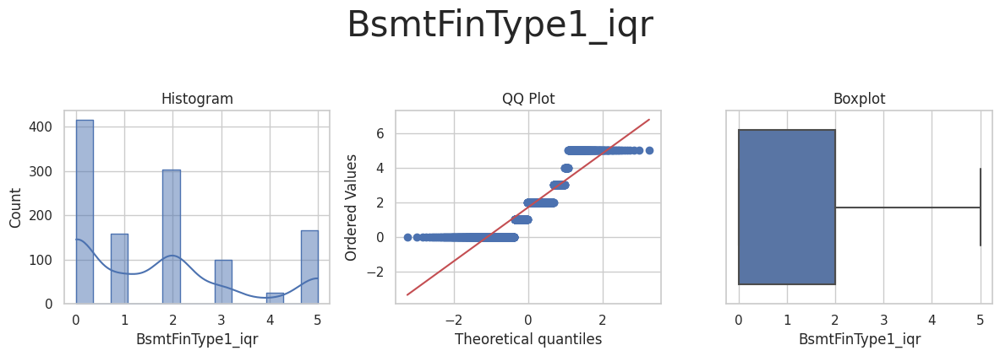



* Variable Analyzed: BsmtUnfSF
* Applied transformation: ['BsmtUnfSF_iqr'] 



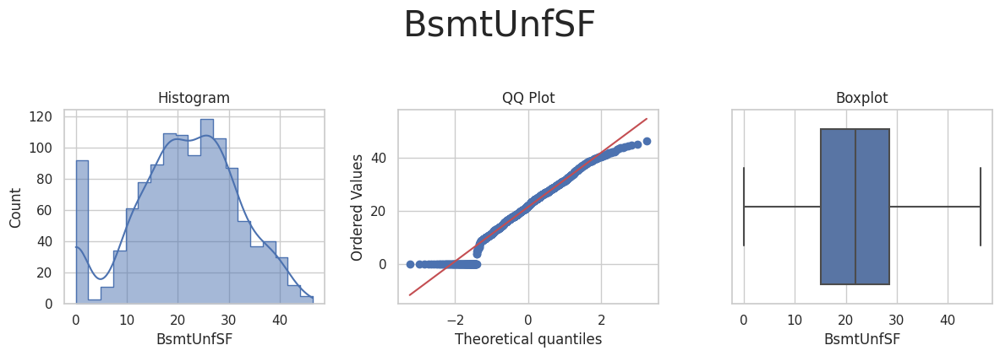

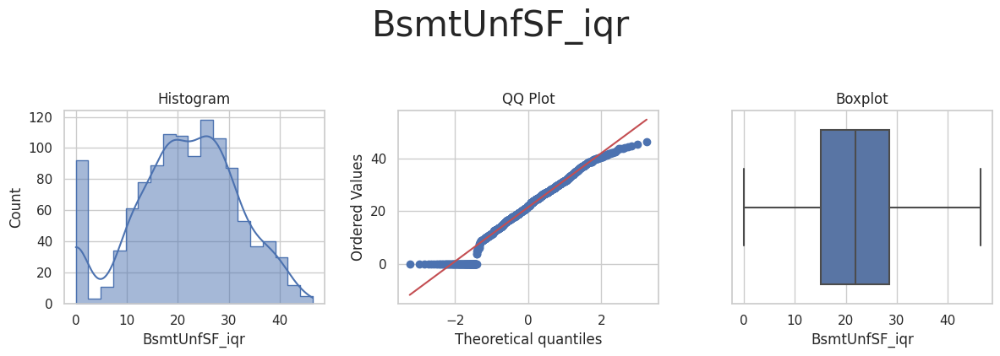



* Variable Analyzed: EnclosedPorch
* Applied transformation: ['EnclosedPorch_iqr'] 



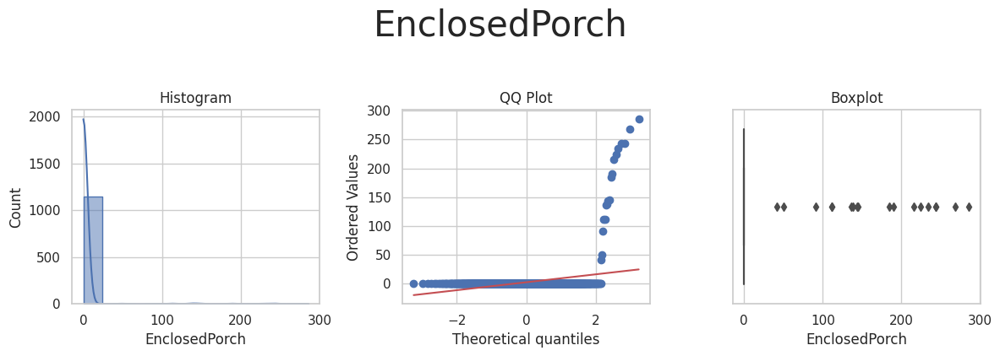

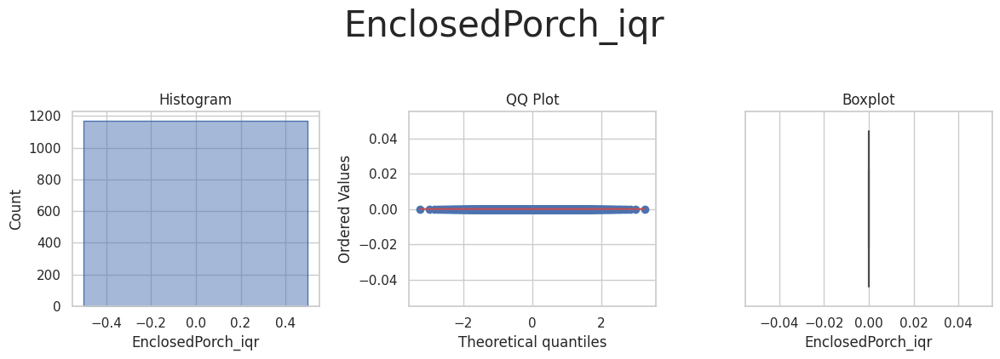



* Variable Analyzed: GarageArea
* Applied transformation: ['GarageArea_iqr'] 



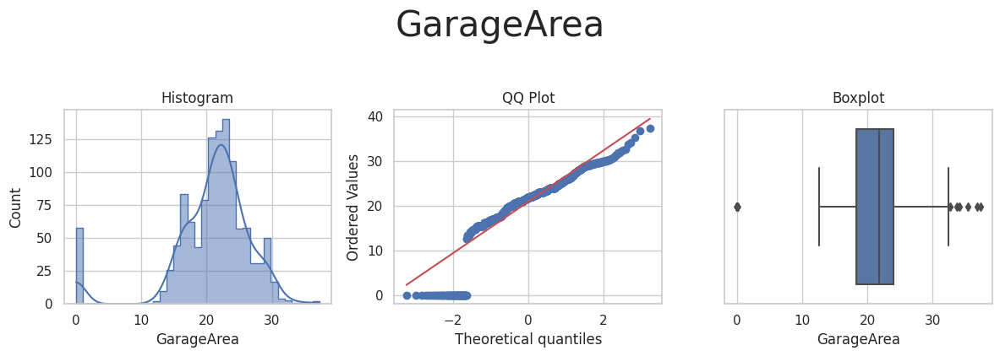

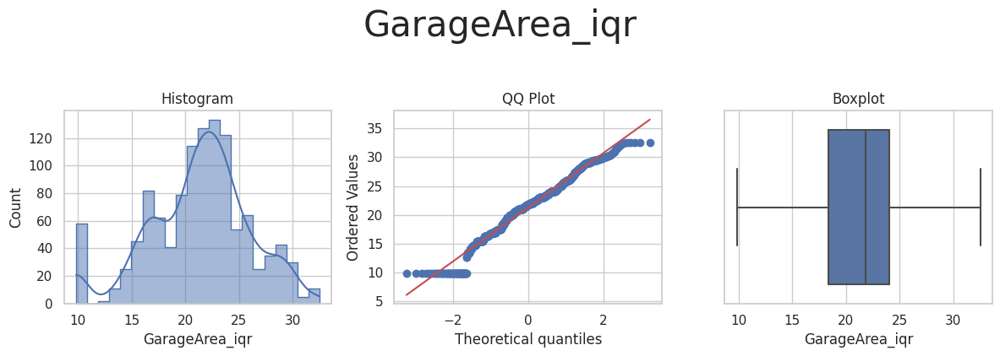



* Variable Analyzed: GarageFinish
* Applied transformation: ['GarageFinish_iqr'] 



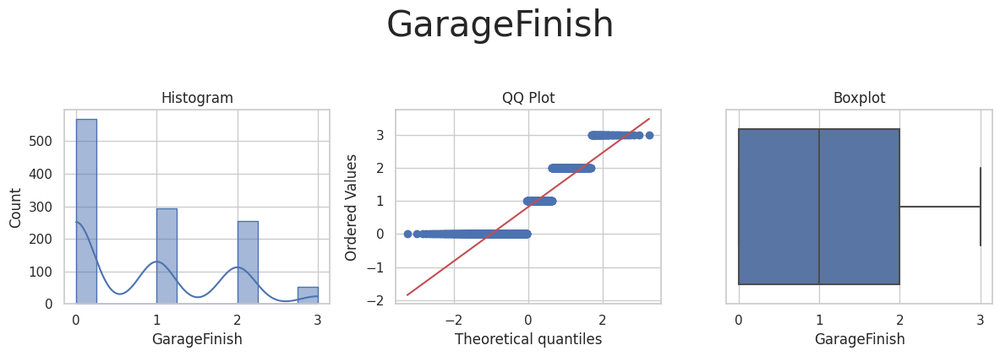

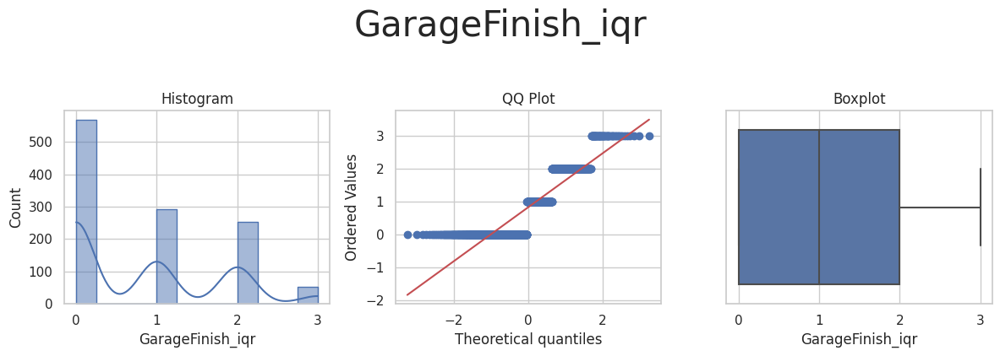



* Variable Analyzed: GarageYrBlt
* Applied transformation: ['GarageYrBlt_iqr'] 



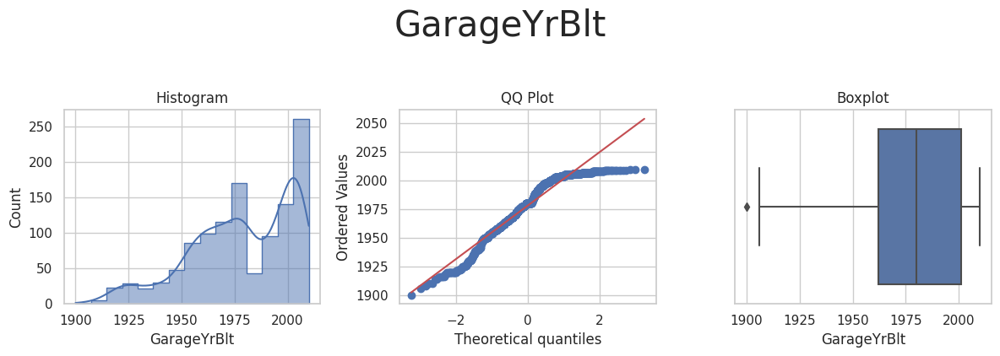

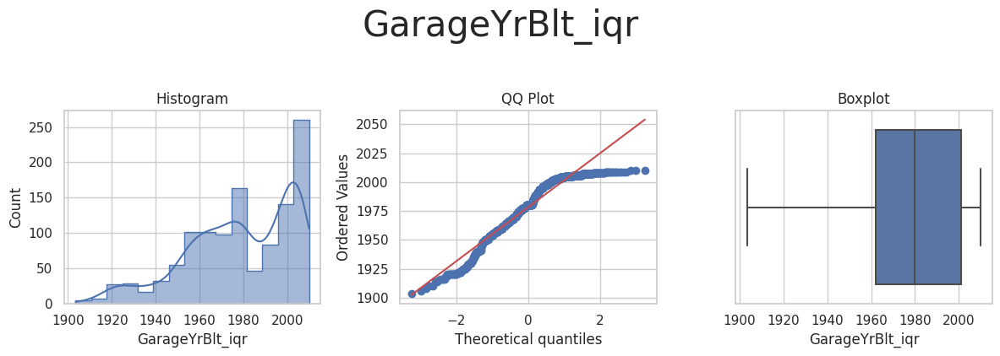



* Variable Analyzed: GrLivArea
* Applied transformation: ['GrLivArea_iqr'] 



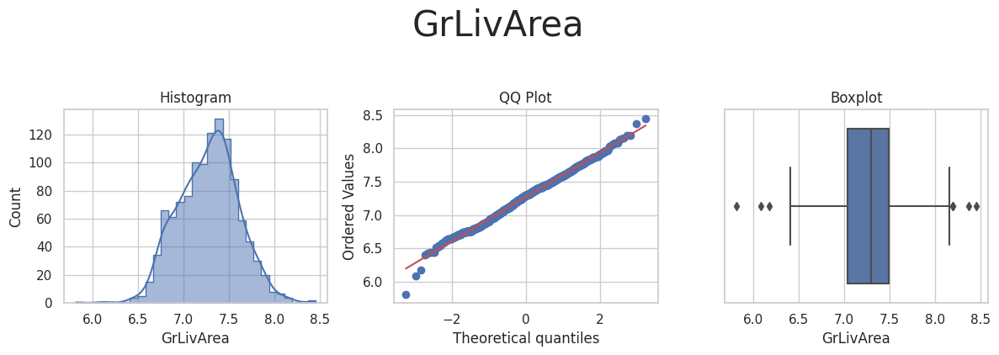

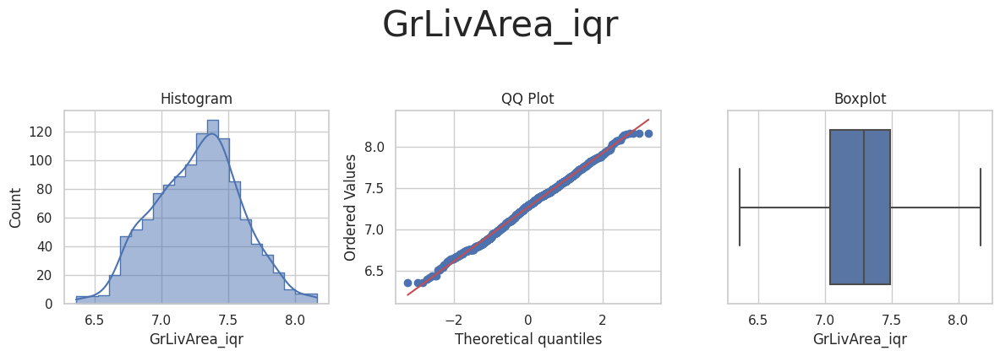



* Variable Analyzed: KitchenQual
* Applied transformation: ['KitchenQual_iqr'] 



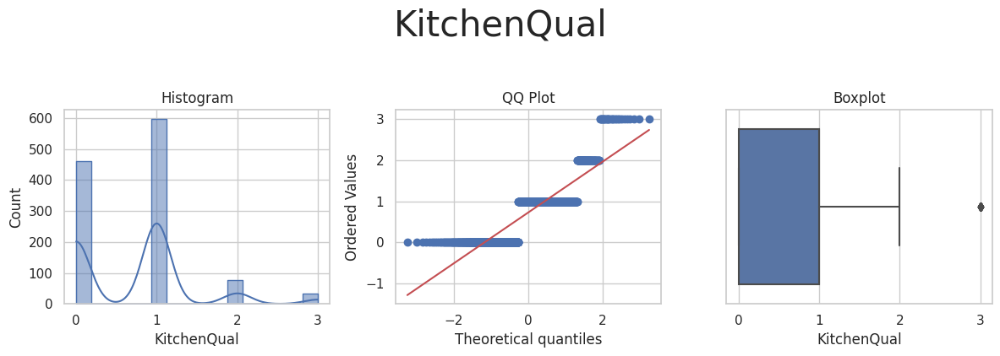

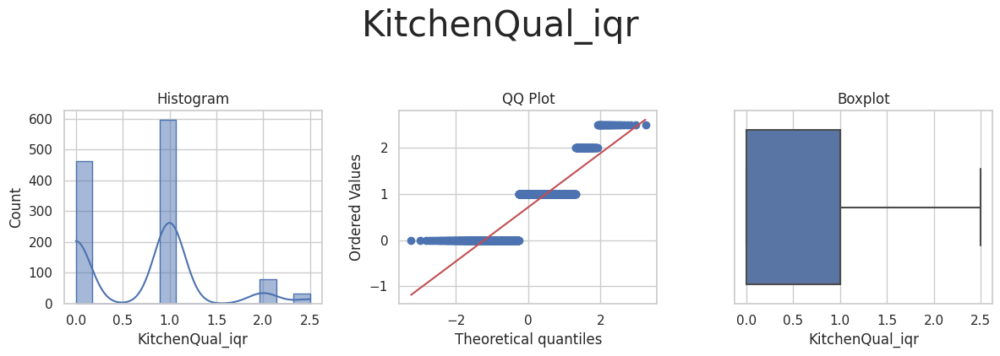



* Variable Analyzed: LotArea
* Applied transformation: ['LotArea_iqr'] 



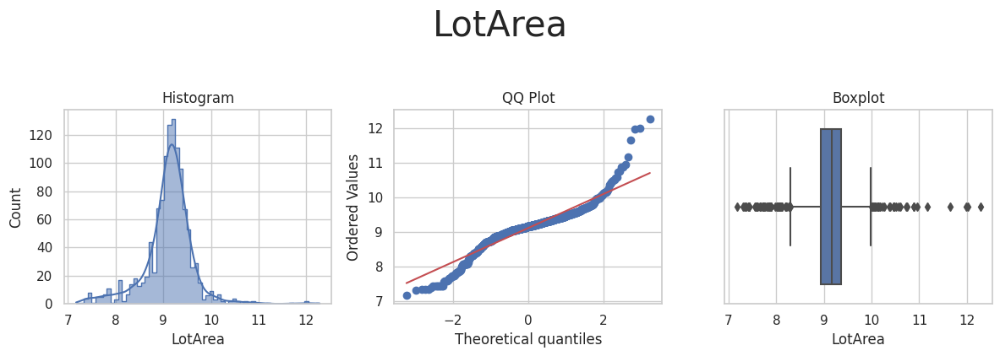

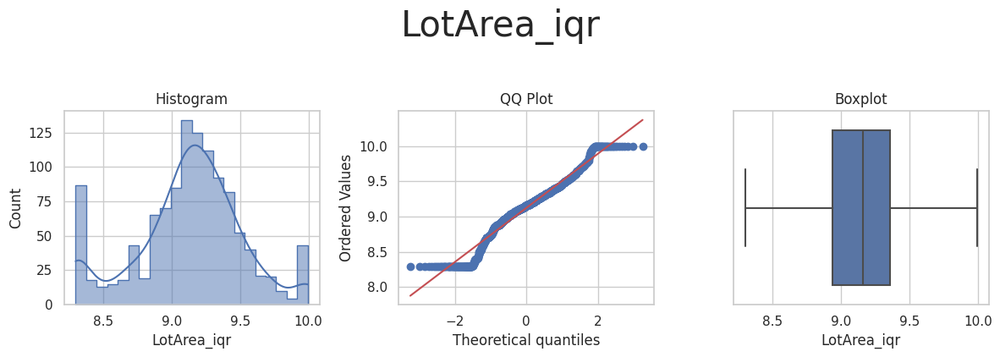



* Variable Analyzed: LotFrontage
* Applied transformation: ['LotFrontage_iqr'] 



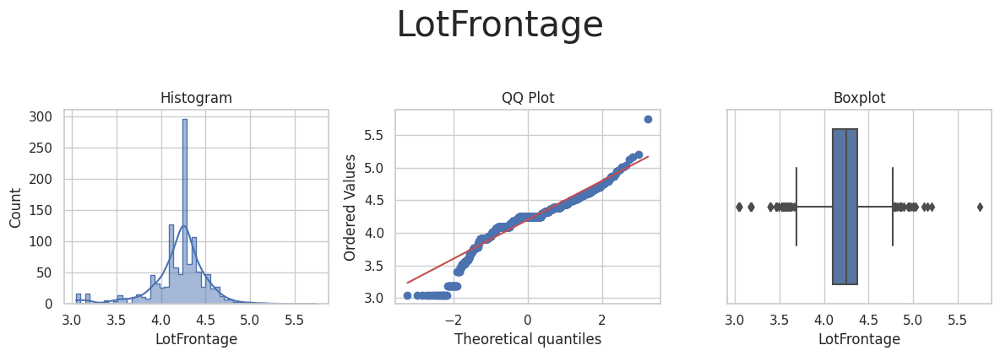

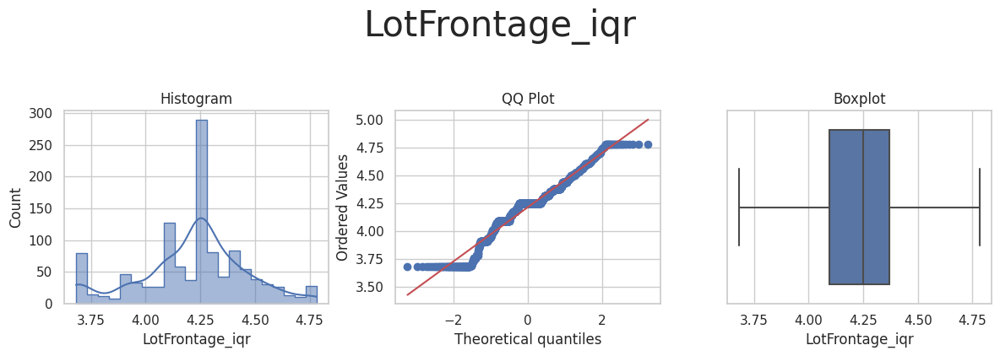



* Variable Analyzed: MasVnrArea
* Applied transformation: ['MasVnrArea_iqr'] 



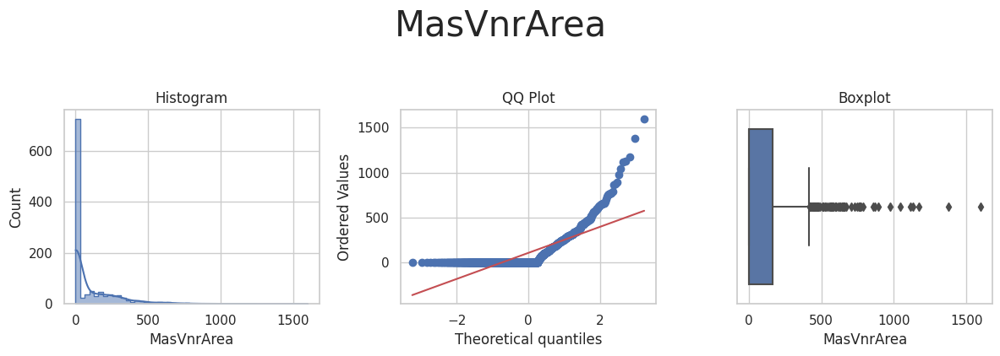

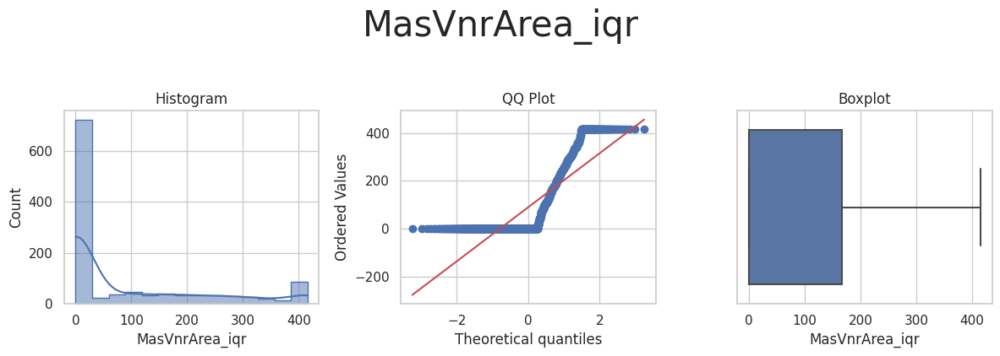



* Variable Analyzed: OpenPorchSF
* Applied transformation: ['OpenPorchSF_iqr'] 



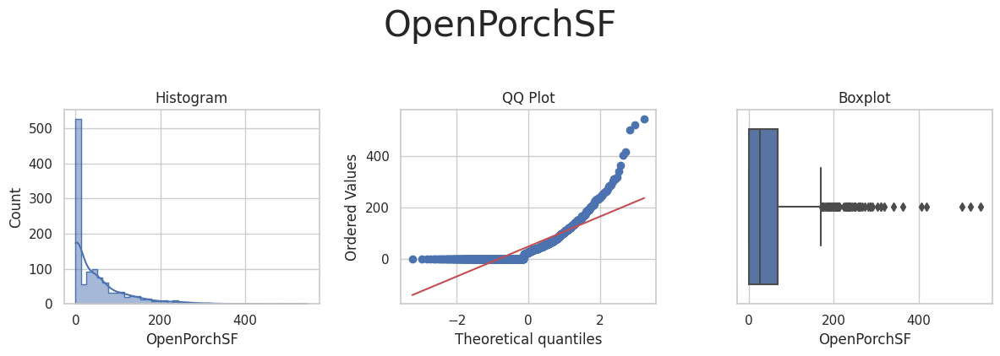

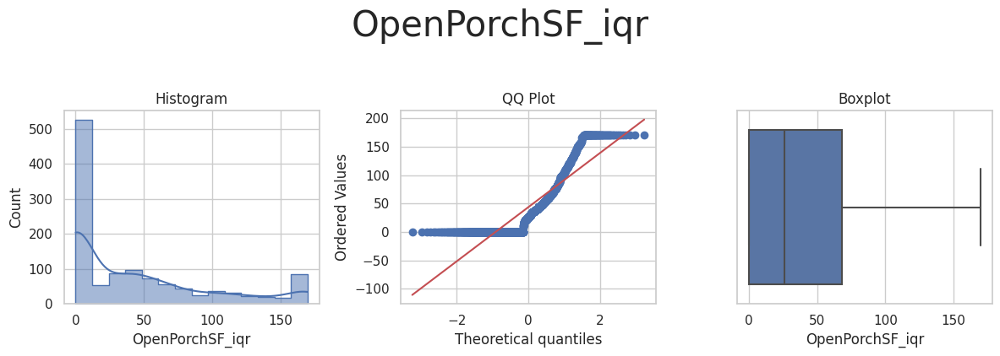



* Variable Analyzed: OverallCond
* Applied transformation: ['OverallCond_iqr'] 



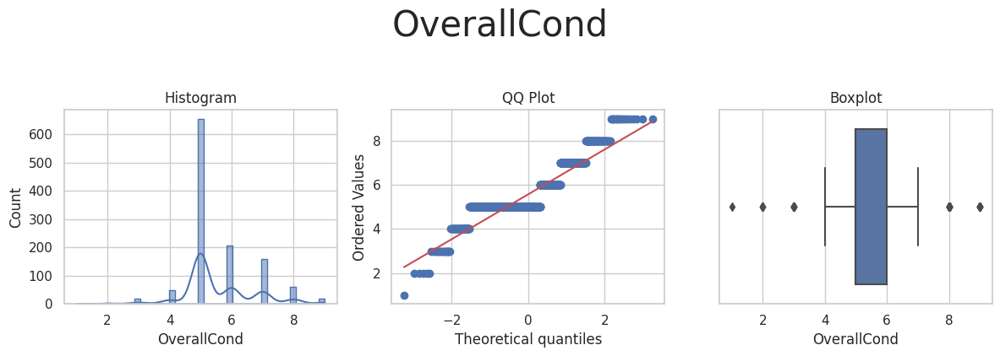

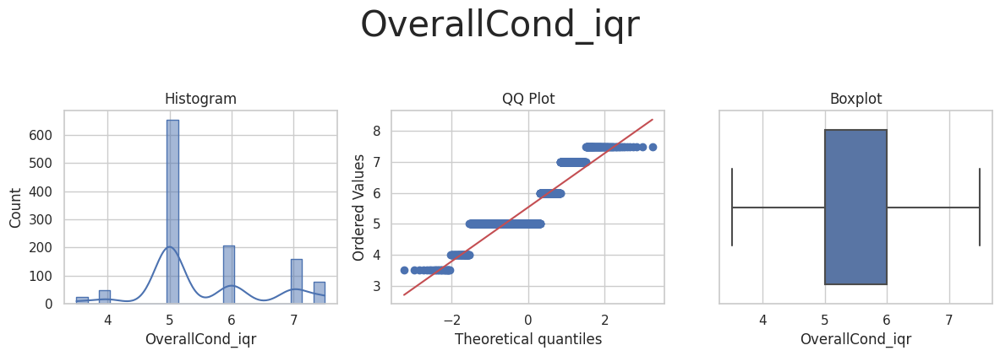



* Variable Analyzed: OverallQual
* Applied transformation: ['OverallQual_iqr'] 



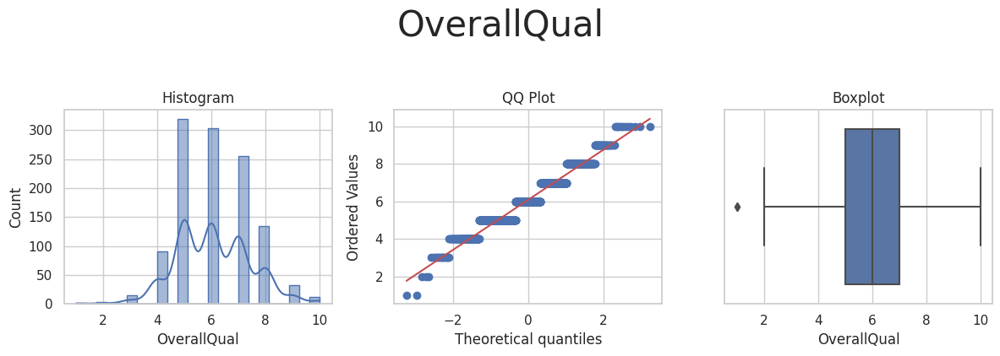

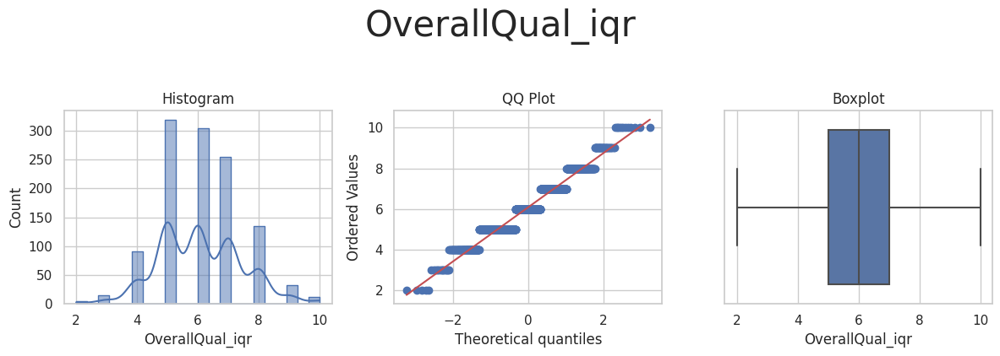



* Variable Analyzed: TotalBsmtSF
* Applied transformation: ['TotalBsmtSF_iqr'] 



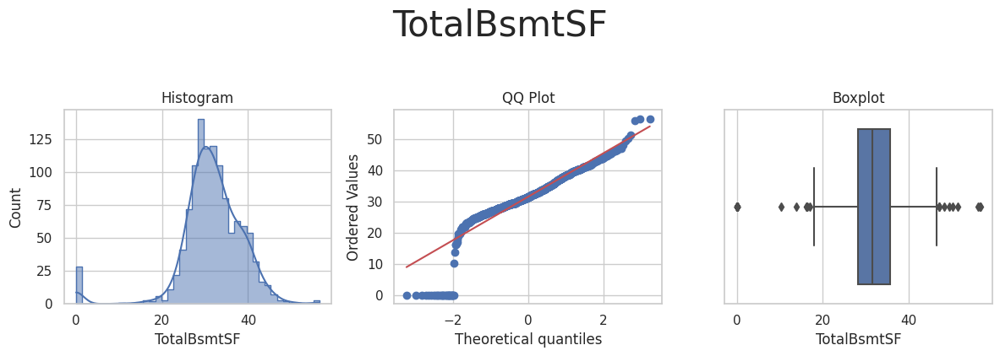

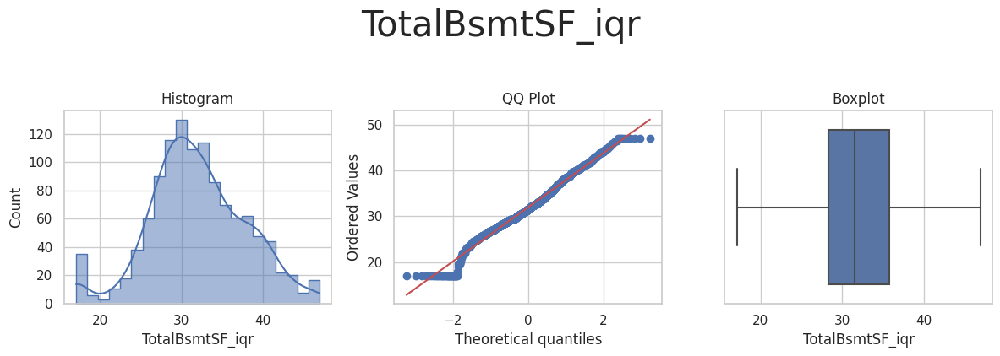



* Variable Analyzed: WoodDeckSF
* Applied transformation: ['WoodDeckSF_iqr'] 



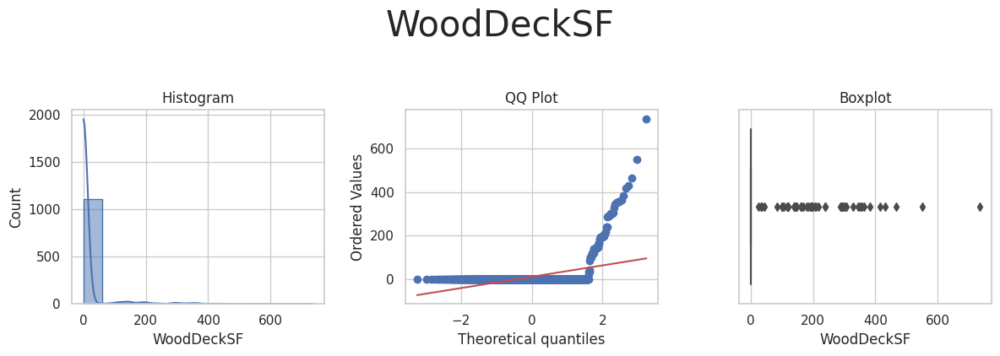

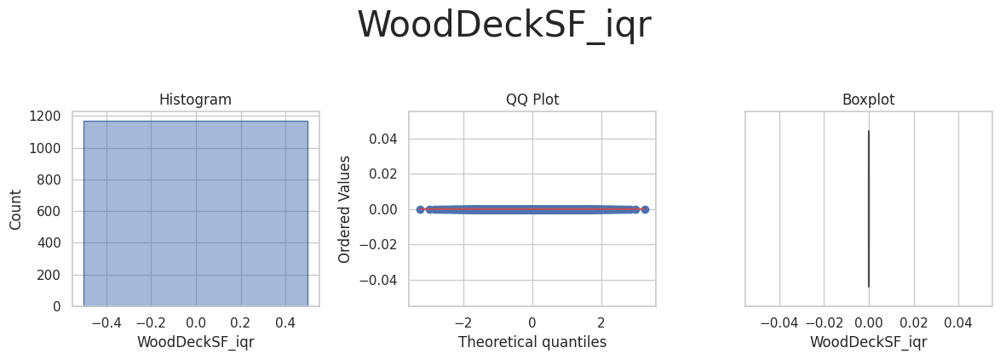



* Variable Analyzed: YearBuilt
* Applied transformation: ['YearBuilt_iqr'] 



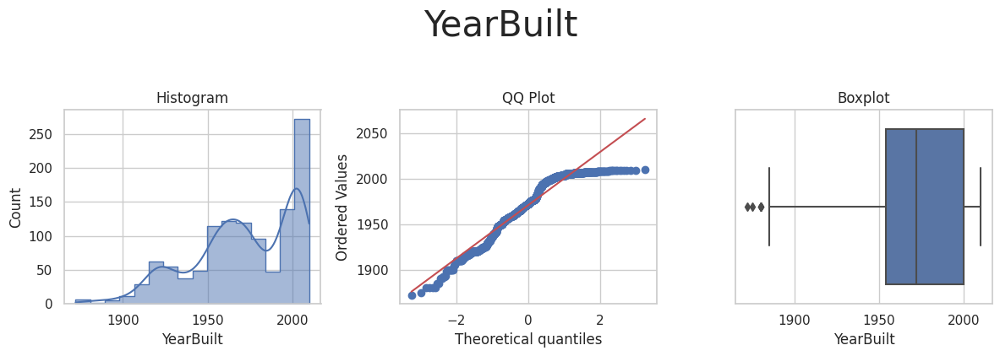

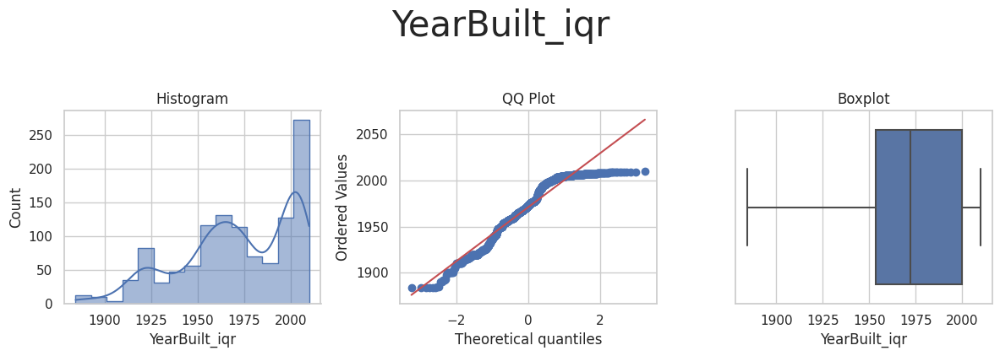



* Variable Analyzed: YearRemodAdd
* Applied transformation: ['YearRemodAdd_iqr'] 



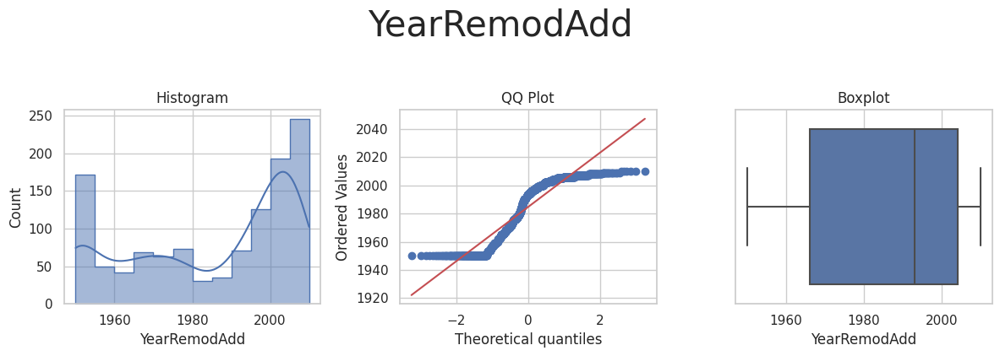

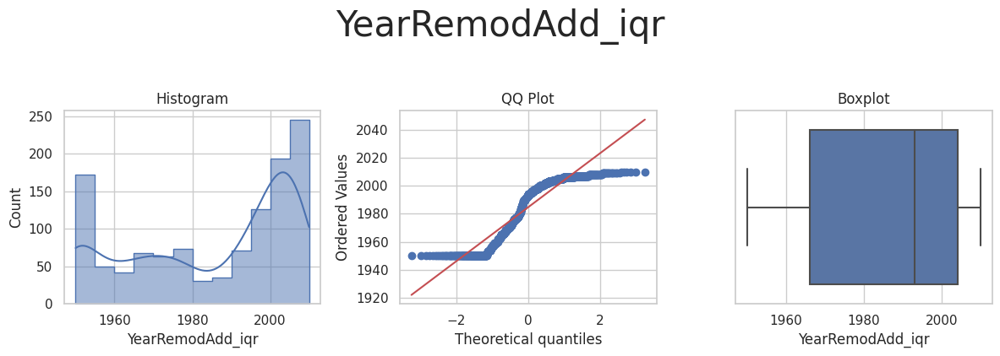

In [28]:
df_engineering = FeatureEngineeringAnalysis(df=df_engineering, analysis_type='outlier_winsorizer')

There is no significant improvement to the distributions for any variables when applying the winsorizer transformation. While trimming the outliers could remove some potential erroneous datapoints, there is not a sufficient improvement to the distributions to warrant performing this. Therefore, the transformation will not be required in the ML pipeline.

## Smart Correlated Selection

All variables (except the target) are selected to analyse the outlier transformations:

In [29]:
variables_engineering = (TrainSet.select_dtypes(include=['float', 'int']).columns.to_list())
variables_engineering.remove('SalePrice')
variables_engineering

['1stFlrSF',
 '2ndFlrSF',
 'BedroomAbvGr',
 'BsmtExposure',
 'BsmtFinSF1',
 'BsmtFinType1',
 'BsmtUnfSF',
 'EnclosedPorch',
 'GarageArea',
 'GarageFinish',
 'GarageYrBlt',
 'GrLivArea',
 'KitchenQual',
 'LotArea',
 'LotFrontage',
 'MasVnrArea',
 'OpenPorchSF',
 'OverallCond',
 'OverallQual',
 'TotalBsmtSF',
 'WoodDeckSF',
 'YearBuilt',
 'YearRemodAdd']

A dataframe with these variables is created:

In [30]:
df_engineering = TrainSet[variables_engineering].copy()
df_engineering.head(3)

,1stFlrSF,2ndFlrSF,BedroomAbvGr,BsmtExposure,BsmtFinSF1,BsmtFinType1,BsmtUnfSF,EnclosedPorch,GarageArea,GarageFinish,...,LotArea,LotFrontage,MasVnrArea,OpenPorchSF,OverallCond,OverallQual,TotalBsmtSF,WoodDeckSF,YearBuilt,YearRemodAdd
0,7.510978,0.0,3.0,0.0,6.928203,0,42.118879,0.0,27.820855,0,...,9.366831,4.499810,452.0,108,5,9,42.684892,0.0,2007,2007
1,6.795706,0.0,2.0,1.0,0.000000,0,29.899833,0.0,17.549929,0,...,8.794825,4.094345,0.0,0,5,5,29.899833,0.0,1962,1962
2,6.871091,0.0,2.0,1.0,26.702060,1,12.767145,0.0,20.784610,0,...,9.500020,4.382027,0.0,0,7,5,29.597297,0.0,1921,2006


The engineered variables are determined, to understand which variables are not required.

In [31]:
from feature_engine.selection import SmartCorrelatedSelection
corr_sel = SmartCorrelatedSelection(variables=None, method="spearman", threshold=0.6, selection_method="variance")

corr_sel.fit_transform(df_engineering)
corr_sel.correlated_feature_sets_

[{'1stFlrSF', 'TotalBsmtSF'},
 {'2ndFlrSF', 'GrLivArea'},
 {'GarageYrBlt', 'YearBuilt', 'YearRemodAdd'}]

In [32]:
corr_sel.features_to_drop_

['1stFlrSF', 'GarageYrBlt', 'GrLivArea', 'YearRemodAdd']

Four variables will be dropped: 1stFlrSF, GarageYrBlt, GrLivArea, YearRemodAdd.

---

# Next Steps

The following transformations will be used for feature engineering, as part of the ML pipeline:

- Log Base e Transformation: LotArea, LotFrontage (note: 1stFlrSF and GrLivArea were part of the analysis, but as they are being dropped, they are omitted from the transformation)
- Power Transformation: 2ndFlrSF, BsmtExposure, BsmtFinSF1, BsmtUnfSF, TotalBsmtSF, GarageArea
- Dropped Variables: 1stFlrSF, GarageYrBlt, GrLivArea, YearRemodAdd